In [365]:
#libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings('ignore')
from datetime import date
from datetime import datetime
import plotly.express as px # for 3d model
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder
from sklearn.preprocessing import StandardScaler, scale
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score 
from sklearn.metrics import classification_report, accuracy_score
import pickle

In [366]:
#Data Collection:
df=pd.read_excel('marketing_campaign1.xlsx')
pd.set_option('display.max_columns', None)
#Data Display:
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,3,11,0


In [367]:
# Columns= 29
# Rows = 2240

In [368]:
df.drop(columns=['ID'],axis=1,inplace=True)

In [369]:
df.Income.isnull().any()

True

In [370]:
df['Income'].isna().sum()

24

In [371]:
#there are 24 null values
df[df['Income'].isna()]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
10,1983,Graduation,Married,NaN,1,0,2013-11-15,11,5,5,6,0,2,1,1,1,0,2,7,0,0,0,0,0,0,3,11,0
27,1986,Graduation,Single,NaN,1,0,2013-02-20,19,5,1,3,3,263,362,0,27,0,0,1,0,0,0,0,0,0,3,11,0
43,1959,PhD,Single,NaN,0,0,2013-11-05,80,81,11,50,3,2,39,1,1,3,4,2,0,0,0,0,0,0,3,11,0
48,1951,Graduation,Single,NaN,2,1,2014-01-01,96,48,5,48,6,10,7,3,2,1,4,6,0,0,0,0,0,0,3,11,0
58,1982,Graduation,Single,NaN,1,0,2013-06-17,57,11,3,22,2,2,6,2,2,0,3,6,0,0,0,0,0,0,3,11,0
71,1973,2n Cycle,Married,NaN,1,0,2012-09-14,25,25,3,43,17,4,17,3,3,0,3,8,0,0,0,0,0,0,3,11,0
90,1957,PhD,Married,NaN,2,1,2012-11-19,4,230,42,192,49,37,53,12,7,2,8,9,0,0,0,0,0,0,3,11,0
91,1957,Graduation,Single,NaN,1,1,2014-05-27,45,7,0,8,2,0,1,1,1,0,2,7,0,0,0,0,0,0,3,11,0
92,1973,Master,Together,NaN,0,0,2013-11-23,87,445,37,359,98,28,18,1,2,4,8,1,0,0,0,0,0,0,3,11,0
128,1961,PhD,Married,NaN,0,1,2013-07-11,23,352,0,27,10,0,15,3,6,1,7,6,0,0,0,0,0,0,3,11,0


In [372]:
# treating inaccurate data through eliminating them
#since there are 2 columns with same values throughout 
#therefore drop the feature
df.drop(columns=['Z_CostContact','Z_Revenue'],inplace=True,axis=1)


<AxesSubplot:xlabel='Income', ylabel='Density'>

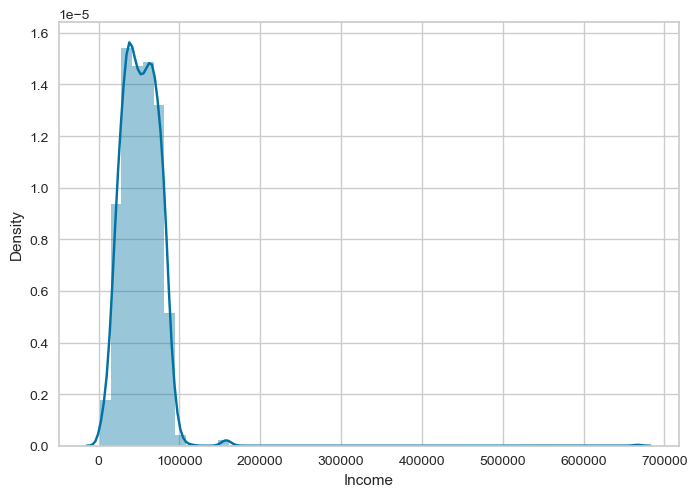

In [373]:
sns.distplot(df['Income'])

<AxesSubplot:xlabel='Income'>

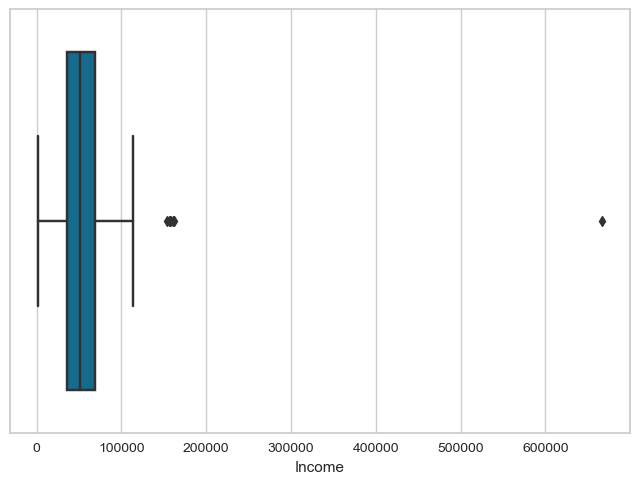

In [374]:
sns.boxplot(df['Income'])

In [375]:
# * there is one abnormal data in Income column with id : 9432 haing Income of 666666... we will try to get ideas out of our data without this particular data as it will influence other data inferences

m=np.max(df['Income'])
m

666666.0

In [376]:
#We see that there are outliers in Income Feature:
# *Removing outlier from income :

df.nlargest(10,['Income']) # showing rows with 5 highest income

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
2233,1977,Graduation,Together,666666.0,1,0,2013-06-02,23,9,14,18,8,1,12,4,3,1,3,6,0,0,0,0,0,0,0
617,1976,PhD,Together,162397.0,1,1,2013-06-03,31,85,1,16,2,1,2,0,0,0,1,1,0,0,0,0,0,0,0
687,1982,PhD,Married,160803.0,0,0,2012-08-04,21,55,16,1622,17,3,4,15,0,28,1,0,0,0,0,0,0,0,0
1300,1971,Master,Together,157733.0,1,0,2013-06-04,37,39,1,9,2,0,8,0,1,0,1,1,0,0,0,0,0,0,0
164,1973,PhD,Married,157243.0,0,1,2014-03-01,98,20,2,1582,1,2,1,15,0,22,0,0,0,0,0,0,0,0,0
1653,1977,Graduation,Together,157146.0,0,0,2013-04-29,13,1,0,1725,2,1,1,0,0,28,0,1,0,0,0,0,0,0,0
2132,1949,PhD,Married,156924.0,0,0,2013-08-29,85,2,1,2,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
655,1975,Graduation,Divorced,153924.0,0,0,2014-02-07,81,1,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0
1898,1945,PhD,Single,113734.0,0,0,2014-05-28,9,6,2,3,1,262,3,0,27,0,0,1,0,0,0,0,0,0,0
646,1970,Graduation,Together,105471.0,0,0,2013-01-21,36,1009,181,104,202,21,207,0,9,8,13,3,0,0,1,1,0,0,1


In [377]:
df.drop(df[(df['Income']>120000.0)].index, inplace=True)

df.reset_index(inplace = True,drop=True)

In [378]:
df['Income'].isnull().any()

True

In [379]:
#We will use mean value of the income column to fill the null values
df['Income'].fillna(value=df.Income.mean(),inplace=True)

df.iloc[2229:2235,:]

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
2229,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2230,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0
2231,1954,PhD,Married,52869.0,1,1,2012-10-15,40,84,3,61,2,1,21,3,3,1,4,7,0,0,0,0,0,0,1


<AxesSubplot:xlabel='Income'>

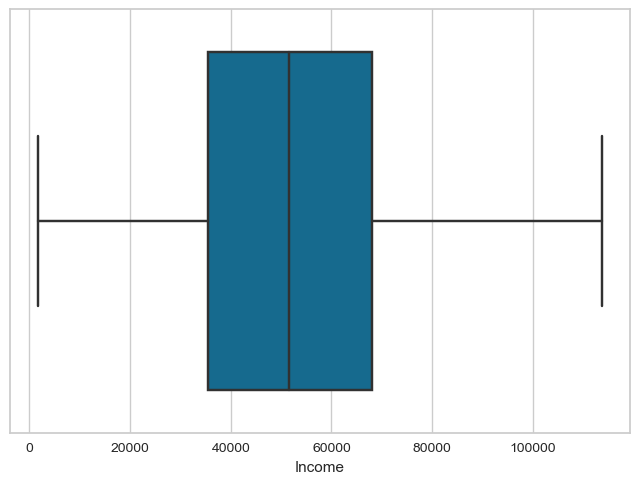

In [380]:
sns.boxplot(df['Income'])

# * creating one seperate column econimic status based on income to segregate them in 5 seperate division to understand how these 5 groups spend or save or complain
# * these 5 group will be seperated based on 
* more than 75% of highest income -> High Economic status = 4 
* between 75% and 50% -> Upper middle Economic status = 3
* between 50% and 25% -> Lower middle Economic status = 2
* between 25% and 5% -> Low Economic status = 1
* and less than 95% of highest income-> Extremly low Economic status = 0

# these is purely for visualiztion of the data and understanding it

In [381]:
# * creating one seperate column econimic status based on income to segregate them in 5 seperate division to understand how these 5 groups spend or save or complain
# * these 5 group will be seperated based on 
#* more than 75% of highest income -> High Economic status = 4 
#* between 75% and 50% -> Upper middle Economic status = 3
#* between 50% and 25% -> Lower middle Economic status = 2
#* between 25% and 5% -> Low Economic status = 1
#* and less than 95% of highest income-> Extremly low Economic status = 0

# these is purely for visualiztion of the data and understanding it

(df['Income'].mean()+df['Income'].std())

high=np.max(df['Income'])-(0.25*np.max(df['Income']))

average=np.max(df['Income'])-(0.50*np.max(df['Income']))

low=np.max(df['Income'])-(0.75*np.max(df['Income']))

least=np.max(df['Income'])-(0.95*np.max(df['Income']))

low

conditions=[
    (df['Income']<least),
    (df['Income']>=least) & (df['Income']<low ),
    (df['Income']>=low) & (df['Income'] < average ),
    (df['Income']>= average) & (df['Income']< high),
    (df['Income']>= high)   
    
]

status=[0,1,2,3,4]

#* Extremly low Economic status = 0

#* Low Economic status = 1
#* Lower middle Economic status = 2
#* Upper middle Economic status = 3
#* High Economic status = 4

df['economic_status']=np.select(conditions,status)

df[(df['Income']>low)]

df['economic_status'].unique()

array([3, 2, 1, 0, 4])


status 0 i.e., Extremly low Economic status, range = less than 5686.7  to  28433.5 
status 1 i.e., Low Economic status, range =  5686.7  to  28433.5 
status 2 i.e., Lower middle Economic status, range =  28433.5  to  56867.0 
status 3 i.e., Upper middle Economic status, range =  56867.0  to  85300.5 
status 4 i.e., High Economic status, range = more than  85300.5


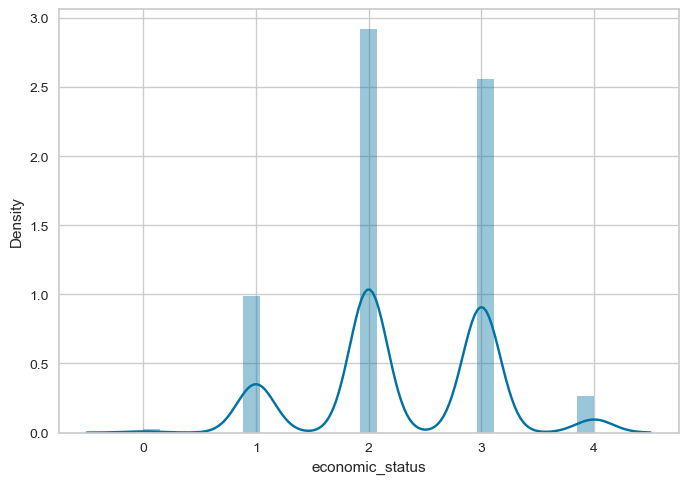

In [382]:
#bringing the column to 6th position
col = df.pop("economic_status")
df.insert(6, col.name, col)

sns.distplot(df['economic_status'])
print('\nstatus 0 i.e., Extremly low Economic status, range = less than',round(least,2),' to ',low,
    '\nstatus 1 i.e., Low Economic status, range = ',round(least,2),' to ',low,
    '\nstatus 2 i.e., Lower middle Economic status, range = ',low,' to ', average,
    '\nstatus 3 i.e., Upper middle Economic status, range = ',average,' to ', high,
    '\nstatus 4 i.e., High Economic status, range = more than ', high)


In [383]:
# Inference:Lower middle Economic status category people spends most1


<AxesSubplot:xlabel='economic_status', ylabel='Income'>

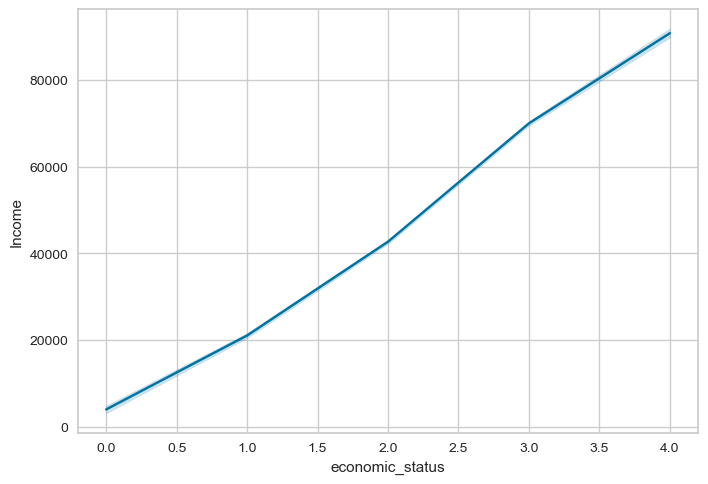

In [384]:
sns.lineplot(df["economic_status"],df['Income'])

In [385]:
#Inference:
# as the status increases the income increases

Text(0, 0.5, 'Complain')

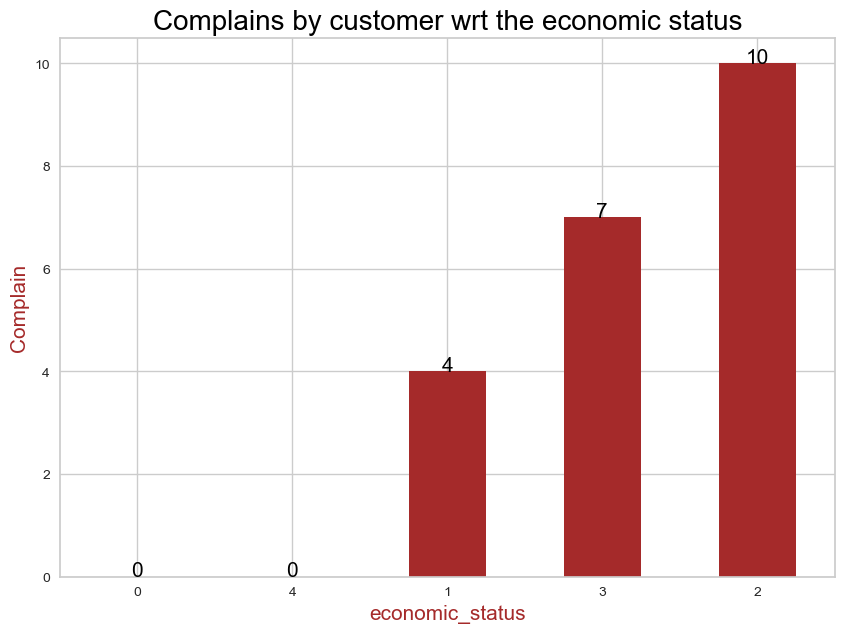

In [386]:
#Complains accepted by customer wrt the no of teens at home

ax = df[['economic_status','Complain']].groupby('economic_status').sum().sort_values(by='Complain',ascending=True).plot(kind='bar',color='brown',legend=None,figsize=(10,7))
plt.xticks(rotation=360)
for i in ax.patches:
    x=i.get_height().astype('int')
    y=i.get_x()+i.get_width()/2
    plt.annotate('{}'.format(x),(y,x),ha='center',color='black',fontsize=15)
plt.title('Complains by customer wrt the economic status',color='black',size=20)    
plt.xlabel('economic_status',size=15,color='brown')
plt.ylabel('Complain',size=15,color='brown')

* status 2 i.e., Lower middle Economic status complains the most and high economic people don't complain at all

<AxesSubplot:xlabel='economic_status', ylabel='Complain'>

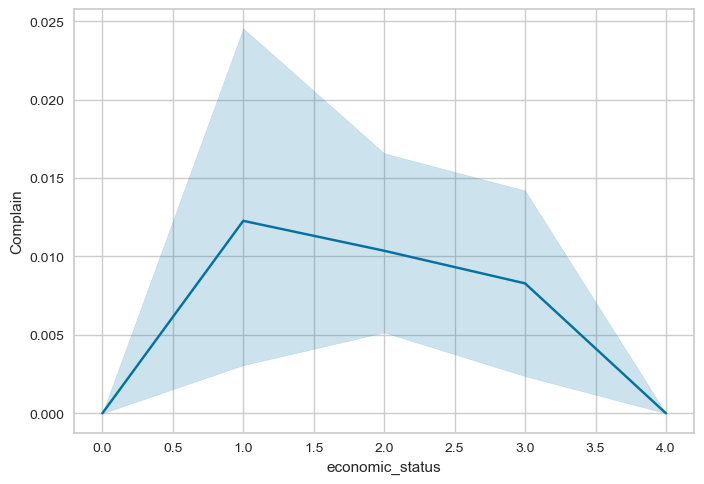

In [387]:
sns.lineplot(y=df['Complain'],x=df['economic_status']) 

* Above two plots explains that status 1 peole with salary range of 8119.85  to  40599.25 complains the most and who has the maximum salary of status 4 complains the least

In [388]:
# creating new eature for total spending in last two years"
df['Total_Expenses']=df['MntWines']+df['MntFruits']+df['MntFruits']+df['MntFishProducts']+df['MntMeatProducts']+df['MntSweetProducts']+df['MntGoldProds']

col = df.pop("Total_Expenses")
df.insert(5, col.name, col)
df.head(1)

,Year_Birth,Education,Marital_Status,Income,Kidhome,Total_Expenses,Teenhome,economic_status,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,1705,0,3,2012-09-04,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1


Text(0.5, 1.0, 'Observing expenditure on products')

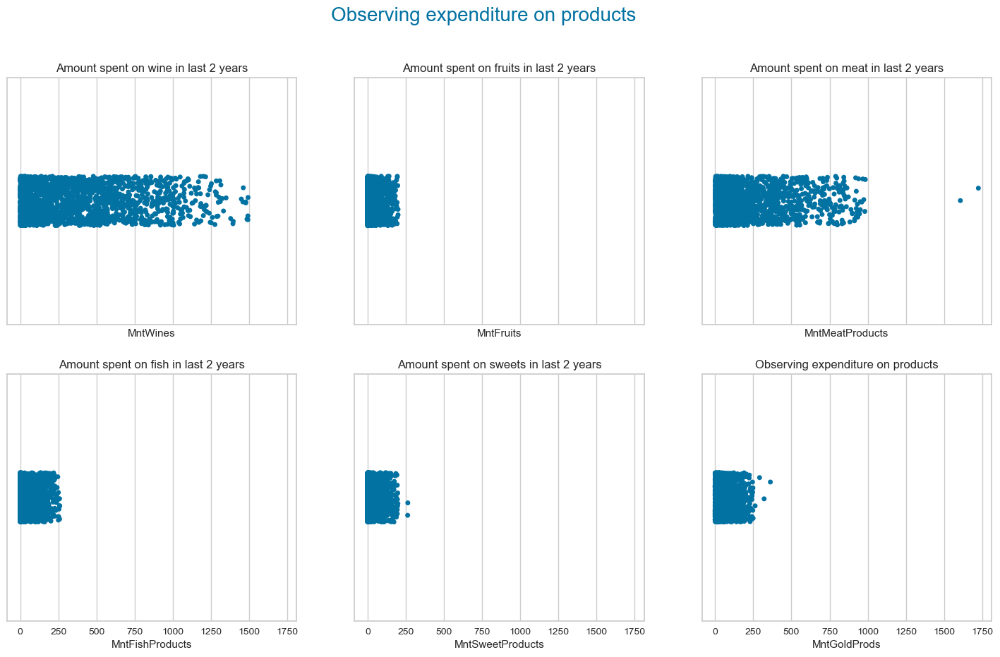

In [389]:
figure, axes = plt.subplots(2, 3, sharex=True, figsize=(18,10))
figure.suptitle('Observing expenditure on products',size=20,color='b')
axes[0][0].set_title('Amount spent on wine in last 2 years')
sns.stripplot(df['MntWines'],ax=axes[0,0])
axes[0][1].set_title('Amount spent on fruits in last 2 years')
sns.stripplot(df['MntFruits'],ax=axes[0,1])
axes[0][2].set_title('Amount spent on meat in last 2 years')
sns.stripplot(df['MntMeatProducts'],ax=axes[0,2])
axes[1][0].set_title('Amount spent on fish in last 2 years')
sns.stripplot(df['MntFishProducts'],ax=axes[1,0])
axes[1][1].set_title('Amount spent on sweets in last 2 years')
sns.stripplot(df['MntSweetProducts'],ax=axes[1,1])

axes[1][2].set_title('Amount spent on gold in last 2 years')
sns.stripplot(df['MntGoldProds'],ax=axes[1,2])
plt.title('Observing expenditure on products')

* We observed that customer is spending more on meat and wine

Text(0.5, 1.0, 'Outliers')

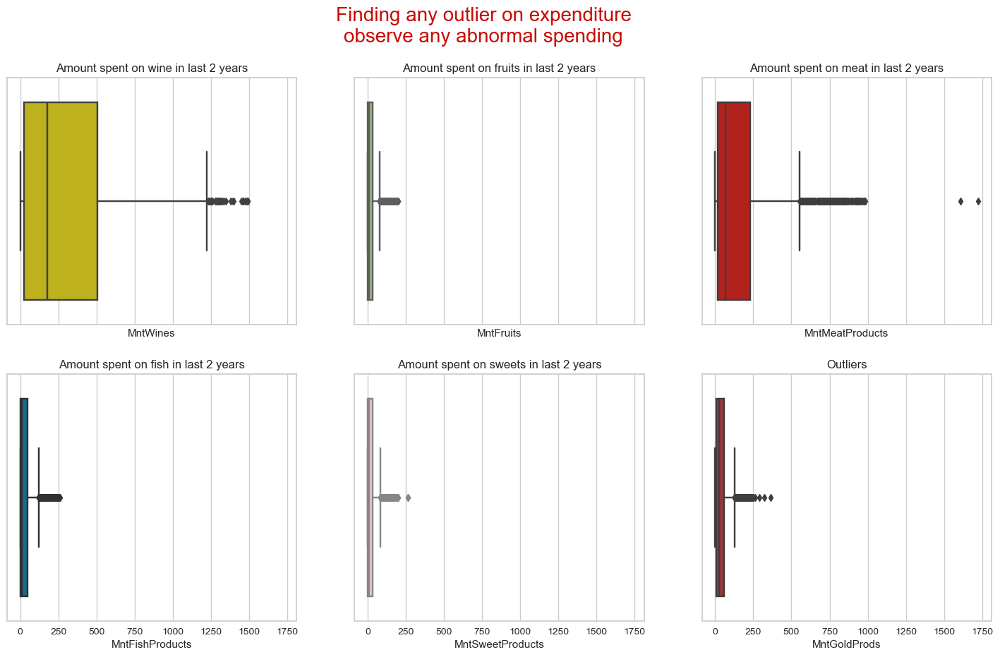

In [390]:
figure, axes = plt.subplots(2, 3, sharex=True, figsize=(18,10))
figure.suptitle('Finding any outlier on expenditure\nobserve any abnormal spending',size=20,color='r')
axes[0][0].set_title('Amount spent on wine in last 2 years')
sns.boxplot(df['MntWines'],ax=axes[0,0],color='y')
axes[0][1].set_title('Amount spent on fruits in last 2 years')
sns.boxplot(df['MntFruits'],ax=axes[0,1],color='g')
axes[0][2].set_title('Amount spent on meat in last 2 years')
sns.boxplot(df['MntMeatProducts'],ax=axes[0,2],color='r')
axes[1][0].set_title('Amount spent on fish in last 2 years')
sns.boxplot(df['MntFishProducts'],ax=axes[1,0])
axes[1][1].set_title('Amount spent on sweets in last 2 years')
sns.boxplot(df['MntSweetProducts'],ax=axes[1,1],color='pink')

axes[1][2].set_title('Amount spent on gold in last 2 years')
sns.boxplot(df['MntGoldProds'],ax=axes[1,2],color='brown')
plt.title('Outliers')

# Inference:

* Wine:
Amount spent by the customers on wine ranges the most , people spent much more on wine than the rest of the items

* Fruits:
customer used to spent least on fruits

* Meat:
customer used to spent on meat that is not that more but there are few outliers with might indicate that there are few meat products which are very high priced . Maybe during occations special types of meat products needed to bought.

* Fish:
customer used to spent on fish items is fairly not more than rest of the items

* Sweets:
again they spent far too less on sweets

* Gold: they spent on gold is on an average not that much compared to wine

* Inference :
* Customer spends more on wine

# further proof: wih maximum and average expenditure:

In [391]:
print('Maximum amount spent on wine = ',np.max(df['MntWines']))
print('Maximum amount spent on fruits = ',np.max(df['MntFruits']))
print('Maximum amount spent on meat products = ',np.max(df['MntMeatProducts']))
print('Maximum amount spent on fish items = ',np.max(df['MntFishProducts']))
print('Maximum amount spent on Sweets = ',np.max(df['MntSweetProducts']))
print('Maximum amount spent on gold products = ',np.max(df['MntGoldProds']))

print('Average amount spent on wine = ',round(np.mean(df['MntWines']),3))
print('Average amount spent on fruits = ',round(np.mean(df['MntFruits']),3))
print('Average amount spent on meat products = ',round(np.median(df['MntMeatProducts']),3))
print('Average amount spent on fish items = ',round(np.mean(df['MntFishProducts']),3))
print('Average amount spent on Sweets = ',round(np.mean(df['MntSweetProducts']),3))
print('Average amount spent on gold products = ',round(np.mean(df['MntGoldProds']),3))

Maximum amount spent on wine =  1493
Maximum amount spent on fruits =  199
Maximum amount spent on meat products =  1725
Maximum amount spent on fish items =  259
Maximum amount spent on Sweets =  263
Maximum amount spent on gold products =  362
Average amount spent on wine =  304.93
Average amount spent on fruits =  26.38
Average amount spent on meat products =  67.0
Average amount spent on fish items =  37.645
Average amount spent on Sweets =  27.155
Average amount spent on gold products =  44.166


Text(0.5, 0, 'Amount')

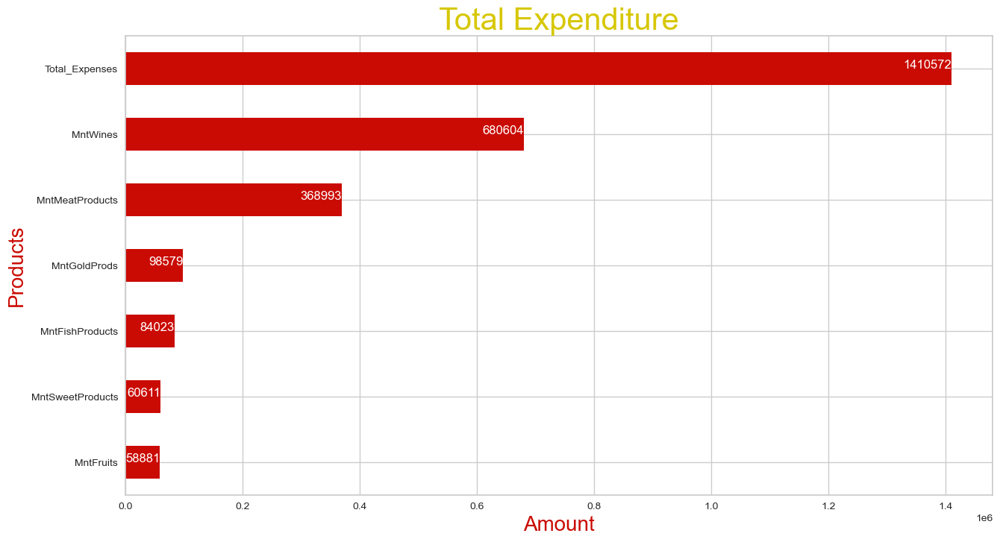

In [392]:
#Total Expenditure
plt.figure(figsize=(15,8))
ax = df[['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds','Total_Expenses']].sum().sort_values(ascending=True).plot(kind='barh',color='r')
for i in ax.patches:
    x=i.get_width()
    y=i.get_y()+i.get_height()/2
    plt.annotate('{}'.format(x),(x,y),ha='right',color='white')
plt.title('Total Expenditure',color='y',size=30)    
plt.ylabel('Products',color='r',size=20)
plt.xlabel('Amount',color='r',size=20)

* wine is the most spend on product and fruit is the least bought product

Text(0, 0.5, 'Total_Expenses')

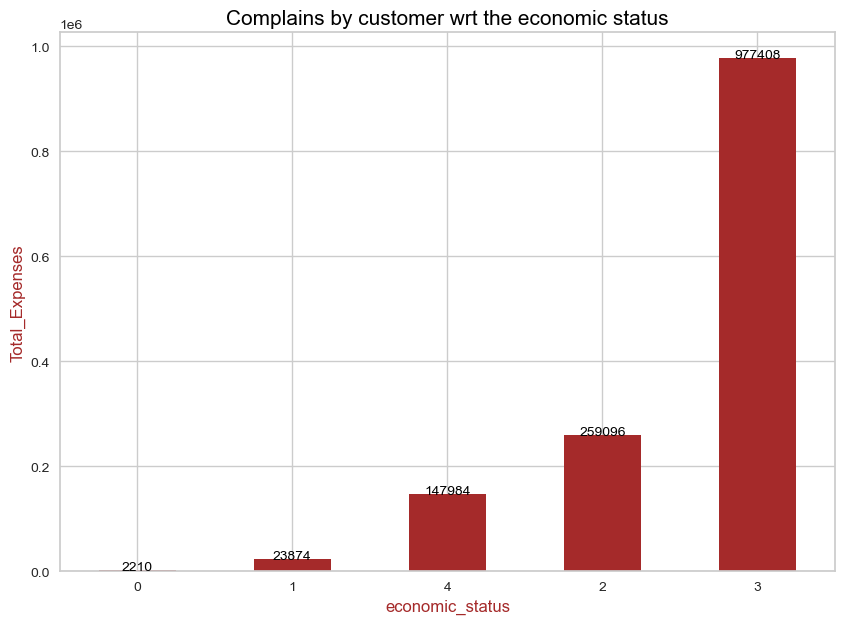

In [393]:
#Campaigns accepted by customer wrt the no of teens at home

ax = df[['economic_status','Total_Expenses']].groupby('economic_status').sum().sort_values(by='Total_Expenses',ascending=True).plot(kind='bar',color='brown',legend=None,figsize=(10,7))
plt.xticks(rotation=360)
for i in ax.patches:
    x=i.get_height().astype('int')
    y=i.get_x()+i.get_width()/2
    plt.annotate('{}'.format(x),(y,x),ha='center',color='black',fontsize=10)
plt.title('Complains by customer wrt the economic status',color='black',size=15)    
plt.xlabel('economic_status',size=12,color='brown')
plt.ylabel('Total_Expenses',size=12,color='brown')

* status 3 : Upper middle people spend the most 

Text(0.5, 1.0, 'Buyig Capacity')

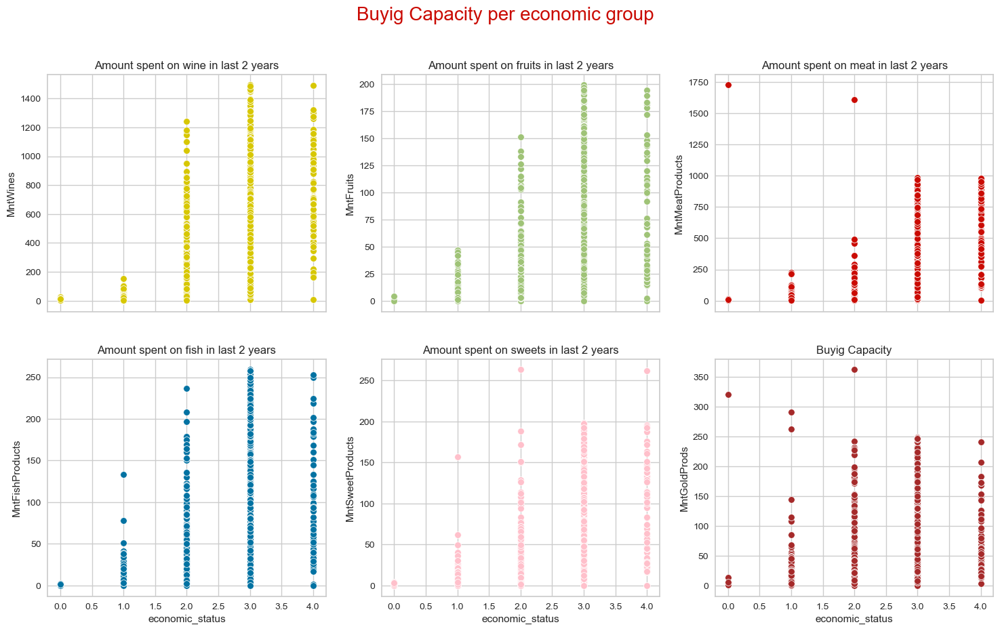

In [394]:
figure, axes = plt.subplots(2, 3, sharex=True, figsize=(18,10))
figure.suptitle('Buyig Capacity per economic group',size=20,color='r')
axes[0][0].set_title('Amount spent on wine in last 2 years')
sns.scatterplot(y=df['MntWines'],x=df['economic_status'],color='y',ax=axes[0,0])

axes[0][1].set_title('Amount spent on fruits in last 2 years')

sns.scatterplot(y=df['MntFruits'],x=df['economic_status'],color='g',ax=axes[0,1])
axes[0][2].set_title('Amount spent on meat in last 2 years')

sns.scatterplot(y=df['MntMeatProducts'],x=df['economic_status'],color='r',ax=axes[0,2])
axes[1][0].set_title('Amount spent on fish in last 2 years')

sns.scatterplot(y=df['MntFishProducts'],x=df['economic_status'],ax=axes[1,0])
axes[1][1].set_title('Amount spent on sweets in last 2 years')

sns.scatterplot(y=df['MntSweetProducts'],x=df['economic_status'],color='pink',ax=axes[1,1])

axes[1][2].set_title('Amount spent on gold in last 2 years')

sns.scatterplot(y=df['MntGoldProds'],x=df['economic_status'],color='brown',ax=axes[1,2])
plt.title('Buyig Capacity')

<AxesSubplot:xlabel='Income', ylabel='Total_Expenses'>

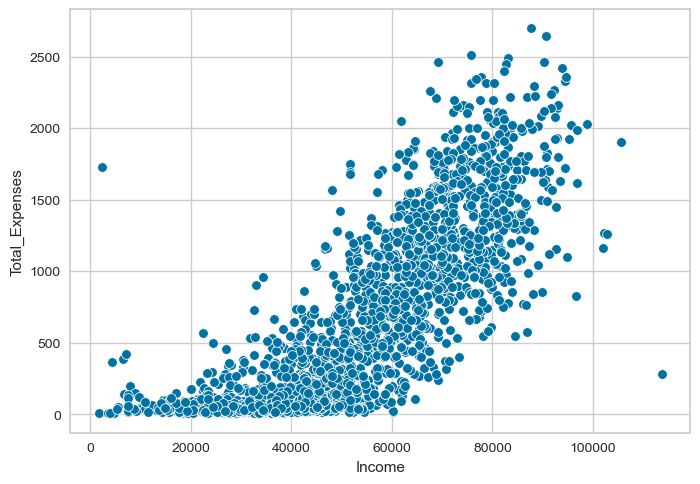

In [395]:
sns.scatterplot(df['Income'],df['Total_Expenses'])

* Income and expenditure are linearly related...as income increases expenditure increases

<AxesSubplot:xlabel='Kidhome', ylabel='Total_Expenses'>

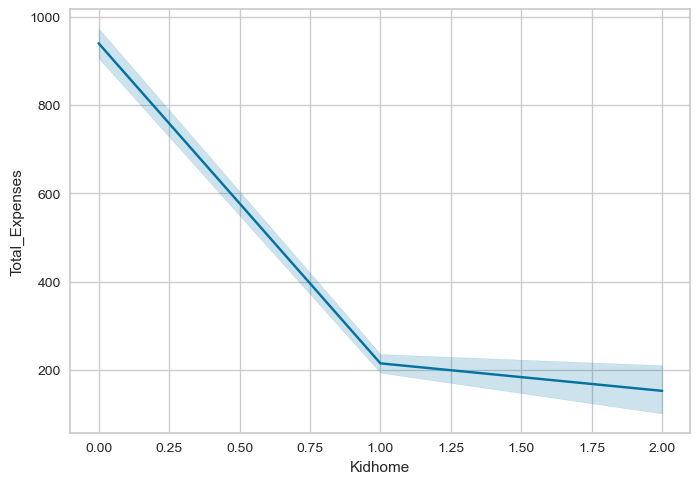

In [396]:
sns.lineplot(df['Kidhome'],df['Total_Expenses'])

* as no of kids at home increases expenditure decreases

Text(0, 0.5, 'Expenditure')

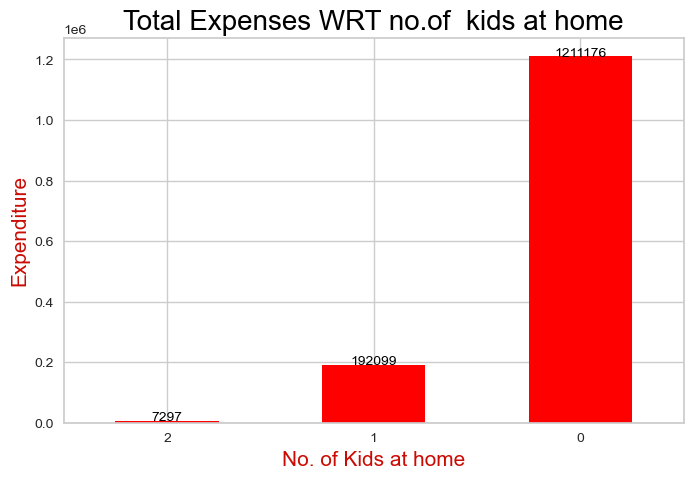

In [397]:
#Total Expenses WRT no.of  kids at home
#plt.figure(figsize=(20,10))
ax = df[['Kidhome','Total_Expenses']].groupby('Kidhome').sum().sort_values(by='Total_Expenses',ascending=True).plot(kind='bar',color='red',legend=None,figsize=(8,5))
plt.xticks(rotation=360)
for i in ax.patches:
    x=i.get_height().astype('int')
    y=i.get_x()+i.get_width()/2
    plt.annotate('{}'.format(x),(y,x),ha='center',color='black',fontsize=10)
plt.title('Total Expenses WRT no.of  kids at home',color='black',size=20)    
plt.xlabel('No. of Kids at home',color='r',size=15)
plt.ylabel('Expenditure',color='r',size=15)

Text(0, 0.5, 'Expenditure')

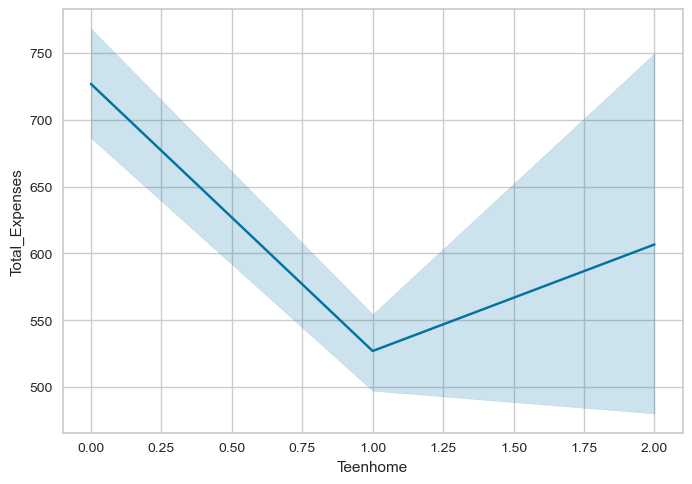

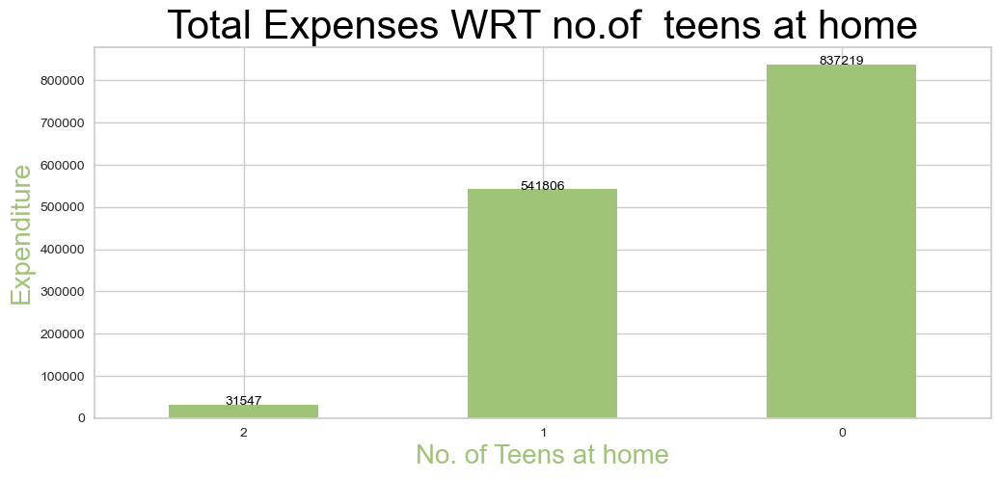

In [398]:
sns.lineplot(df['Teenhome'],df['Total_Expenses'])

#Total Expenses WRT no.of  teens at home
#plt.figure(figsize=(20,10))
ax = df[['Teenhome','Total_Expenses']].groupby('Teenhome').sum().sort_values(by='Total_Expenses',ascending=True).plot(kind='bar',color='g',legend=None,figsize=(12,5))
plt.xticks(rotation=360)
for i in ax.patches:
    x=i.get_height().astype('int')
    y=i.get_x()+i.get_width()/2
    plt.annotate('{}'.format(x),(y,x),ha='center',color='black',fontsize=10)
plt.title('Total Expenses WRT no.of  teens at home',color='black',size=30)    
plt.xlabel('No. of Teens at home',color='g',size=20)
plt.ylabel('Expenditure',color='g',size=20)

as teens increases expenditure decreases

Text(0, 0.5, 'Expenditure')

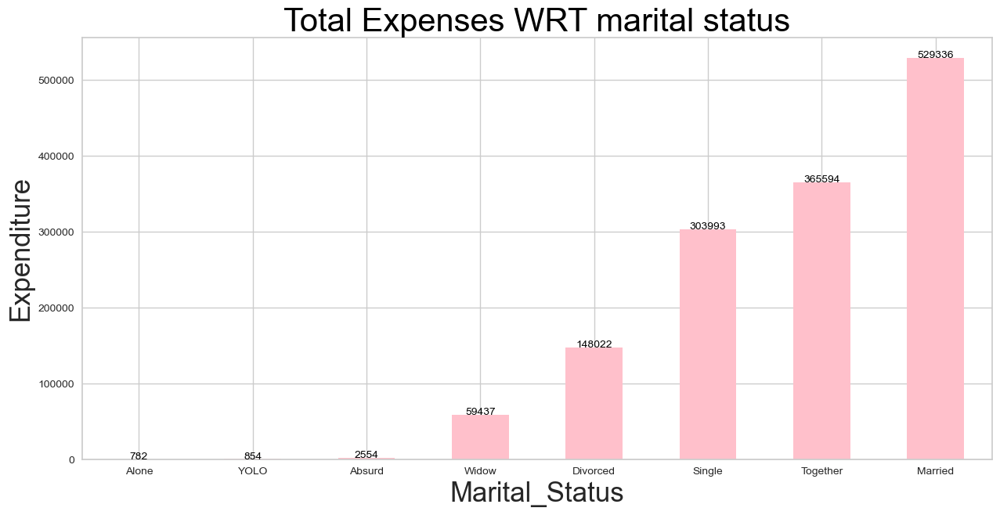

In [399]:
#Total Expenses WRT marital status
#plt.figure(figsize=(20,10))
ax = df[['Marital_Status','Total_Expenses']].groupby('Marital_Status').sum().sort_values(by='Total_Expenses',ascending=True).plot(kind='bar',color='pink',legend=None,figsize=(15,7))
plt.xticks(rotation=360)
for i in ax.patches:
    x=i.get_height().astype('int')
    y=i.get_x()+i.get_width()/2
    plt.annotate('{}'.format(x),(y,x),ha='center',color='black',fontsize=10)
plt.title('Total Expenses WRT marital status',color='black',size=30)    
plt.xlabel('Marital_Status',size=25)
plt.ylabel('Expenditure',size=25)

* expenditure increases as people are together or married

In [400]:
high=np.max(df['Recency'])
avg=np.average(df['Recency'])

conditions=[
    (df['Recency']>=avg) ,
    (df['Recency']>=0) & (df['Recency'] < avg )
]

status=[0,1]

# more than average i.e. 49 =frequent=0
# less than average i.e. 49 =less frequent=1

df['Recency']=np.select(conditions,status)
pd.set_option('display.max_columns', None)
df

,Year_Birth,Education,Marital_Status,Income,Kidhome,Total_Expenses,Teenhome,economic_status,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,1705,0,3,2012-09-04,0,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,28,1,2,2014-03-08,1,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,1965,Graduation,Together,71613.0,0,825,0,3,2013-08-21,1,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,1984,Graduation,Together,26646.0,1,57,0,1,2014-02-10,1,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,1981,PhD,Married,58293.0,1,465,0,3,2014-01-19,0,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2227,1967,Graduation,Married,61223.0,0,1384,1,3,2013-06-13,1,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2228,1946,PhD,Together,64014.0,2,444,1,3,2014-06-10,0,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
2229,1981,Graduation,Divorced,56981.0,0,1289,0,3,2014-01-25,0,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2230,1956,Master,Together,69245.0,0,873,1,3,2014-01-24,1,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


In [401]:
#generating age from Year_Birth
df['age']=(datetime.now().year-df['Year_Birth'])
col=df.pop('age')
df.insert(1,col.name,col)

#generating years enrolled by the customers to the company
df['Years_Enrolled']=datetime.now().year-pd.to_datetime(df['Dt_Customer']).dt.year
col=df.pop('Years_Enrolled')
df.insert(2,col.name,col)

<AxesSubplot:xlabel='Years_Enrolled', ylabel='Recency'>

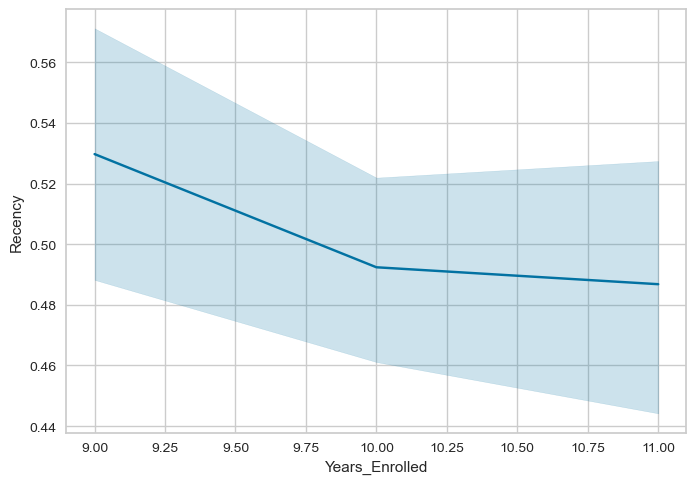

In [402]:
sns.lineplot(df['Years_Enrolled'],df['Recency'])

 Who have recently enrolled are more recent buyers

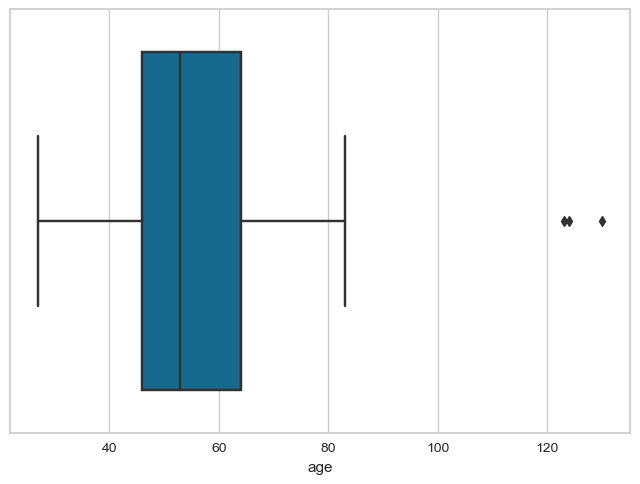

In [403]:
sns.boxplot(df['age'])

df.drop(df[(df['age'] >100) ].index, inplace=True)

df.reset_index(inplace = True,drop=True)

df['Ttl_Campaign'] = df['AcceptedCmp1'] + df['AcceptedCmp2'] + df['AcceptedCmp3'] + df['AcceptedCmp4'] + df['AcceptedCmp5'] 

In [404]:
mapping={
    'Absurd':'0','Alone':'0','Divorced':'0','Single':'0','Widow':'0','YOLO':'0','Married':'1','Together':'1'
}

df['togetherness']=df['Marital_Status'].map(mapping)

In [405]:
df['togetherness']=df['togetherness'].astype(int)

In [406]:
col = df.pop("togetherness")
df.insert(4, col.name, col)

#generating age from Year_Birth
df['age']=(datetime.now().year-df['Year_Birth'])
col=df.pop('age')
df.insert(1,col.name,col)

#generating years enrolled by the customers to the company
df['Years_Enrolled']=datetime.now().year-pd.to_datetime(df['Dt_Customer']).dt.year
col=df.pop('Years_Enrolled')
df.insert(2,col.name,col)

In [407]:
mapping={
    'Graduation':'1','PhD':'2','Master':'2','Basic':'0','2n Cycle':'1'
}

df['Qualification']=df['Education'].map(mapping)

df['Qualification']=df['Qualification'].astype(int)
#bringing the column to 6th position
col = df.pop("Qualification")
df.insert(4, col.name, col)


In [408]:
df_1=df.copy()
df.head(1)

,Year_Birth,age,Years_Enrolled,Education,Qualification,togetherness,Marital_Status,Income,Kidhome,Total_Expenses,Teenhome,economic_status,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign
0,1957,66,11,Graduation,1,0,Single,58138.0,0,1705,0,3,2012-09-04,0,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0


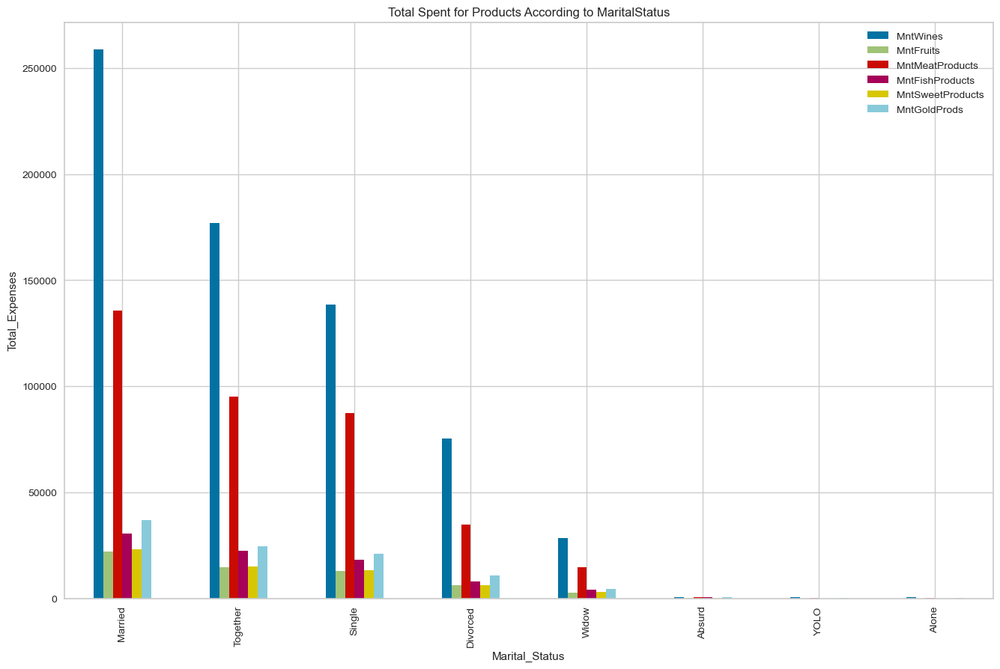

In [409]:
# total spent according to maritalstatus
data = df[["MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds", 'Marital_Status']].groupby(["Marital_Status"]).sum().reset_index().sort_values(by=["MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds"], ascending=False)
data.plot(x="Marital_Status", ylabel= "Total_Expenses", kind="bar", figsize=(16, 10), legend=True, title="Total Spent for Products According to MaritalStatus")
plt.show()

In [410]:
# create Year, Month, Day columns
df['Year'] = df["Dt_Customer"].dt.year
df['Month'] = df["Dt_Customer"].dt.month

#create Age column 
age = []
for i in df["Year_Birth"]:
    if i <= 1959:
        age.append("Elderly")
    elif i > 1959 and i <=1977:
        age.append("MiddleAge")
    else:
        age.append("Young")
df["age_divide"] = age


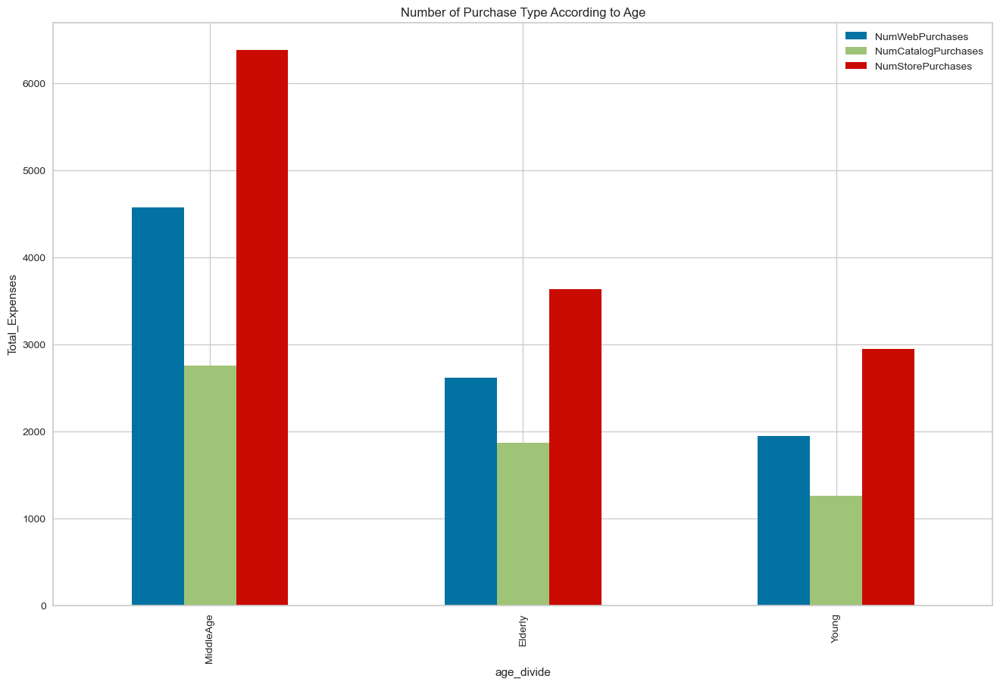

In [411]:
# purchase type according to age
data = df[["age_divide", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"]].groupby(["age_divide"]).sum().reset_index().sort_values(by=["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"], ascending=False)
data.plot(x="age_divide", ylabel= "Total_Expenses", kind="bar", figsize=(16, 10), legend=True, grid=True, 
        title="Number of Purchase Type According to Age")
plt.show()

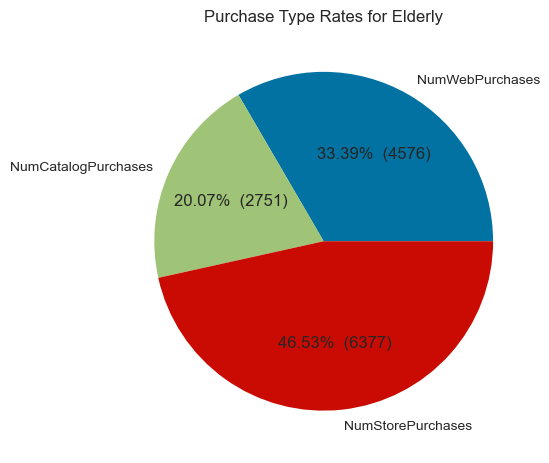

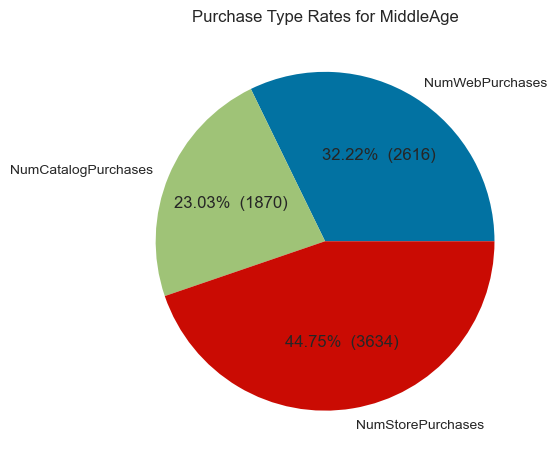

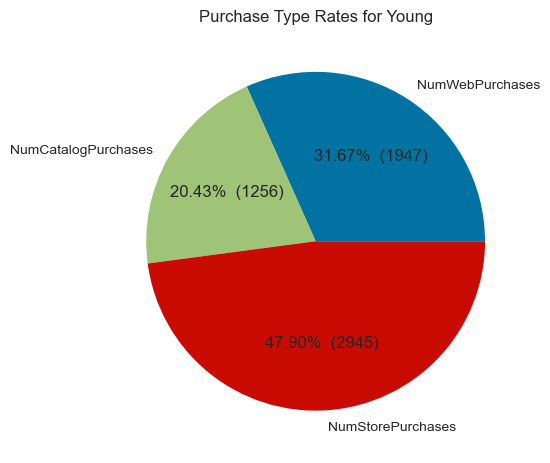

In [412]:
# Purchase Type Rates according to Age
# set target row index
target_row_index = [0, 1, 2]

# make the pie circular by setting the aspect ratio to 1
plt.figure(figsize=plt.figaspect(1))

# specify data for chart
values = data.iloc[target_row_index, 1:]
labels = data.columns[1:]

# define function to format values on chart
def make_autopct(values):
    def my_autopct(pct):
        total = sum(values)
        val = int(round(pct*total/100.0))
        return f'{pct:.2f}%  ({val:d})'
    return my_autopct

for i in target_row_index:
    values = data.iloc[i, 1:]
    labels = data.columns[1:]
    plt.title(f"Purchase Type Rates for {data.loc[i].age_divide}")
    plt.pie(values, labels=labels, autopct=make_autopct(values))
    plt.show()


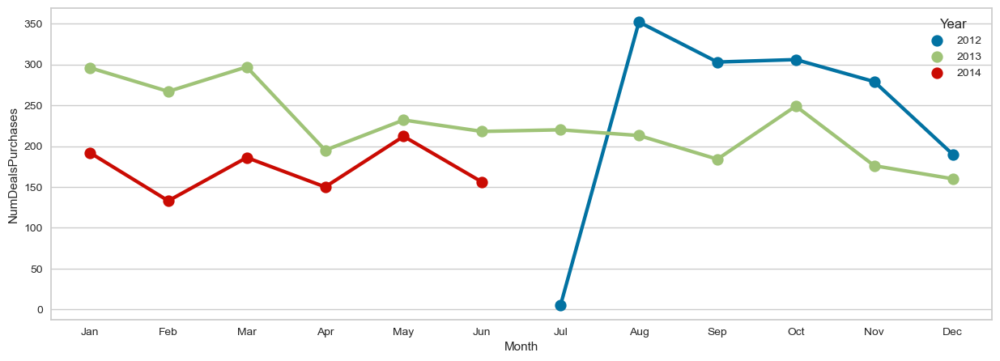

In [413]:
# number of purchases made with discount according to month
custom_dict = {'Jan':0, 'Feb':1, 'Mar':2, 'Apr':3, 'May':4, 'Jun':5,
               'Jul':6, 'Aug':7, 'Sep':8, 'Oct':9, 'Nov':10, 'Dec':11}
temp_data = df.copy()
temp_data.Month.replace([1,2,3,4,5,6,7,8,9,10,11,12], ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'], inplace=True)
data = temp_data[['Month', 'Year', "NumDealsPurchases"]].groupby(["Year","Month"]).sum().reset_index().sort_values(by=['Year','Month', 'NumDealsPurchases'], ascending=False)
data = data.iloc[data['Month'].map(custom_dict).argsort()]
f, ax=plt.subplots(figsize=(15, 5))
sns.pointplot(x='Month', y="NumDealsPurchases", data=data, hue="Year")
plt.show()

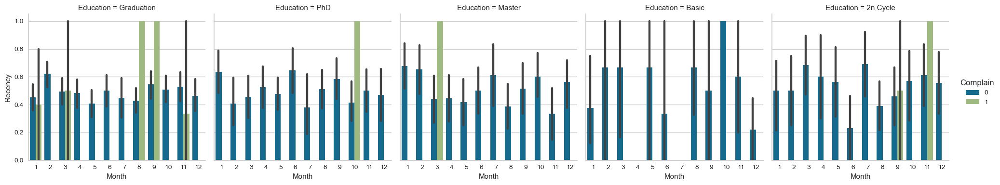

In [414]:
# Recency Analysis According  to Complain and Education
sns.catplot(x="Month", y="Recency",  hue="Complain", col="Education",
            data=df, kind="bar", height=4)
plt.show()

In [415]:
df['Ttl_no_Purchase']=df['NumStorePurchases']+df['NumCatalogPurchases']+df['NumWebPurchases']+df['NumDealsPurchases']

#new feature for the ratio of discount used to purchase to total purchase
df['Deals_Purchase_Ratio']=df['NumDealsPurchases']/df['Ttl_no_Purchase']
#new feature for the ratio of store purchase to total purchase
df['Store_Purchase_Ratio']=df['NumStorePurchases']/df['Ttl_no_Purchase']
#new feature for the ratio of web purchase to total purchase
df['Web_Purchase_Ratio']=df['NumWebPurchases']/df['Ttl_no_Purchase']
#new feature for the ratio of catalogue purchase to total purchase
df['Catalogue_Purchase_Ratio']=df['NumCatalogPurchases']/df['Ttl_no_Purchase']

In [416]:
df['Deals_Purchase_Ratio'].fillna(0,inplace=True)
df['Store_Purchase_Ratio'].fillna(0,inplace=True)
df['Web_Purchase_Ratio'].fillna(0,inplace=True)
df['Catalogue_Purchase_Ratio'].fillna(0,inplace=True)

In [417]:
#creating new feature for average monthly visits to the company's website
df['avg_web_visits']=df['NumWebVisitsMonth']/12

In [418]:
df['children']=df['Kidhome']+df['Teenhome']

In [419]:
df['family']=0

In [420]:
for i in range(len(df)):
    if ((df['children'][i] >=1) & (df['togetherness'][i] ==1)):
        df['family'][i]=1

col=df.pop('family')
df.insert(5,col.name,col)

In [421]:
#generating savings:
df['Savings']=df['Income']-df['Total_Expenses']

col = df.pop("Savings")
df.insert(9, col.name, col)

In [422]:
df.columns

Index(['Year_Birth', 'age', 'Years_Enrolled', 'Education', 'Qualification',
       'family', 'togetherness', 'Marital_Status', 'Income', 'Savings',
       'Kidhome', 'Total_Expenses', 'Teenhome', 'economic_status',
       'Dt_Customer', 'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Complain', 'Response', 'Ttl_Campaign', 'Year', 'Month', 'age_divide',
       'Ttl_no_Purchase', 'Deals_Purchase_Ratio', 'Store_Purchase_Ratio',
       'Web_Purchase_Ratio', 'Catalogue_Purchase_Ratio', 'avg_web_visits',
       'children'],
      dtype='object')

Text(0.5, 1.0, 'Saving~economic_status')

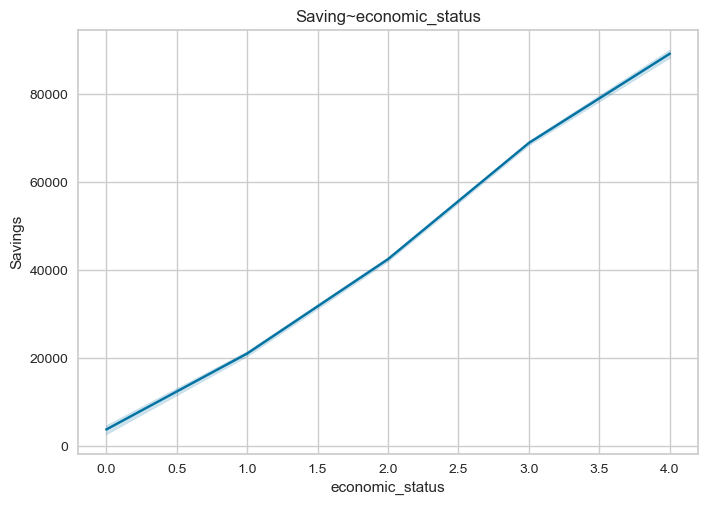

In [423]:
sns.lineplot(df['economic_status'],df['Savings'])
plt.title('Saving~economic_status')

Text(0, 0.5, 'Savings')

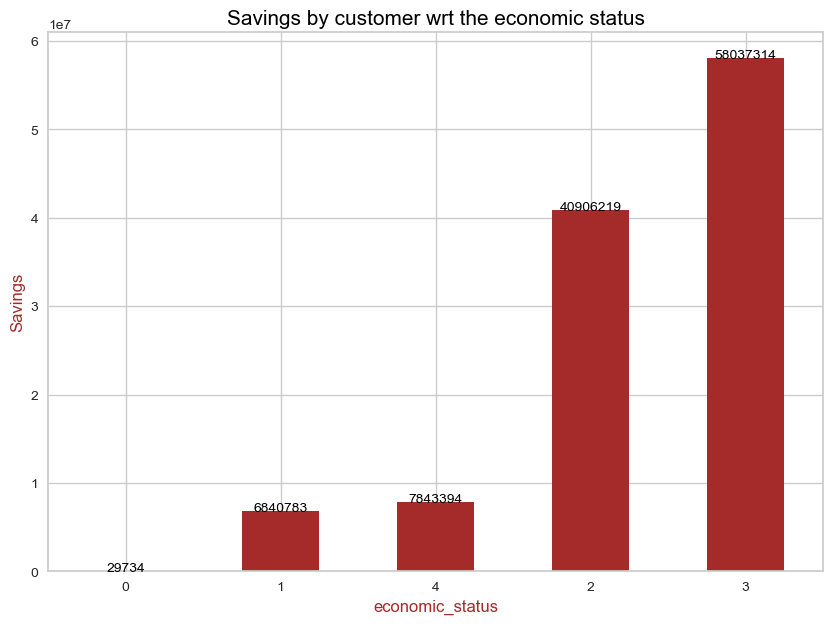

In [424]:
#Campaigns accepted by customer wrt the no of teens at home

ax = df[['economic_status','Savings']].groupby('economic_status').sum().sort_values(by='Savings',ascending=True).plot(kind='bar',color='brown',legend=None,figsize=(10,7))
plt.xticks(rotation=360)
for i in ax.patches:
    x=i.get_height().astype('int')
    y=i.get_x()+i.get_width()/2
    plt.annotate('{}'.format(x),(y,x),ha='center',color='black',fontsize=10)
plt.title('Savings by customer wrt the economic status',color='black',size=15)    
plt.xlabel('economic_status',size=12,color='brown')
plt.ylabel('Savings',size=12,color='brown')

upper middle saves the most

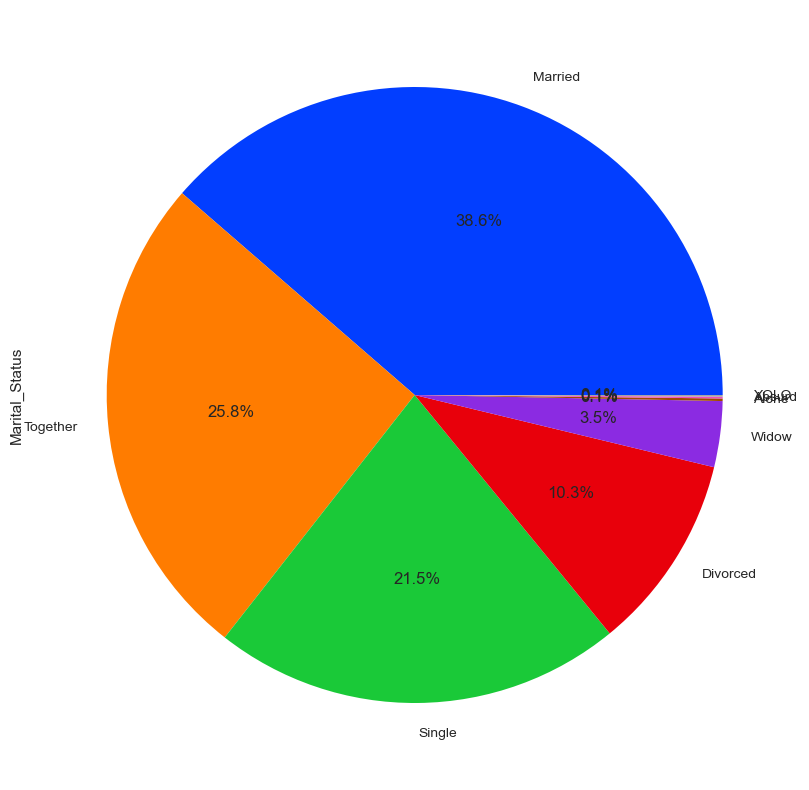

In [425]:
df['Marital_Status'].value_counts().plot.pie(autopct='%1.1f%%', figsize=(10,10), colors=sns.color_palette('bright'));
plt.show()

mostly there are married people 

<AxesSubplot:xlabel='Marital_Status', ylabel='age'>

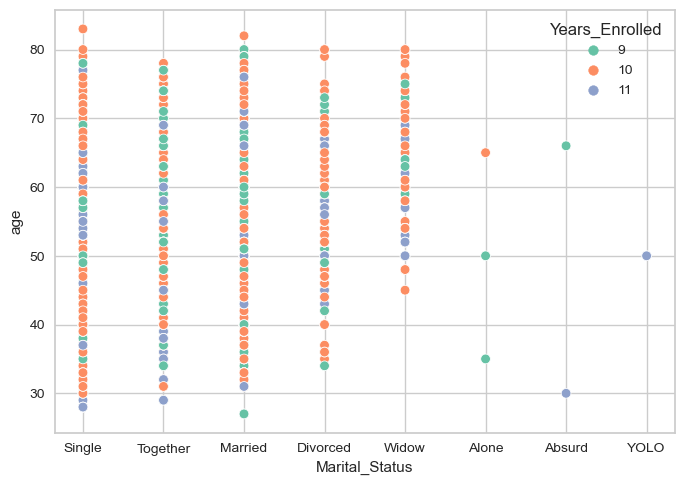

In [426]:
sns.scatterplot(x='Marital_Status',y='age',data=df,
                hue='Years_Enrolled',palette='Set2')

In [427]:
fig = px.scatter_3d(df, x='Marital_Status', y='age', z='Years_Enrolled',
                    color='Years_Enrolled')

fig.show()
plt.show()

* We observe that more single of all age are enrolled to the comapany for 10 years

* there is a mixer of people who are together of less than 80 years are enrolled to the company

* married people of all age approximately enrolled for 10 years

* divorced people after the age of approximately 30 are enrolled for 10 years

* widowed people of age more than 45 are enrolled more than 10 years


# Products:

Text(0, 0.5, 'Amount spent on wine')

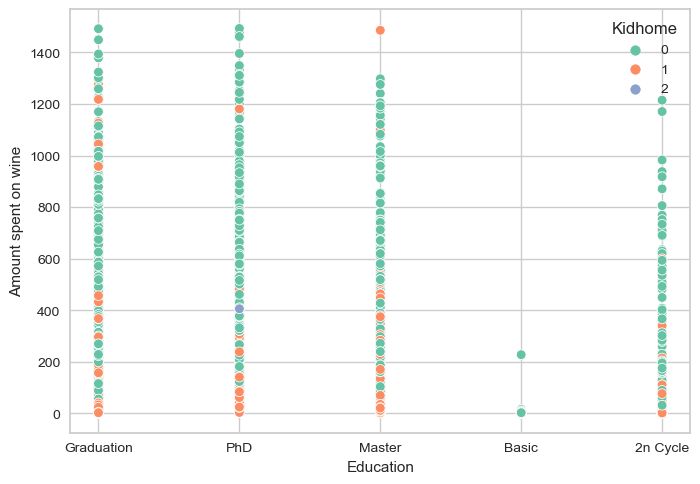

In [428]:
sns.scatterplot(y='MntWines',x='Education',data=df,
                hue='Kidhome',palette='Set2')
plt.ylabel('Amount spent on wine')

Text(0, 0.5, 'Amount spent on wine')

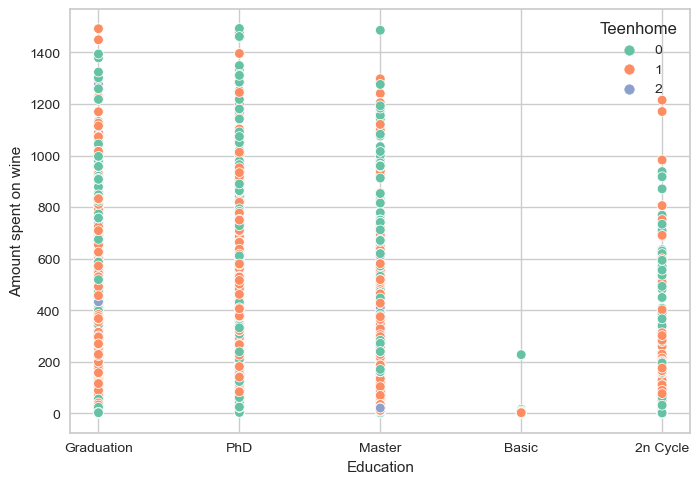

In [429]:
sns.scatterplot(y='MntWines',x='Education',data=df,
                hue='Teenhome',palette='Set2')
plt.ylabel('Amount spent on wine')

In [430]:
fig = px.scatter_3d(df, x='Education', y='MntWines', z='Kidhome',
                    color='Teenhome')
fig.show()

* we can see that graduates and PhD qualified people who has kids and teens at home less than 1  spends more on wine than others

In [431]:
fig = px.scatter_3d(df, x='Education', y='MntSweetProducts',
                    z='Kidhome',
                    color='Teenhome')
fig.show()

 * Graduates buy sweets more  quite a few teens are there in there home 

<AxesSubplot:xlabel='Teenhome', ylabel='MntSweetProducts'>

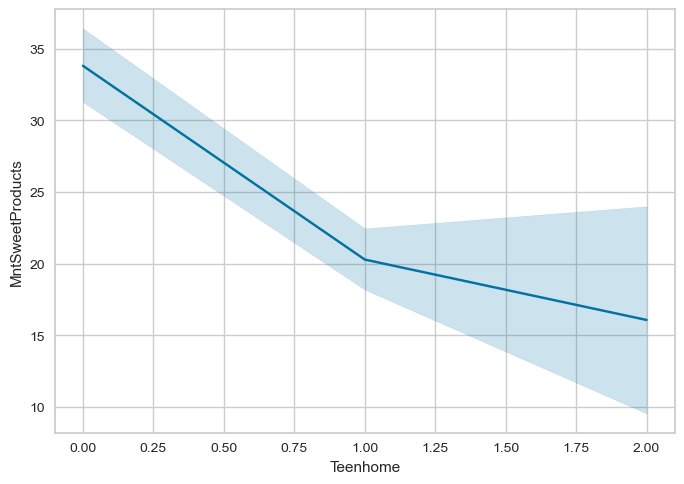

In [432]:
sns.lineplot(df['Teenhome'],df['MntSweetProducts'])

<AxesSubplot:xlabel='Teenhome', ylabel='MntSweetProducts'>

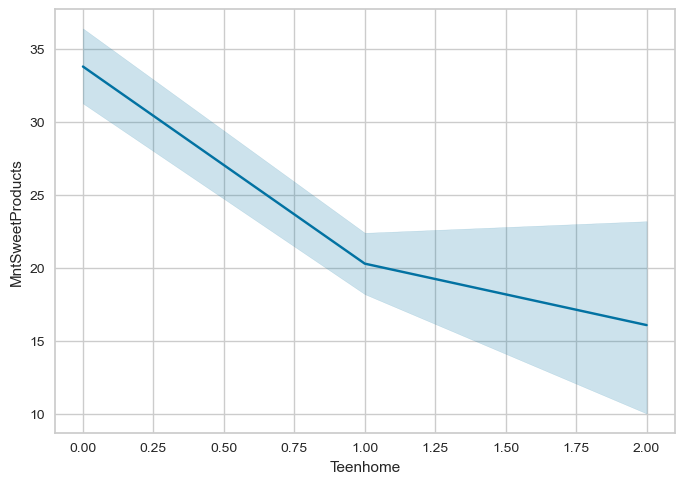

In [433]:
sns.lineplot(df['Teenhome'],df['MntSweetProducts'])

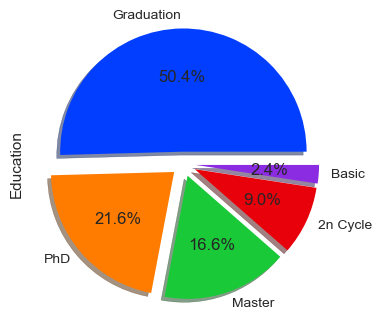

In [434]:
df['Education'].value_counts().plot.pie(explode=[0.1,0.1,0.1,0.1,0.1], 
autopct='%1.1f%%', shadow=True, figsize=(4,4), colors=sns.color_palette('bright'));
plt.show()

mostly there are graduates

Text(0, 0.5, 'Amount spent on fruit')

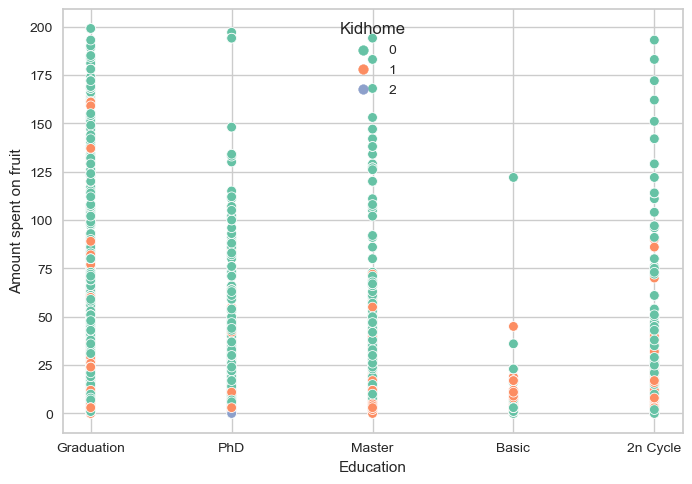

In [435]:
sns.scatterplot(y='MntFruits',x='Education',data=df,
                hue='Kidhome',palette='Set2')
plt.ylabel('Amount spent on fruit')

Text(0, 0.5, 'Amount spent on fruit')

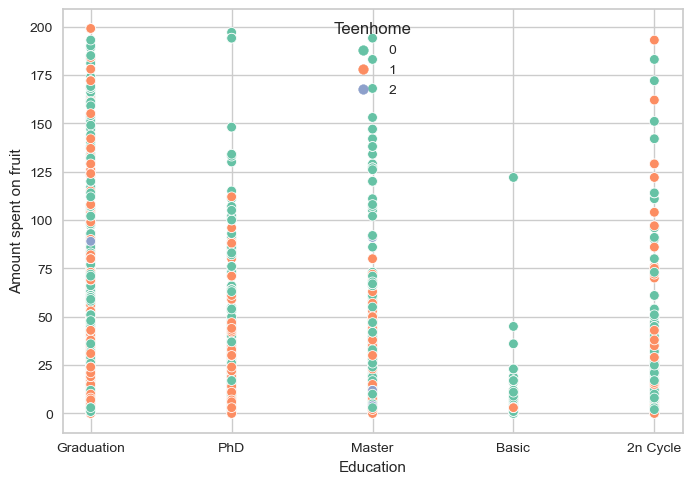

In [436]:
sns.scatterplot(y='MntFruits',x='Education',data=df,
                hue='Teenhome',palette='Set2')
plt.ylabel('Amount spent on fruit')

In [437]:
fig = px.scatter_3d(df, x='Education', y='MntFruits', z='Kidhome',
                    color='Teenhome')
fig.show()

# mostly graduates spends on fruits and only graduates spend mostly even if they have more than  kids but they mostly have no teens


Text(0, 0.5, 'Amount spent on meat')

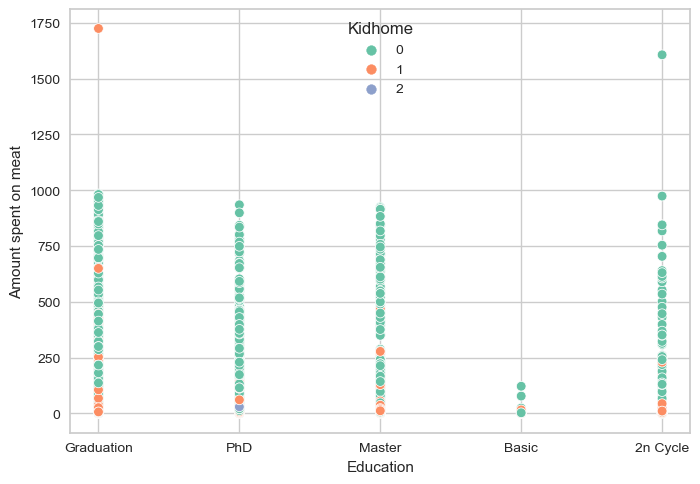

In [438]:
sns.scatterplot(y='MntMeatProducts',x='Education',data=df,
               hue='Kidhome',palette='Set2')
plt.ylabel('Amount spent on meat')

Text(0, 0.5, 'Amount spent on meat')

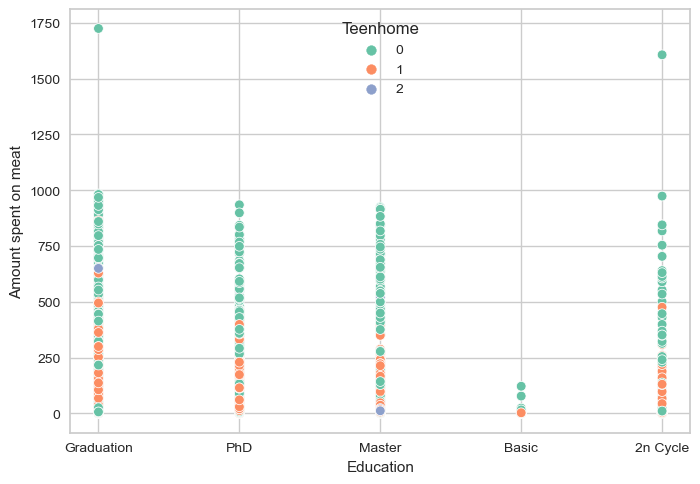

In [439]:
sns.scatterplot(y='MntMeatProducts',x='Education',data=df,
                hue='Teenhome',palette='Set2')
plt.ylabel('Amount spent on meat')

In [440]:
fig = px.scatter_3d(df, x='Education', y='MntMeatProducts', z='Kidhome',
                    color='Teenhome')
fig.show()

# only graduates and PhD has outliers data mean they spent on meat even if they have more han 1 kid but mostly don't have teens 

<AxesSubplot:xlabel='Education', ylabel='MntFishProducts'>

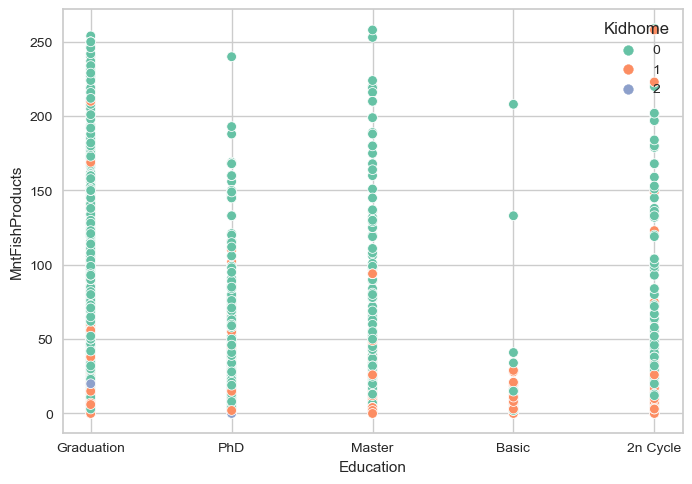

In [441]:
sns.scatterplot(y='MntFishProducts',x='Education',data=df,
              hue='Kidhome', palette='Set2')

<AxesSubplot:xlabel='Education', ylabel='MntFishProducts'>

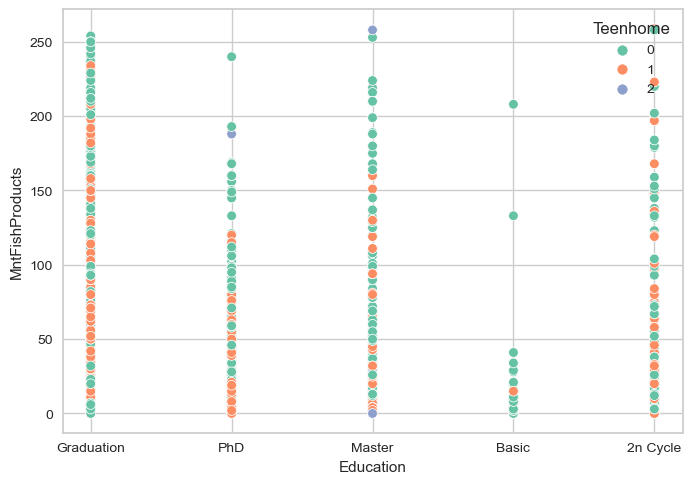

In [442]:
sns.scatterplot(y='MntFishProducts',x='Education',data=df,
                hue='Teenhome',palette='Set2')

In [443]:
fig = px.scatter_3d(df, x='Education', y='MntFishProducts', z='Kidhome',
                    color='Teenhome')
fig.show()

# Gradutes are again constant buyers of Fish Products who has kids and few teen

Text(0.5, 0, 'Expenditure')

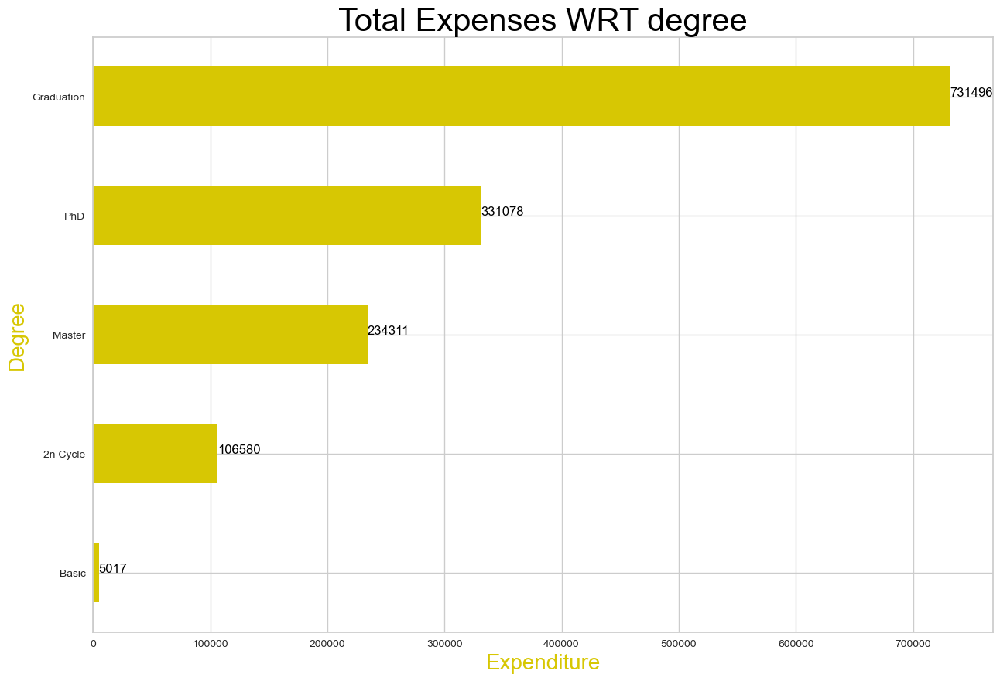

In [444]:
#Total Expenses WRT degree

ax = df[['Education','Total_Expenses']].groupby('Education').sum().sort_values(by='Total_Expenses',ascending=True).plot(kind='barh',color='y',legend=None,figsize=(15,10))
for i in ax.patches:
    x=i.get_width()
    y=i.get_y()+i.get_height()/2
    plt.annotate('{}'.format(x),(x,y),ha='left',color='black')
plt.title('Total Expenses WRT degree',color='black',size=30)    
plt.ylabel('Degree',color='y',size=20)
plt.xlabel('Expenditure',color='y',size=20)

In [445]:
# Conclusion: 
# we can say that Graduates are people who spends most

In [446]:
#Sum up total purchases from places
df['Ttl_place_purchase'] = df['NumDealsPurchases'] + df['NumWebPurchases'] + df['NumCatalogPurchases'] + df['NumStorePurchases'] 

Text(0, 0.5, 'Campaign')

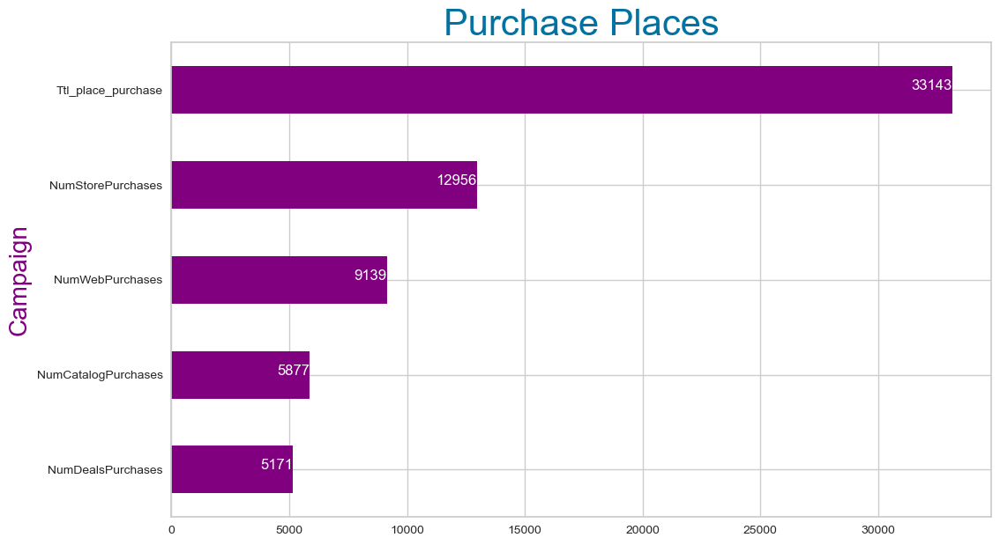

In [447]:
#Purchase Places
plt.figure(figsize=(12,7))
ax = df[['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases','Ttl_place_purchase']].sum().sort_values(ascending=True).plot(kind='barh',color='purple')
for i in ax.patches:
    x=i.get_width()
    y=i.get_y()+i.get_height()/2
    plt.annotate('{}'.format(x),(x,y),ha='right',color='white')
plt.title('Purchase Places',color='b',size=30)    
plt.ylabel('Campaign',color='purple',size=20)
#plt.xlabel('Choice',color='purple',size=20)

Text(0.5, 1.0, 'Number of visits to company’s website in the last month')

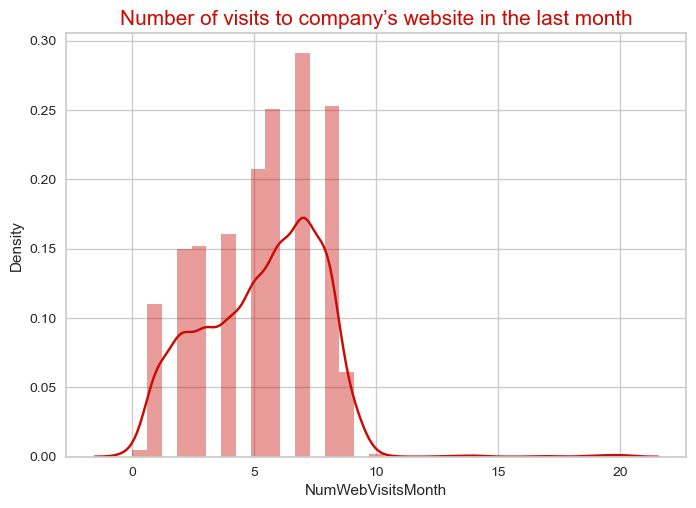

In [448]:
sns.distplot(df['NumWebVisitsMonth'],color='r')
plt.title('Number of visits to company’s website in the last month',size=15,color='r')

Text(0.5, 1.0, 'Number of purchases made through the company’s website')

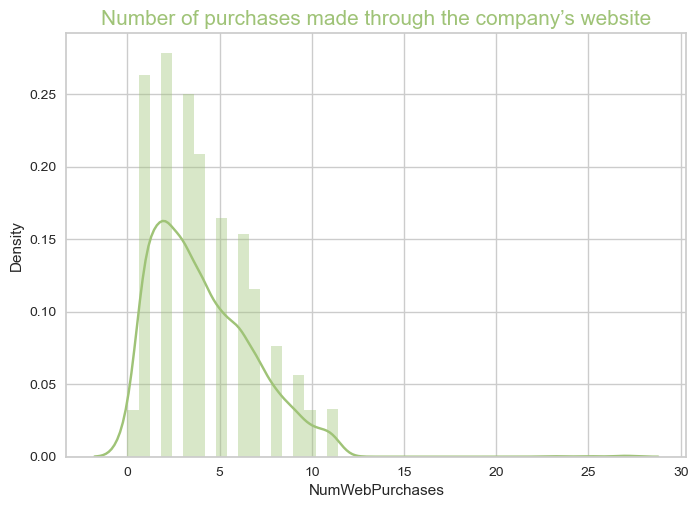

In [449]:
sns.distplot(df['NumWebPurchases'],color='g')
plt.title('Number of purchases made through the company’s website',size=15,color='g')

Text(0.5, 1.0, 'Number of purchases made using a catalogue')

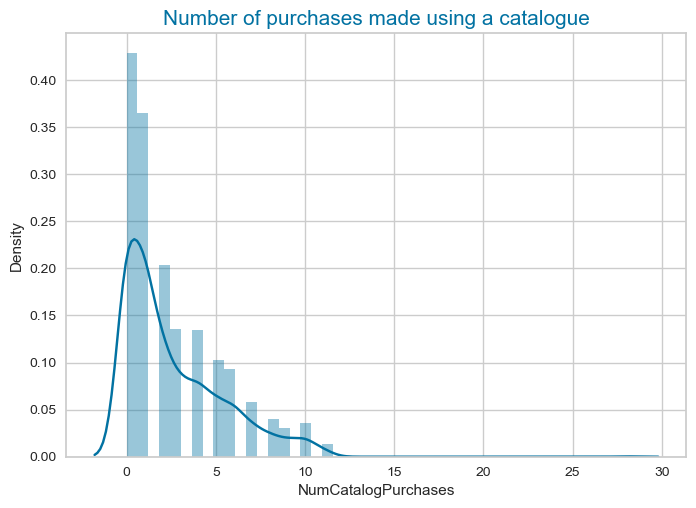

In [450]:
sns.distplot(df['NumCatalogPurchases'],color='b')
plt.title('Number of purchases made using a catalogue',size=15,color='b')

Text(0.5, 1.0, 'Number of purchases made directly in stores')

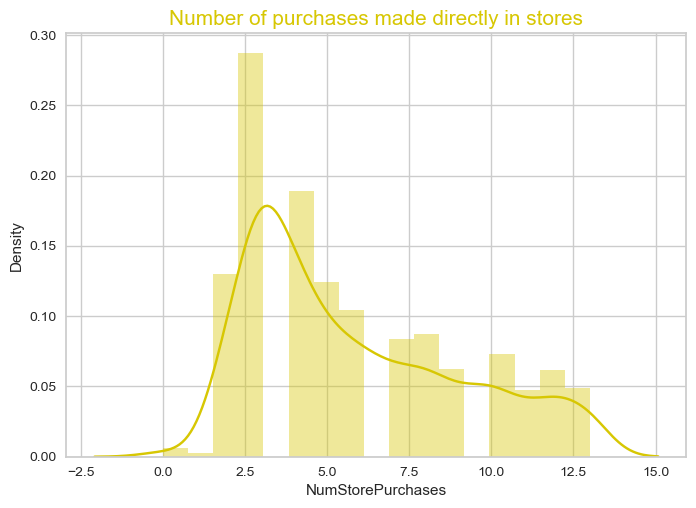

In [451]:
sns.distplot(df['NumStorePurchases'],color='y')
plt.title('Number of purchases made directly in stores',size=15,color='y')

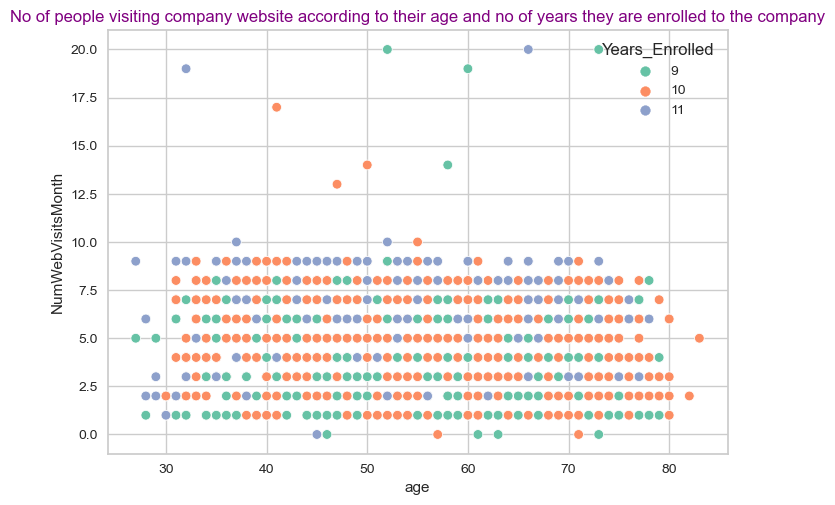

Inference:
 This will help us push products and offers or discount based on the enrolment years and the age group that visit company's website


In [452]:
sns.scatterplot(df['age'],df['NumWebVisitsMonth'],hue=df['Years_Enrolled'],palette='Set2')
plt.title('No of people visiting company website according to their age and no of years they are enrolled to the company',color='purple',size=12)
plt.show()
print("Inference:\n This will help us push products and offers or discount based on the enrolment years and the age group that visit company's website")

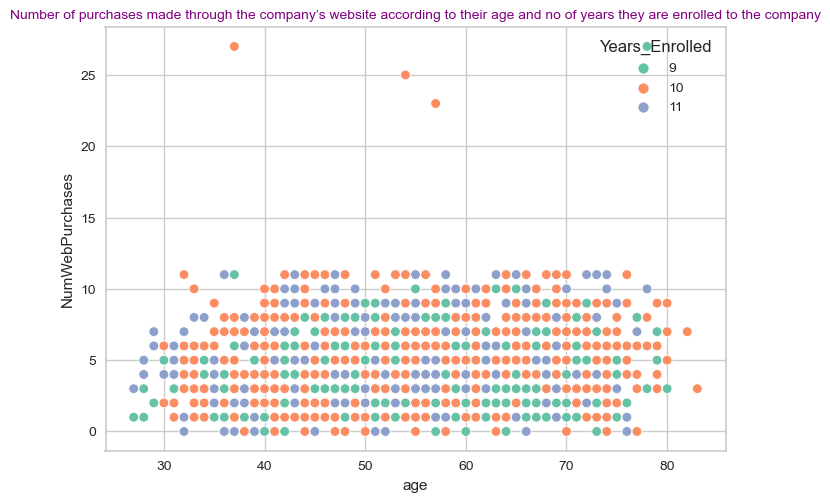

Inference:
 This will help us push products and offers or discount based on the enrolment years and the age group that visit company's website


In [453]:
sns.scatterplot(df['age'],df['NumWebPurchases'],hue=df['Years_Enrolled'],palette='Set2')
plt.title('Number of purchases made through the company’s website according to their age and no of years they are enrolled to the company',color='purple',size=10)
plt.show()
print("Inference:\n This will help us push products and offers or discount based on the enrolment years and the age group that visit company's website")

Text(0.5, 1.0, 'deals accepted through discount')

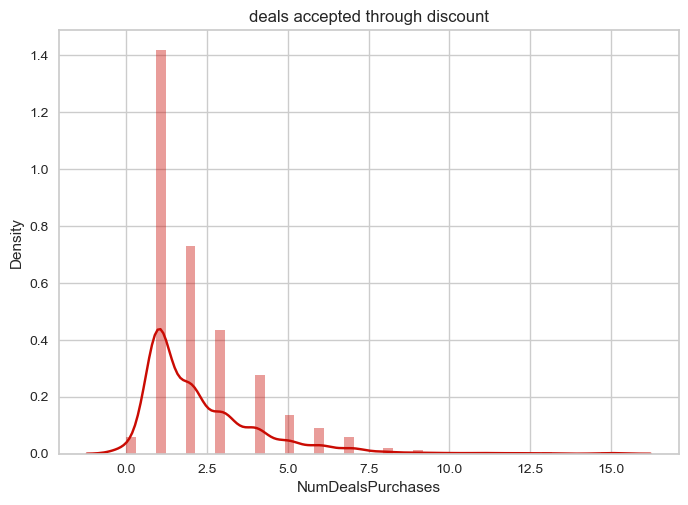

In [454]:
sns.distplot(df['NumDealsPurchases'],color='r')
plt.title('deals accepted through discount')

# Campaign

Text(0.5, 1.0, 'Customer maded the purchase accepting offer on 1st campaign')

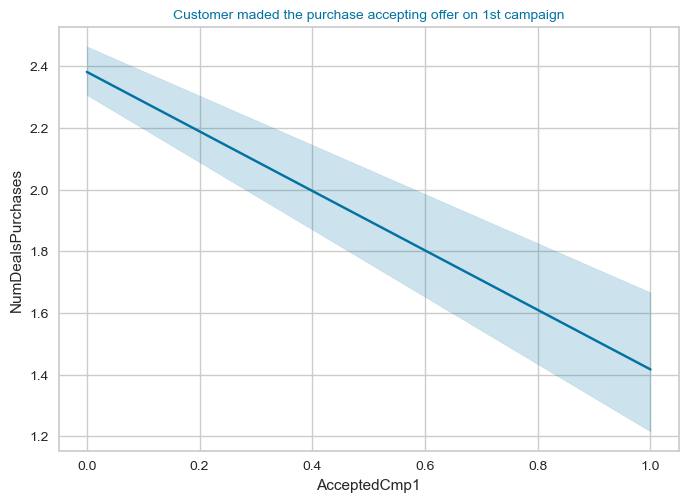

In [455]:
sns.lineplot(df['AcceptedCmp1'],df['NumDealsPurchases'])
plt.title('Customer maded the purchase accepting offer on 1st campaign',color='b',size=10)

Text(0.5, 1.0, 'Customer maded the purchase accepting offer on 2nd campaign')

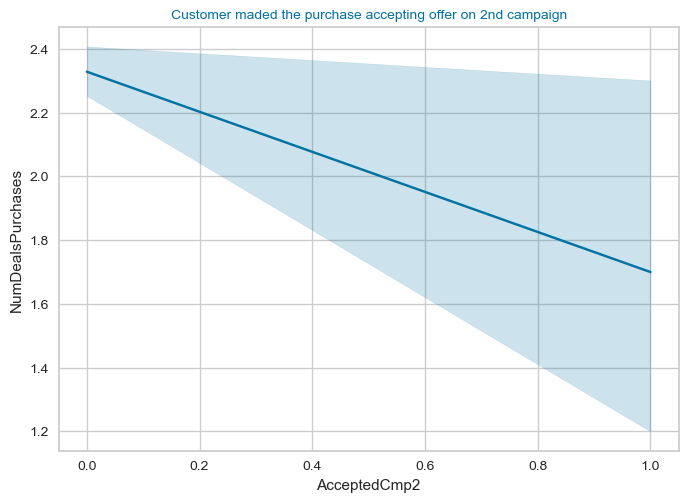

In [456]:
sns.lineplot(df['AcceptedCmp2'],df['NumDealsPurchases'])
plt.title('Customer maded the purchase accepting offer on 2nd campaign',color='b',size=10)


Text(0.5, 0, 'No. of Choice')

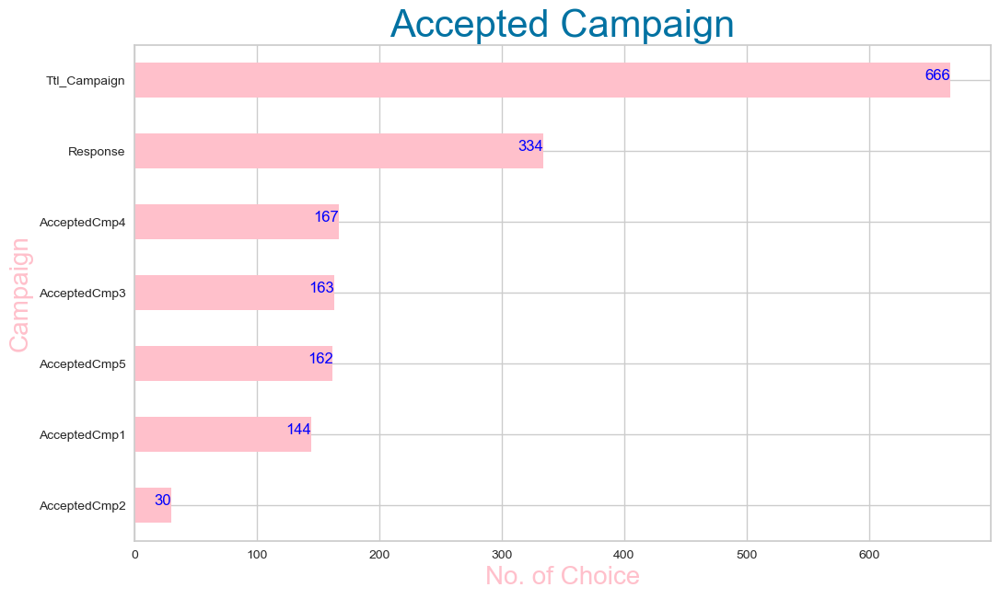

In [457]:
#Accepted Campaign
plt.figure(figsize=(12,7))
ax = df[['AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4','AcceptedCmp5', 'Response','Ttl_Campaign']].sum().sort_values(ascending=True).plot(kind='barh',color='pink')
for i in ax.patches:
    x=i.get_width()
    y=i.get_y()+i.get_height()/2
    plt.annotate('{}'.format(x),(x,y),ha='right',color='blue')
plt.title('Accepted Campaign',color='b',size=30)    
plt.ylabel('Campaign',color='pink',size=20)
plt.xlabel('No. of Choice',color='pink',size=20)

* 4th campaign was the most successful campaign

Text(0, 0.5, 'Total Campaign')

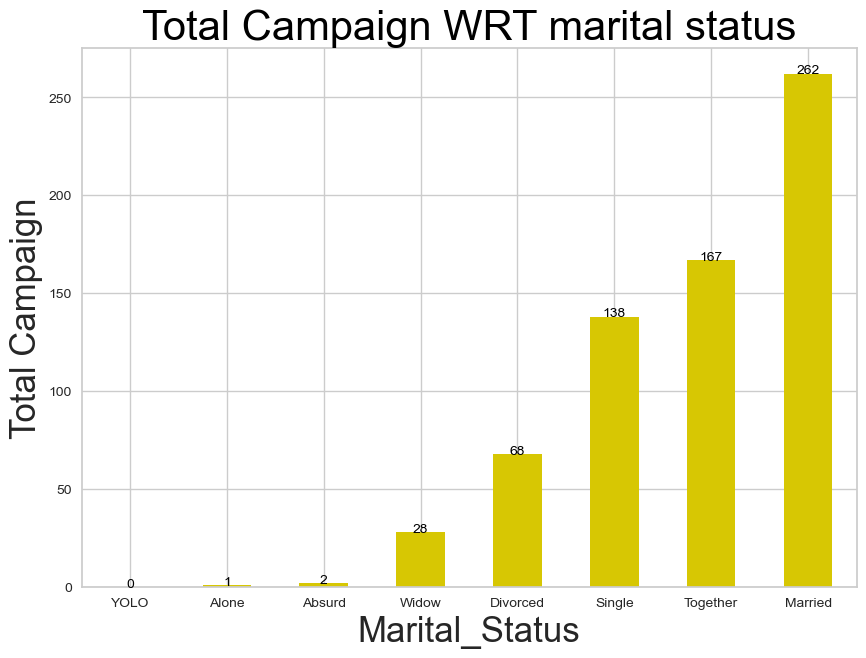

In [458]:
#Total Campaign WRT marital status
#plt.figure(figsize=(20,10))
ax = df[['Marital_Status','Ttl_Campaign']].groupby('Marital_Status').sum().sort_values(by='Ttl_Campaign',ascending=True).plot(kind='bar',color='y',legend=None,figsize=(10,7))
plt.xticks(rotation=360)
for i in ax.patches:
    x=i.get_height().astype('int')
    y=i.get_x()+i.get_width()/2
    plt.annotate('{}'.format(x),(y,x),ha='center',color='black',fontsize=10)
plt.title('Total Campaign WRT marital status',color='black',size=30)    
plt.xlabel('Marital_Status',size=25)
plt.ylabel('Total Campaign',size=25)

* married people accepts the campaign the most

Text(0, 0.5, 'Total Campaign')

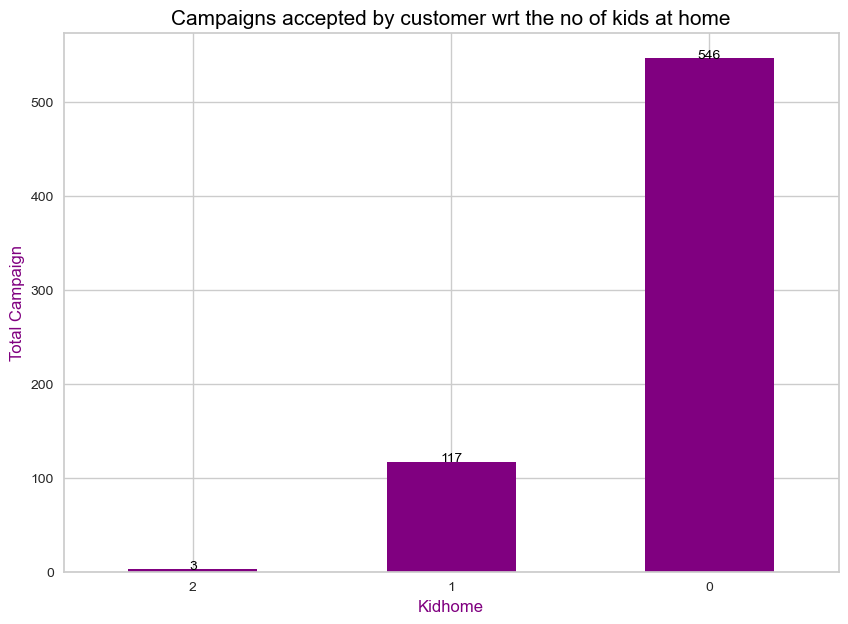

In [459]:
#Campaigns accepted by customer wrt the no of kids at home

ax = df[['Kidhome','Ttl_Campaign']].groupby('Kidhome').sum().sort_values(by='Ttl_Campaign',ascending=True).plot(kind='bar',color='purple',legend=None,figsize=(10,7))
plt.xticks(rotation=360)
for i in ax.patches:
    x=i.get_height().astype('int')
    y=i.get_x()+i.get_width()/2
    plt.annotate('{}'.format(x),(y,x),ha='center',color='black',fontsize=10)
plt.title('Campaigns accepted by customer wrt the no of kids at home',color='black',size=15)    
plt.xlabel('Kidhome',size=12,color='purple')
plt.ylabel('Total Campaign',size=12,color='purple')

* peoplw who has no kid accepts campaigns 

Text(0, 0.5, 'Total Campaign')

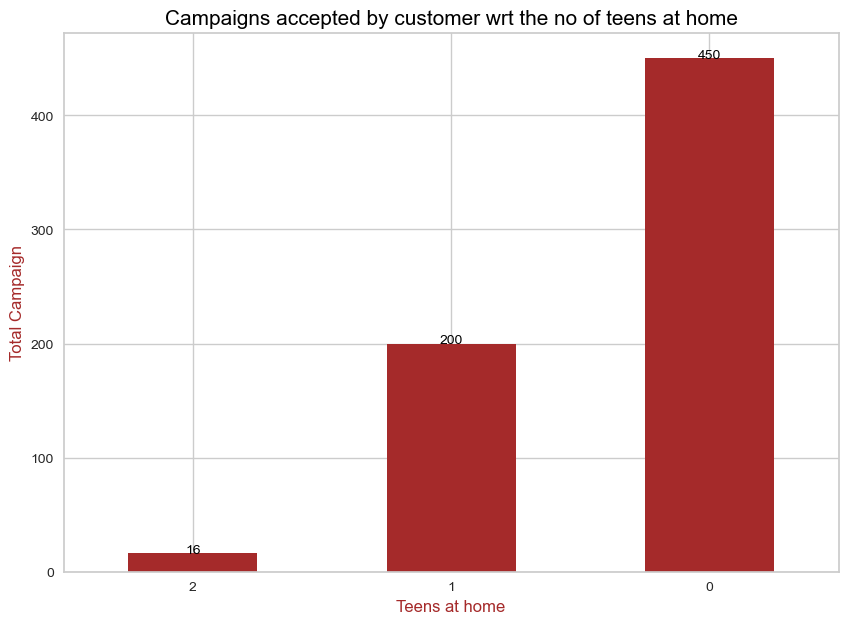

In [460]:
#Campaigns accepted by customer wrt the no of teens at home

ax = df[['Teenhome','Ttl_Campaign']].groupby('Teenhome').sum().sort_values(by='Ttl_Campaign',ascending=True).plot(kind='bar',color='brown',legend=None,figsize=(10,7))
plt.xticks(rotation=360)
for i in ax.patches:
    x=i.get_height().astype('int')
    y=i.get_x()+i.get_width()/2
    plt.annotate('{}'.format(x),(y,x),ha='center',color='black',fontsize=10)
plt.title('Campaigns accepted by customer wrt the no of teens at home',color='black',size=15)    
plt.xlabel('Teens at home',size=12,color='brown')
plt.ylabel('Total Campaign',size=12,color='brown')

* peoplw who has no teen accepts campaigns

In [461]:
df_1=df.copy()
df_1.drop(columns=['Education','Marital_Status','Dt_Customer','Year_Birth','Year', 'Month'],axis=1,inplace=True)
for i in range(len(df_1)):
    if (df_1['family'][i]==1 ):
        df_1['family'][i]='yes'
    elif (df_1['family'][i]==0):
        df_1['family'][i]='no'

    if (df_1['Qualification'][i]==1 ):
        df_1['Qualification'][i]='Graduate'
    elif (df_1['Qualification'][i]==0):
        df_1['Qualification'][i]='Undergraduate'
    elif (df_1['Qualification'][i]==2):
        df_1['Qualification'][i]='Post graduate'
        
    if (df_1['togetherness'][i]==1 ):
        df_1['togetherness'][i]='yes'
    elif (df_1['togetherness'][i]==0):
        df_1['togetherness'][i]='no'

    if (df_1['economic_status'][i]==0 ):
        df_1['economic_status'][i]='Extremly low'
    elif (df_1['economic_status'][i]==1):
        df_1['economic_status'][i]='Low'
    elif (df_1['economic_status'][i]==2):
        df_1['economic_status'][i]='Lower middle'
    elif (df_1['economic_status'][i]==3):
        df_1['economic_status'][i]='Upper middle'
    elif (df_1['economic_status'][i]==4):
        df_1['economic_status'][i]='High'
        
    if (df_1['Recency'][i]==1 ):
        df_1['Recency'][i]='not frequent'
    elif (df_1['Recency'][i]==0):
        df_1['Recency'][i]='frequent'
    
    if (df_1['AcceptedCmp1'][i]==1 ):
        df_1['AcceptedCmp1'][i]='yes'
    elif (df_1['AcceptedCmp1'][i]==0):
        df_1['AcceptedCmp1'][i]='no'
    if (df_1['AcceptedCmp2'][i]==1 ):
        df_1['AcceptedCmp2'][i]='yes'
    elif (df_1['AcceptedCmp2'][i]==0):
        df_1['AcceptedCmp2'][i]='no'
    if (df_1['AcceptedCmp3'][i]==1 ):
        df_1['AcceptedCmp3'][i]='yes'
    elif (df_1['AcceptedCmp3'][i]==0):
        df_1['AcceptedCmp3'][i]='no'
    if (df_1['AcceptedCmp4'][i]==1 ):
        df_1['AcceptedCmp4'][i]='yes'
    elif (df_1['AcceptedCmp4'][i]==0):
        df_1['AcceptedCmp4'][i]='no'
    if (df_1['AcceptedCmp5'][i]==1 ):
        df_1['AcceptedCmp5'][i]='yes'
    elif (df_1['AcceptedCmp5'][i]==0):
        df_1['AcceptedCmp5'][i]='no'
        
    if(df_1['Complain'][i]==0):
        df_1['Complain'][i]='no'
    elif (df_1['Complain'][i]==1):
        df_1['Complain'][i]='yes'
        
    if(df_1['Response'][i]==0):
        df_1['Response'][i]='no'
    elif (df_1['Response'][i]==1):
        df_1['Response'][i]='yes'
        
  


col=df_1.pop('age_divide')
df_1.insert(2,col.name,col)
col=df_1.pop('Recency')
df_1.insert(3,col.name,col)
col=df_1.pop('Income')
df_1.insert(5,col.name,col)
col=df_1.pop('Total_Expenses')
df_1.insert(6,col.name,col)
col=df_1.pop('Savings')
df_1.insert(7,col.name,col)
col=df_1.pop('economic_status')
df_1.insert(8,col.name,col)
col=df_1.pop('Qualification')
df_1.insert(9,col.name,col)
col=df_1.pop('togetherness')
df_1.insert(10,col.name,col)
col=df_1.pop('family')
df_1.insert(11,col.name,col)
col=df_1.pop('children')
df_1.insert(12,col.name,col)
col=df_1.pop('Kidhome')
df_1.insert(13,col.name,col)
col=df_1.pop('Teenhome')
df_1.insert(14,col.name,col)



df_1.head(1)

,age,Years_Enrolled,age_divide,Recency,Income,Total_Expenses,Savings,economic_status,Qualification,togetherness,family,children,Kidhome,MntWines,Teenhome,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,Ttl_place_purchase
0,66,11,Elderly,frequent,58138.0,1705,56433.0,Upper middle,Graduate,no,no,0,0,635,0,88,546,172,88,88,3,8,10,4,7,no,no,no,no,no,no,yes,0,25,0.12,0.16,0.32,0.4,0.583333,25


In [462]:
df_1.to_csv('df_1.csv')
df_db=df_1.copy()

In [463]:
df_copy=df.copy()#without real purchase vaslue
df_copy.drop(columns=['Ttl_place_purchase','Year_Birth',
                      'togetherness','children',
                      'Education','Marital_Status',
                      'economic_status','Dt_Customer', 
                      'Year','Month',
                      'age_divide','Kidhome',
                      'Teenhome','NumDealsPurchases',
                      'NumWebPurchases','NumCatalogPurchases',
                      'NumStorePurchases','NumWebVisitsMonth',
                      'Ttl_no_Purchase','Ttl_Campaign'],inplace=True,axis=1)

In [464]:
df.head()


,Year_Birth,age,Years_Enrolled,Education,Qualification,family,togetherness,Marital_Status,Income,Savings,Kidhome,Total_Expenses,Teenhome,economic_status,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Year,Month,age_divide,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,children,Ttl_place_purchase
0,1957,66,11,Graduation,1,0,0,Single,58138.0,56433.0,0,1705,0,3,2012-09-04,0,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0,2012,9,Elderly,25,0.120000,0.160000,0.320000,0.400000,0.583333,0,25
1,1954,69,9,Graduation,1,0,0,Single,46344.0,46316.0,1,28,1,2,2014-03-08,1,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,0,2014,3,Elderly,6,0.333333,0.333333,0.166667,0.166667,0.416667,2,6
2,1965,58,10,Graduation,1,0,1,Together,71613.0,70788.0,0,825,0,3,2013-08-21,1,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0,0,2013,8,MiddleAge,21,0.047619,0.476190,0.380952,0.095238,0.333333,0,21
3,1984,39,9,Graduation,1,1,1,Together,26646.0,26589.0,1,57,0,1,2014-02-10,1,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0,0,2014,2,Young,8,0.250000,0.500000,0.250000,0.000000,0.500000,1,8
4,1981,42,9,PhD,2,1,1,Married,58293.0,57828.0,1,465,0,3,2014-01-19,0,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0,0,2014,1,Young,19,0.263158,0.315789,0.263158,0.157895,0.416667,1,19


In [465]:

df_ano=df.copy()
#without ratio purchase vaslue
df.drop(columns=['Year_Birth',
                 'togetherness','children',
                 'Education','Marital_Status',
                 'economic_status','Dt_Customer', 
                 'Deals_Purchase_Ratio', 'Store_Purchase_Ratio',
                 'Web_Purchase_Ratio', 'Catalogue_Purchase_Ratio',
                 'Ttl_Campaign','avg_web_visits',
                 'Year','Month',
                 'age_divide','Kidhome',
                 'Teenhome','Ttl_no_Purchase','Ttl_place_purchase'],inplace=True,axis=1)

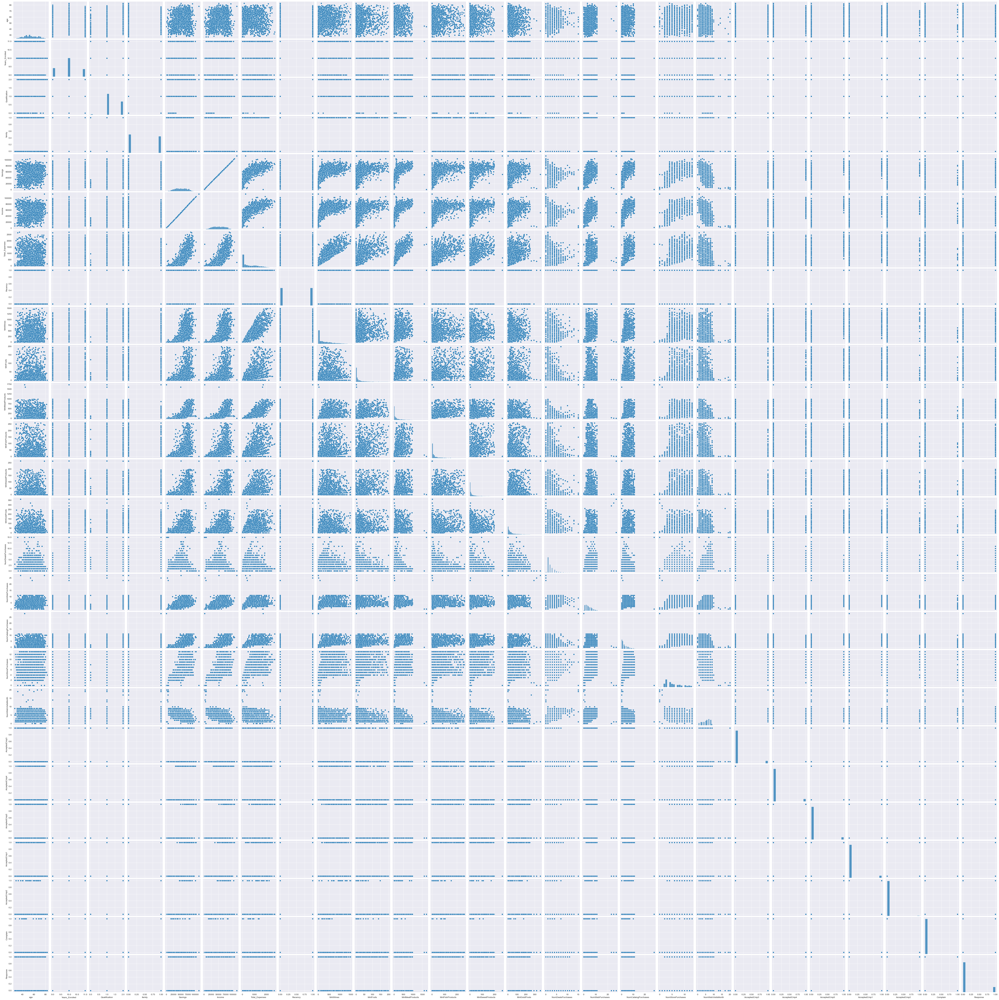

In [101]:
# correlation
sns.set_style('darkgrid')
sns.pairplot(df)

<AxesSubplot:>

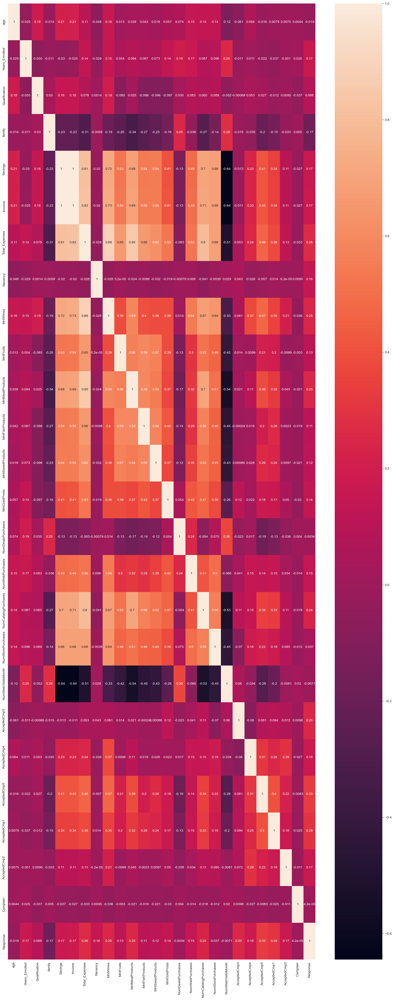

In [102]:
plt.figure(figsize=(20,50))
sns.heatmap(df.corr(),annot=True)

<AxesSubplot:>

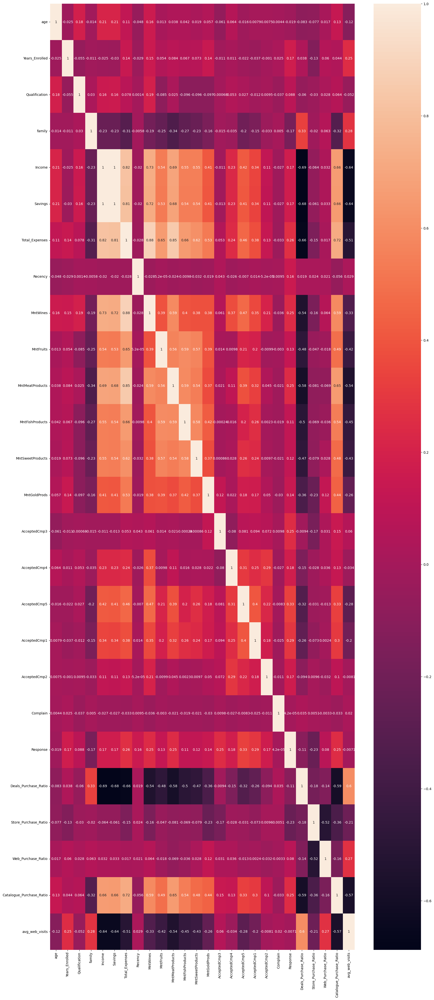

In [102]:
plt.figure(figsize=(20,50))
sns.heatmap(df_copy.corr(),annot=True)

In [466]:
df.drop(columns=['Savings','Total_Expenses'],axis=1,inplace=True)
df_copy.drop(columns=['Savings','Total_Expenses'],axis=1,inplace=True)

In [467]:
df.isnull().any()

age                    False
Years_Enrolled         False
Qualification          False
family                 False
Income                 False
Recency                False
MntWines               False
MntFruits              False
MntMeatProducts        False
MntFishProducts        False
MntSweetProducts       False
MntGoldProds           False
NumDealsPurchases      False
NumWebPurchases        False
NumCatalogPurchases    False
NumStorePurchases      False
NumWebVisitsMonth      False
AcceptedCmp3           False
AcceptedCmp4           False
AcceptedCmp5           False
AcceptedCmp1           False
AcceptedCmp2           False
Complain               False
Response               False
dtype: bool

le=LabelEncoder()
a = ['Young','MiddleAge','Elderly']
OE = OrdinalEncoder(categories=([a]))
OE.fit(df[['age']])
df['age']=OE.transform(df[['age']])
df.head(1)

In [468]:
df.head(2)#without ratio purchase value
#passed to pca for model creation 
#used in final model using 1 pc

,age,Years_Enrolled,Qualification,family,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,66,11,1,0,58138.0,0,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,69,9,1,0,46344.0,1,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0


In [469]:
len(df.columns)

24

In [470]:
df_copy.head(2)#without real purchase value

,age,Years_Enrolled,Qualification,family,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits
0,66,11,1,0,58138.0,0,635,88,546,172,88,88,0,0,0,0,0,0,1,0.120000,0.160000,0.320000,0.400000,0.583333
1,69,9,1,0,46344.0,1,11,1,6,2,1,6,0,0,0,0,0,0,0,0.333333,0.333333,0.166667,0.166667,0.416667


In [471]:
df_ano.head(2)

,Year_Birth,age,Years_Enrolled,Education,Qualification,family,togetherness,Marital_Status,Income,Savings,Kidhome,Total_Expenses,Teenhome,economic_status,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Year,Month,age_divide,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,children,Ttl_place_purchase
0,1957,66,11,Graduation,1,0,0,Single,58138.0,56433.0,0,1705,0,3,2012-09-04,0,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0,2012,9,Elderly,25,0.120000,0.160000,0.320000,0.400000,0.583333,0,25
1,1954,69,9,Graduation,1,0,0,Single,46344.0,46316.0,1,28,1,2,2014-03-08,1,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0,0,2014,3,Elderly,6,0.333333,0.333333,0.166667,0.166667,0.416667,2,6


In [472]:
len(df_copy.columns)

24

In [473]:
test=df.columns
len(test)

24

In [474]:
df.to_csv('passed_data.csv')


# Scaling

In [475]:

scaler = StandardScaler()
x=scaler.fit_transform(df)
x_copy=scaler.fit_transform(df_copy)
data = pd.DataFrame(x, columns= df.columns )

# Dimensionality Reduction

In [476]:
pca=PCA()
pcs=pca.fit_transform(x)

# cummulative sum
cum_sum=np.cumsum(pca.explained_variance_ratio_)
cum_sum

array([0.27349997, 0.35487761, 0.43110094, 0.49484388, 0.54363837,
       0.58566102, 0.6271683 , 0.66796811, 0.70363146, 0.73728532,
       0.76720153, 0.79441414, 0.81987538, 0.84463288, 0.86871645,
       0.89163002, 0.91160029, 0.92956196, 0.94650579, 0.96181651,
       0.97405249, 0.98504465, 0.99372171, 1.        ])

Text(0.5, 1.0, 'Scree Curve')

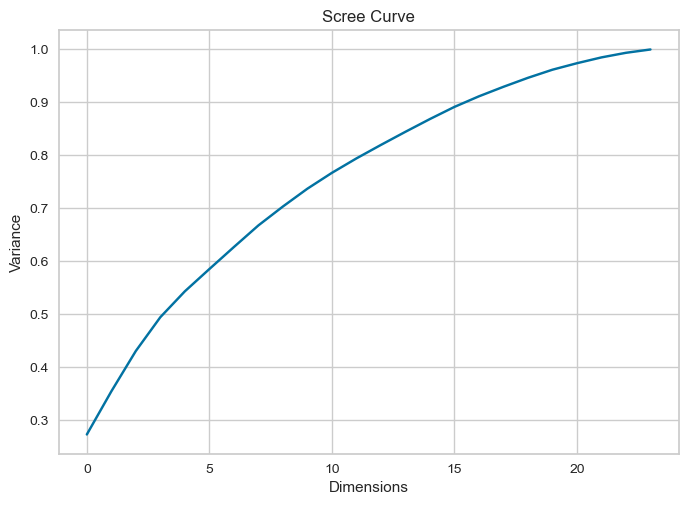

In [477]:

# Scree Plot

plt.plot(cum_sum)
plt.xlabel('Dimensions')
plt.ylabel('Variance')
plt.title('Scree Curve')


In [478]:


#pca = PCA(n_components=6)
pca = PCA(0.80)
pcs=pca.fit_transform(x)
#pcs_copy=pca.fit_transform(x_copy)
#PCA_ds = pd.DataFrame(pcs, columns=(["col1","col2","col3","col4","col5","col6","col7","col8","col9","col10","col11","col12","col13","col14","col15"]))
#PCA_ds= pd.DataFrame(pcs, columns=(["col1","col2","col3","col4","col5","col6"]))
#PCA_ds
pcs.shape

(2229, 13)

In [479]:
pcs

array([[ 3.81637241,  0.25392942, -1.44423612, ..., -0.96487432,
         0.90268798, -1.08640756],
       [-2.03417597, -1.06538608,  1.09401874, ...,  0.51646074,
         0.10106006, -0.30458865],
       [ 1.57169815, -0.8521531 , -0.76741254, ...,  0.62445725,
        -0.40515182,  0.14701871],
       ...,
       [ 1.33631787,  0.40869306,  1.06916817, ...,  2.11958282,
        -0.60463276, -2.10766608],
       [ 1.5375358 , -0.38158521, -0.86716734, ..., -0.4526576 ,
        -0.02375077,  0.24845239],
       [-1.44124918,  1.85567709, -0.1437138 , ..., -1.83490389,
        -0.16399573, -0.01456819]])

In [480]:
pca.explained_variance_
#va

array([6.56694543, 1.95393987, 1.83018112, 1.53051723, 1.17159327,
       1.00899634, 0.99662191, 0.97963476, 0.85630468, 0.80805515,
       0.71831135, 0.65339556, 0.61134427])

In [481]:
pca.explained_variance_ratio_

array([0.27349997, 0.08137764, 0.07622334, 0.06374294, 0.04879449,
       0.04202265, 0.04150728, 0.0407998 , 0.03566335, 0.03365386,
       0.02991621, 0.0272126 , 0.02546125])

* 1st component explained 27% of variance
* 2nd component grabbed 08% of information

.....
                                                                                                                                   
                                                                                                                                 
.....

.....

In [482]:
pca.n_components_

13

In [483]:
pca = PCA(n_components=1) 
pcs_fit=pca.fit(x)
pcs=pca.transform(x)
PCA_ds = pd.DataFrame(pcs, columns=(["col1"]))
pca.explained_variance_ratio_

array([0.27349997])

* captures 27% data

In [484]:
#Clustering
wcss=[]
for k in range(1,len(df.columns)):
    kmeans=KMeans(n_clusters=k)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)

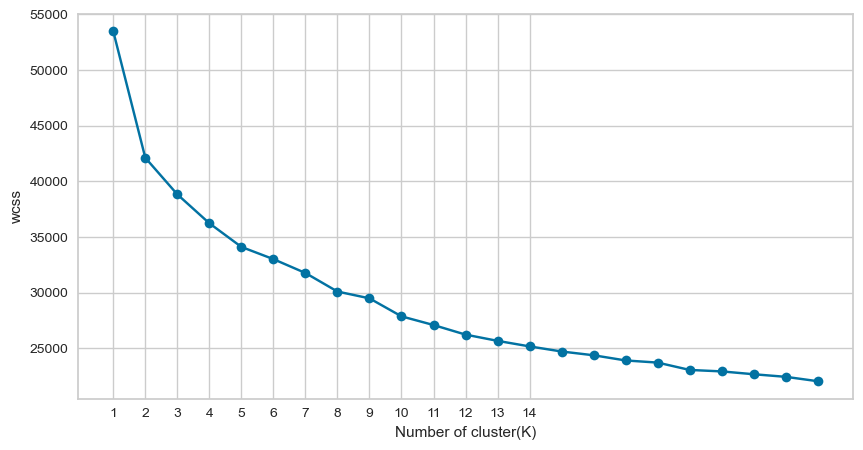

In [485]:
plt.figure(figsize=(10,5))
plt.plot(range(1,len(df.columns)),wcss,marker='o')
plt.xticks(range(1,15))
plt.xlabel('Number of cluster(K)')
plt.ylabel('wcss')
plt.show()

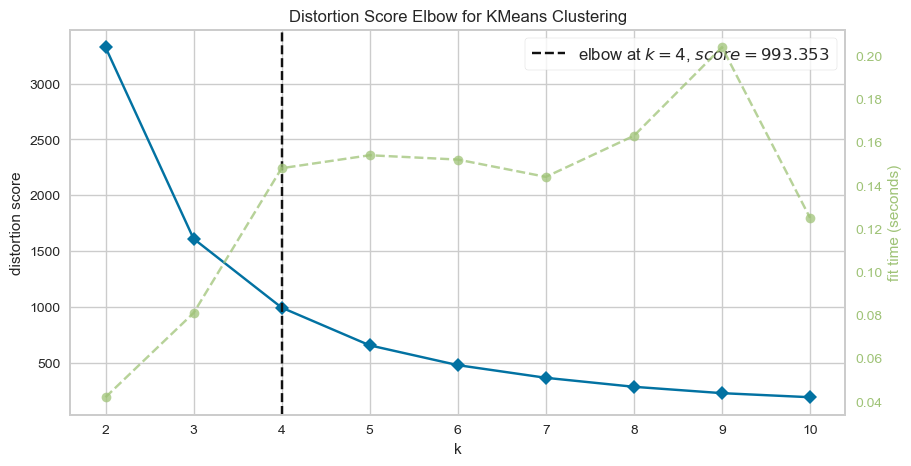

In [486]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans, AgglomerativeClustering
plt.figure(figsize=(10,5))
Elbow_KM = KElbowVisualizer(KMeans(), k=10)
Elbow_KM.fit(pcs)
Elbow_KM.show();

# 4 clusters

In [487]:
kmeans = KMeans(n_clusters = 4, init = "k-means++",random_state=42)
kmeans.fit(pcs)
label = kmeans.predict(pcs)
print('silhouette_score :',round(silhouette_score(pcs,label)*100,4),'%')

silhouette_score : 59.4614 %


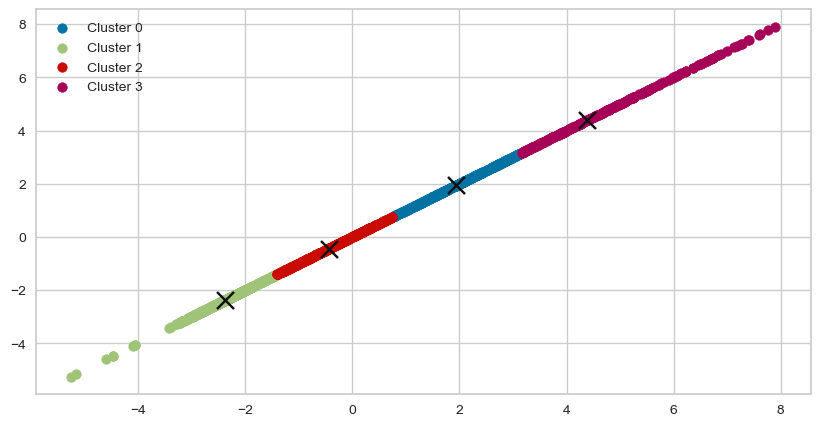

In [488]:
plt.figure(figsize=(10,5))
uniq = np.unique(label)
centers = np.array(kmeans.cluster_centers_)
for i in uniq:
    plt.scatter(pcs[label == i , 0] , pcs[label == i , 0] , label = "Cluster {}".format(i))
plt.scatter(centers[:,0], centers[:,0], marker="x",s=150, color='k')
#This is done to find the centroid for each clusters.
plt.legend()
plt.show()





In [489]:
df_1['Cluster']=label
col=df_1.pop('Cluster')
df_1.insert(0,col.name,col)
df_1.groupby(['Cluster']).mean().sort_values(['Income'],ascending=False)

,age,Years_Enrolled,Income,Total_Expenses,Savings,children,Kidhome,MntWines,Teenhome,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Ttl_Campaign,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,Ttl_place_purchase
Cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,
3,54.228070,10.002924,79405.847703,1654.350877,77751.496826,0.169591,0.026316,717.213450,0.143275,76.061404,506.377193,110.377193,79.628655,88.631579,1.143275,5.508772,6.453216,8.637427,2.839181,1.105263,21.742690,0.052571,0.396411,0.252224,0.298794,0.236598,21.742690
0,56.798742,10.050314,66882.470001,1105.580713,65776.889289,0.666667,0.100629,542.792453,0.566038,47.075472,285.283019,65.163522,47.784067,70.406709,2.429769,5.958071,4.716981,8.626834,4.079665,0.266247,21.731656,0.105807,0.401097,0.272047,0.221049,0.339972,21.731656
2,57.069182,10.054507,52885.147150,497.702306,52387.444844,1.146751,0.341719,300.903564,0.805031,14.006289,86.651992,20.828092,14.392034,46.914046,3.532495,5.389937,2.134172,6.375262,5.771488,0.182390,17.431866,0.192556,0.375265,0.306398,0.125781,0.480957,17.431866
1,51.182208,9.879957,32990.324780,83.524116,32906.800664,1.285102,0.826367,34.400857,0.458735,3.839228,19.103966,5.506967,3.914255,12.919614,2.075027,1.974277,0.430868,3.050375,6.666667,0.079314,7.530547,0.259660,0.437170,0.250664,0.050362,0.555556,7.530547


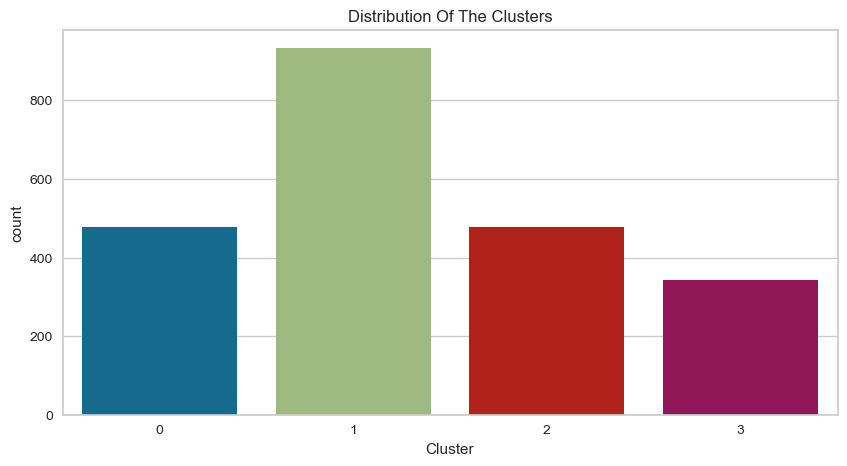

In [490]:
#Plotting countplot of clusters
plt.figure(figsize=(10,5))
pl = sns.countplot(x=df_1["Cluster"])
pl.set_title("Distribution Of The Clusters")
plt.show()

# 6 clusters 

In [491]:
kmeans = KMeans(n_clusters = 6, init = "k-means++",random_state=42)
kmeans.fit(pcs)
label = kmeans.predict(pcs)

'''
plt.figure(figsize=(10,5))
uniq = np.unique(label)
centers = np.array(kmeans.cluster_centers_)
for i in uniq:
    plt.scatter(pcs[label == i , 0] , pcs[label == i , 1] , label = "Cluster {}".format(i))
plt.scatter(centers[:,0], centers[:,1], marker="x",s=150, color='k')
#This is done to find the centroid for each clusters.
plt.legend()
plt.show()
'''
print('silhouette_score :',round(silhouette_score(pcs,label)*100,4),'%')



silhouette_score : 56.726 %


In [492]:
df_1['Cluster']=label
col=df_1.pop('Cluster')
df_1.insert(0,col.name,col)
df_1.groupby(['Cluster']).mean().sort_values(['Income'],ascending=False)

,age,Years_Enrolled,Income,Total_Expenses,Savings,children,Kidhome,MntWines,Teenhome,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Ttl_Campaign,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,Ttl_place_purchase
Cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,
3,55.047619,9.960317,83274.544747,1895.809524,81378.735223,0.071429,0.007937,809.349206,0.063492,88.619048,594.793651,126.182540,93.277778,94.968254,0.880952,5.380952,7.063492,8.539683,2.460317,1.746032,21.865079,0.041234,0.388329,0.244307,0.326129,0.205026,21.865079
1,54.344311,10.050898,75215.180468,1440.808383,73774.372085,0.293413,0.038922,623.227545,0.254491,64.895210,435.245509,98.248503,72.236527,82.059880,1.505988,5.685629,5.877246,8.670659,3.191617,0.577844,21.739521,0.067649,0.399268,0.260285,0.272798,0.265968,21.739521
2,57.077151,10.044510,65746.163771,1057.465875,64688.697895,0.732938,0.127596,545.741840,0.605341,44.801187,255.896142,58.136499,39.887240,68.201780,2.596439,5.946588,4.557864,8.655786,4.281899,0.246291,21.756677,0.111991,0.403210,0.271002,0.213798,0.356825,21.756677
4,57.935714,10.064286,56699.636701,638.664286,56060.972415,1.107143,0.239286,397.764286,0.867857,17.821429,105.425000,25.103571,19.478571,55.250000,3.460714,5.932143,2.685714,7.350000,5.489286,0.253571,19.428571,0.168194,0.385806,0.302928,0.143071,0.457440,19.428571
0,56.107330,9.981675,46469.804164,270.897906,46198.906258,1.274869,0.547120,148.683246,0.727749,8.314136,54.361257,11.965969,7.955497,31.303665,3.209424,4.052356,1.287958,4.680628,6.020942,0.123037,13.230366,0.229358,0.372804,0.297495,0.100343,0.501745,13.230366
5,50.177922,9.871429,30737.198368,64.551948,30672.646420,1.261039,0.854545,22.862338,0.406494,3.410390,15.038961,5.193506,3.542857,11.093506,1.931169,1.751948,0.316883,2.884416,6.797403,0.067532,6.884416,0.262755,0.448277,0.244857,0.041515,0.566450,6.884416


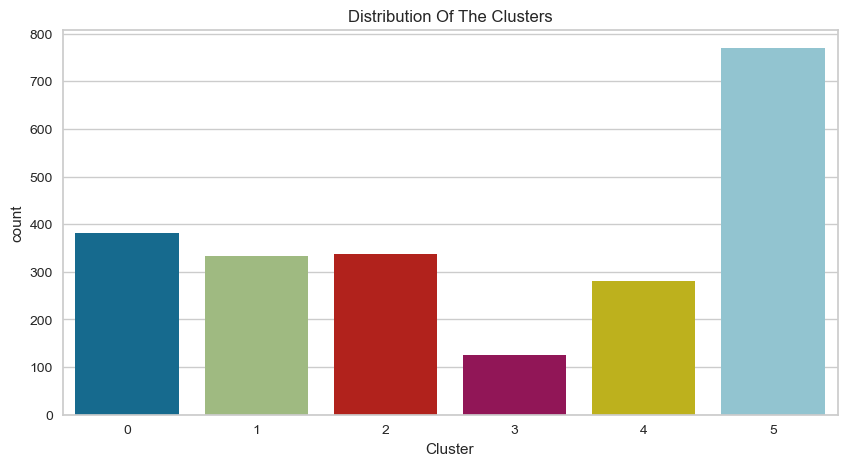

In [493]:
#Plotting countplot of clusters
plt.figure(figsize=(10,5))
pl = sns.countplot(x=df_1["Cluster"])
pl.set_title("Distribution Of The Clusters")
plt.show()

# 5 clusters

In [494]:
kmeans = KMeans(n_clusters = 5, init = "k-means++",random_state=42)
kmeans.fit(pcs)
label = kmeans.predict(pcs)
'''

plt.figure(figsize=(10,5))
uniq = np.unique(label)
centers = np.array(kmeans.cluster_centers_)
for i in uniq:
    plt.scatter(pcs[label == i , 0] , pcs[label == i , 1] , label = "Cluster {}".format(i))
plt.scatter(centers[:,0], centers[:,1], marker="x",s=150, color='k')
#This is done to find the centroid for each clusters.
plt.legend()
plt.show()
'''
print('silhouette_score :',round(silhouette_score(pcs,label)*100,4),'%')



silhouette_score : 59.6207 %


In [495]:
# saving the model
filename='trained_kmeans.sav'
pickle.dump(kmeans,open(filename,'wb'))#writing the binary format
pickle.dump(pcs, open("pca.pkl","wb"))

In [496]:
df['Cluster']=label
col=df.pop('Cluster')
df.insert(0,col.name,col)

df_ano['Cluster']=label
col=df_ano.pop('Cluster')
df_ano.insert(0,col.name,col)

df_1['Cluster']=label
col=df_1.pop('Cluster')
df_1.insert(0,col.name,col)
df_ano.groupby(['Cluster']).mean().sort_values(['Income'],ascending=False)

,Year_Birth,age,Years_Enrolled,Qualification,family,togetherness,Income,Savings,Kidhome,Total_Expenses,Teenhome,economic_status,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Year,Month,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,children,Ttl_place_purchase
Cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2,1967.866667,55.133333,9.948148,1.333333,0.044444,0.600000,83093.989912,81217.167690,0.007407,1876.822222,0.066667,3.325926,0.503704,801.711111,86.703704,591.970370,123.651852,92.985185,93.096296,0.888889,5.429630,7.051852,8.637037,2.459259,0.170370,0.259259,0.622222,0.562963,0.081481,0.000000,0.525926,1.696296,2013.051852,6.511111,22.007407,0.041314,0.389844,0.245186,0.323657,0.204938,0.074074,22.007407
3,1968.427746,54.572254,10.052023,1.355491,0.164740,0.583815,74822.697330,73396.402533,0.037572,1426.294798,0.263006,3.086705,0.482659,620.286127,65.121387,426.907514,96.569364,69.505780,82.783237,1.540462,5.673410,5.820809,8.615607,3.228324,0.069364,0.109827,0.199422,0.141618,0.026012,0.005780,0.277457,0.546243,2012.947977,6.395954,21.650289,0.069404,0.398218,0.260355,0.272023,0.269027,0.300578,21.650289
1,1965.631980,57.368020,10.060914,1.426396,0.474619,0.647208,64377.170535,63381.383733,0.139594,995.786802,0.680203,2.802030,0.487310,536.728426,39.230964,227.558376,51.644670,37.309645,64.083756,2.763959,6.002538,4.241117,8.621827,4.512690,0.060914,0.121827,0.022843,0.030457,0.020305,0.012690,0.109137,0.256345,2012.939086,6.583756,21.629442,0.120943,0.403893,0.276068,0.199096,0.376058,0.819797,21.629442
4,1965.948430,57.051570,10.044843,1.448430,0.589686,0.674888,51528.388320,51087.484732,0.372197,440.903587,0.795964,2.282511,0.486547,260.926009,12.520179,77.378924,19.024664,12.899103,45.634529,3.511211,5.199552,1.941704,6.004484,5.809417,0.065022,0.089686,0.000000,0.015695,0.000000,0.004484,0.109865,0.170404,2012.955157,6.878924,16.656951,0.199210,0.372819,0.307437,0.120533,0.484118,1.168161,16.656951
0,1972.073789,50.926211,9.872247,1.286344,0.598018,0.657489,32613.786365,32533.797378,0.832599,79.988987,0.449339,1.647577,0.518722,32.083700,3.802863,18.307269,5.469163,3.841410,12.681718,2.051762,1.937225,0.411894,3.011013,6.687225,0.069383,0.006608,0.000000,0.000000,0.002203,0.012115,0.082599,0.078194,2013.127753,6.241189,7.411894,0.260430,0.438275,0.249975,0.049117,0.557269,1.281938,7.411894


# cluster 3 : 
* people in 1st cluster of avg age 55 has highest income, saves the most and spends the most are likely to be not a part of family spends most on wine, meat and fish uses discount the least among the clusters to purchase and buys mostly from store doesn't visit website that most (least among all the clusters).

Accepts any one of any campaign most among all the clusters. 

Buys the most among all the clusters.

Uses Discount the least among all the clusters.

buys from store most among all the clusters

buys from Catalog the most among all the clusters

age is doen't matter that much 
 
# cluster 4 :
* people in 2nd cluster of avg age 56 has 2nd highest income, saves the 2nd most and spends the 2nd most are likely to be not a part of family spends most on wine and meat, buys mostly from store doesn't visit website a little more than cluster 1.

buys from Catalog the most among all the clusters

# cluster 2 :

buys from website the most among the clusters.

# cluster 5 :

Uses Discount the most among all the clusters.


# cluster 1 :

are most likely to be a part of family

visits the website the most

buys the least among the clusters


<AxesSubplot:>

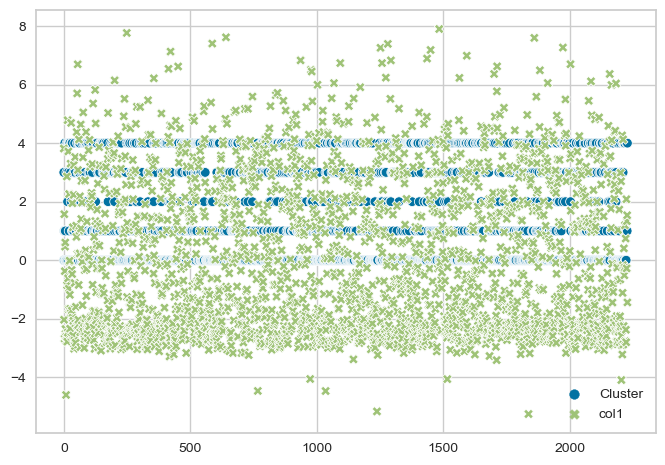

In [497]:
f=pd.concat([df['Cluster'],PCA_ds],axis=1)
sns.scatterplot(data=f)

In [498]:

for i in range(0, len(df_1)):
    if (df_1["Cluster"][i]==0):
         df_1['Cluster'][i]='Lowest'
    elif (df_1['Cluster'][i]==1):
        df_1['Cluster'][i]='Lower middle'
        
    elif (df_1['Cluster'][i]==2):
        df_1['Cluster'][i]='Highest economic class'
        
    elif (df_1['Cluster'][i]==3):
        df_1['Cluster'][i]='Upper middle class'
        
    elif (df_1['Cluster'][i]==4):
        df_1['Cluster'][i]='Low'
        

In [499]:
df_1.head(1)

,Cluster,age,Years_Enrolled,age_divide,Recency,Income,Total_Expenses,Savings,economic_status,Qualification,togetherness,family,children,Kidhome,MntWines,Teenhome,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,Ttl_place_purchase
0,Upper middle class,66,11,Elderly,frequent,58138.0,1705,56433.0,Upper middle,Graduate,no,no,0,0,635,0,88,546,172,88,88,3,8,10,4,7,no,no,no,no,no,no,yes,0,25,0.12,0.16,0.32,0.4,0.583333,25


In [500]:
#2nd cluster
df_1[df_1['Cluster']=='Lowest']

,Cluster,age,Years_Enrolled,age_divide,Recency,Income,Total_Expenses,Savings,economic_status,Qualification,togetherness,family,children,Kidhome,MntWines,Teenhome,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,Ttl_place_purchase
1,Lowest,69,9,Elderly,not frequent,46344.0,28,46316.0,Lower middle,Graduate,no,no,2,1,11,1,1,6,2,1,6,2,1,1,2,5,no,no,no,no,no,no,no,0,6,0.333333,0.333333,0.166667,0.166667,0.416667,6
3,Lowest,39,9,Young,not frequent,26646.0,57,26589.0,Low,Graduate,yes,yes,1,1,11,0,4,20,10,3,5,2,2,0,4,6,no,no,no,no,no,no,no,0,8,0.250000,0.500000,0.250000,0.000000,0.500000,8
7,Lowest,38,10,Young,not frequent,33454.0,179,33275.0,Lower middle,Post graduate,yes,yes,1,1,76,0,10,56,3,1,23,2,4,0,4,8,no,no,no,no,no,no,no,0,10,0.200000,0.400000,0.400000,0.000000,0.666667,10
8,Lowest,49,10,MiddleAge,not frequent,30351.0,46,30305.0,Lower middle,Post graduate,yes,yes,1,1,14,0,0,24,3,3,2,1,3,0,2,9,no,no,no,no,no,no,yes,0,6,0.166667,0.333333,0.500000,0.000000,0.750000,6
9,Lowest,73,9,Elderly,frequent,5648.0,49,5599.0,Extremly low,Post graduate,yes,yes,2,1,28,1,0,6,1,1,13,1,1,0,0,20,yes,no,no,no,no,no,no,1,2,0.500000,0.000000,0.500000,0.000000,1.666667,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2213,Lowest,60,9,MiddleAge,not frequent,33562.0,63,33499.0,Lower middle,Post graduate,yes,yes,3,1,21,2,12,12,0,3,3,3,2,0,4,4,no,no,no,no,no,no,no,0,9,0.333333,0.444444,0.222222,0.000000,0.333333,9
2219,Lowest,51,9,MiddleAge,not frequent,24434.0,52,24382.0,Low,Graduate,yes,yes,2,2,3,0,2,8,20,0,17,2,2,1,2,7,no,no,no,no,no,no,no,0,7,0.285714,0.285714,0.285714,0.142857,0.583333,7
2220,Lowest,39,10,Young,frequent,11012.0,87,10925.0,Low,Graduate,no,no,1,1,24,0,3,26,7,1,23,3,3,1,2,9,yes,no,no,no,no,no,no,1,9,0.333333,0.222222,0.333333,0.111111,0.750000,9
2222,Lowest,37,11,Young,frequent,26816.0,23,26793.0,Low,Graduate,no,no,0,0,5,0,1,6,3,4,3,1,0,0,3,4,no,no,no,no,no,no,no,0,4,0.250000,0.750000,0.000000,0.000000,0.333333,4


In [501]:
#1st cluster
df_1[df_1['Cluster']=='Low']

,Cluster,age,Years_Enrolled,age_divide,Recency,Income,Total_Expenses,Savings,economic_status,Qualification,togetherness,family,children,Kidhome,MntWines,Teenhome,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,Ttl_place_purchase
4,Low,42,9,Young,frequent,58293.0,465,57828.0,Upper middle,Post graduate,yes,yes,1,1,173,0,43,118,46,27,15,5,5,3,6,5,no,no,no,no,no,no,no,0,19,0.263158,0.315789,0.263158,0.157895,0.416667,19
13,Low,71,10,Elderly,frequent,59354.0,312,59042.0,Upper middle,Post graduate,no,no,2,1,233,1,2,53,3,5,14,3,6,1,5,6,no,no,no,no,no,no,no,0,15,0.200000,0.333333,0.400000,0.066667,0.500000,15
17,Low,77,11,Elderly,not frequent,37760.0,322,37438.0,Lower middle,Graduate,yes,no,0,0,84,0,5,38,150,12,28,2,4,1,6,7,no,no,no,no,no,no,no,0,13,0.153846,0.461538,0.307692,0.076923,0.583333,13
20,Low,41,11,Young,not frequent,37040.0,318,36722.0,Lower middle,Graduate,yes,no,0,0,86,0,2,73,69,38,48,1,4,2,5,8,no,no,no,no,no,no,no,0,12,0.083333,0.416667,0.333333,0.166667,0.666667,12
22,Low,74,11,Elderly,frequent,58607.0,972,57635.0,Upper middle,Post graduate,yes,yes,1,0,867,1,0,86,0,0,19,3,2,3,9,8,no,yes,no,no,no,no,no,1,17,0.176471,0.529412,0.117647,0.176471,0.666667,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2215,Low,55,11,MiddleAge,frequent,58554.0,610,57944.0,Upper middle,Graduate,yes,yes,2,1,368,1,24,68,38,0,88,6,8,2,6,7,no,no,no,no,no,no,no,0,22,0.272727,0.272727,0.363636,0.090909,0.583333,22
2216,Low,44,10,Young,frequent,63777.0,658,63119.0,Upper middle,Graduate,yes,yes,2,1,457,1,5,106,15,17,53,8,11,1,6,8,no,no,no,no,no,no,no,0,26,0.307692,0.230769,0.423077,0.038462,0.666667,26
2217,Low,61,10,MiddleAge,not frequent,57967.0,475,57492.0,Upper middle,Graduate,no,no,1,0,229,1,7,137,4,0,91,5,4,2,8,5,no,no,no,no,no,no,no,0,19,0.263158,0.421053,0.210526,0.105263,0.416667,19
2225,Low,77,9,Elderly,frequent,64014.0,444,63570.0,Upper middle,Post graduate,yes,yes,3,2,406,1,0,30,0,0,8,7,8,2,5,7,no,no,no,yes,no,no,no,1,22,0.318182,0.227273,0.363636,0.090909,0.583333,22


In [502]:
#3rd cluster
df_1[df_1['Cluster']=='Lower middle']

,Cluster,age,Years_Enrolled,age_divide,Recency,Income,Total_Expenses,Savings,economic_status,Qualification,togetherness,family,children,Kidhome,MntWines,Teenhome,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,Ttl_place_purchase
2,Lower middle,58,10,MiddleAge,not frequent,71613.000000,825,70788.000000,Upper middle,Graduate,yes,no,0,0,426,0,49,127,111,21,42,1,8,2,10,4,no,no,no,no,no,no,no,0,21,0.047619,0.476190,0.380952,0.095238,0.333333,21
5,Lower middle,56,10,MiddleAge,not frequent,62513.000000,758,61755.000000,Upper middle,Post graduate,yes,yes,1,0,520,1,42,98,0,42,14,2,6,4,10,6,no,no,no,no,no,no,no,0,22,0.090909,0.454545,0.272727,0.181818,0.500000,22
6,Lower middle,52,11,MiddleAge,not frequent,55635.000000,655,54980.000000,Lower middle,Graduate,no,no,1,0,235,1,65,164,50,49,27,4,7,3,7,6,no,no,no,no,no,no,no,0,21,0.190476,0.333333,0.333333,0.142857,0.500000,21
21,Lower middle,44,10,Young,not frequent,2447.000000,1731,716.000000,Extremly low,Graduate,yes,yes,1,1,1,0,1,1725,1,1,1,15,0,28,0,1,no,no,no,no,no,no,no,0,43,0.348837,0.000000,0.000000,0.651163,0.083333,43
34,Lower middle,77,10,Elderly,not frequent,68657.000000,1230,67427.000000,Upper middle,Post graduate,yes,no,0,0,482,0,34,471,119,68,22,1,3,5,9,7,no,no,no,no,no,no,no,0,18,0.055556,0.500000,0.166667,0.277778,0.583333,18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2218,Lower middle,45,11,Young,frequent,51633.638134,1681,49952.638134,Lower middle,Graduate,yes,no,0,0,32,0,2,1607,12,4,22,0,0,0,1,0,no,yes,no,no,no,no,no,1,1,0.000000,1.000000,0.000000,0.000000,0.000000,1
2221,Lower middle,53,11,MiddleAge,frequent,44802.000000,1059,43743.000000,Lower middle,Post graduate,no,no,0,0,853,0,10,143,13,10,20,2,9,4,12,8,no,no,no,no,no,no,no,0,27,0.074074,0.444444,0.333333,0.148148,0.666667,27
2224,Lower middle,56,10,MiddleAge,not frequent,61223.000000,1384,59839.000000,Upper middle,Graduate,yes,yes,1,0,709,1,43,182,42,118,247,2,9,3,4,5,no,no,no,no,no,no,no,0,18,0.111111,0.222222,0.500000,0.166667,0.416667,18
2226,Lower middle,42,9,Young,frequent,56981.000000,1289,55692.000000,Upper middle,Graduate,no,no,0,0,908,0,48,217,32,12,24,1,2,3,13,6,no,yes,no,no,no,no,no,1,19,0.052632,0.684211,0.105263,0.157895,0.500000,19


In [503]:
#4th cluster
df_1[df_1['Cluster']=='Upper middle class']

,Cluster,age,Years_Enrolled,age_divide,Recency,Income,Total_Expenses,Savings,economic_status,Qualification,togetherness,family,children,Kidhome,MntWines,Teenhome,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,Ttl_place_purchase
0,Upper middle class,66,11,Elderly,frequent,58138.000000,1705,56433.000000,Upper middle,Graduate,no,no,0,0,635,0,88,546,172,88,88,3,8,10,4,7,no,no,no,no,no,no,yes,0,25,0.120000,0.160000,0.320000,0.400000,0.583333,25
12,Upper middle class,64,10,Elderly,frequent,63033.000000,1163,61870.000000,Upper middle,Graduate,no,no,0,0,194,0,61,480,225,112,30,1,3,4,8,2,no,no,no,no,no,no,no,0,16,0.062500,0.500000,0.187500,0.250000,0.166667,16
18,Upper middle class,74,10,Elderly,frequent,76995.000000,1862,75133.000000,Upper middle,Post graduate,yes,yes,1,0,1012,1,80,498,0,16,176,2,11,4,9,5,no,no,no,yes,no,no,no,1,26,0.076923,0.346154,0.423077,0.153846,0.416667,26
27,Upper middle class,37,10,Young,not frequent,51633.638134,638,50995.638134,Lower middle,Graduate,no,no,1,1,5,0,1,3,3,263,362,0,27,0,0,1,no,no,no,no,no,no,no,0,27,0.000000,0.000000,1.000000,0.000000,0.083333,27
40,Upper middle class,43,10,Young,not frequent,80011.000000,1471,78540.000000,Upper middle,Graduate,yes,yes,1,0,421,1,76,536,82,178,102,2,8,6,5,4,no,no,no,no,no,no,no,0,21,0.095238,0.238095,0.380952,0.285714,0.333333,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2184,Upper middle class,66,11,Elderly,frequent,73803.000000,1608,72195.000000,Upper middle,Graduate,yes,yes,1,0,833,1,80,363,52,26,174,2,9,5,6,6,yes,no,no,no,no,no,yes,1,22,0.090909,0.272727,0.409091,0.227273,0.500000,22
2201,Upper middle class,42,9,Young,not frequent,88325.000000,1694,86631.000000,High,Graduate,yes,no,0,0,519,0,71,860,93,27,53,1,6,2,9,2,no,no,no,no,no,no,no,0,18,0.055556,0.500000,0.333333,0.111111,0.166667,18
2203,Upper middle class,28,11,Young,not frequent,80617.000000,1486,79131.000000,Upper middle,Graduate,no,no,0,0,594,0,51,631,72,55,32,1,4,6,8,2,no,no,no,no,no,no,no,0,19,0.052632,0.421053,0.210526,0.315789,0.166667,19
2207,Upper middle class,75,9,Elderly,frequent,82032.000000,1428,80604.000000,Upper middle,Post graduate,no,no,0,0,332,0,194,377,149,125,57,0,4,6,7,1,no,no,no,no,no,no,no,0,17,0.000000,0.411765,0.235294,0.352941,0.083333,17


In [504]:
#4th cluster
df_1[df_1['Cluster']=='Highest economic class']

,Cluster,age,Years_Enrolled,age_divide,Recency,Income,Total_Expenses,Savings,economic_status,Qualification,togetherness,family,children,Kidhome,MntWines,Teenhome,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,Ttl_place_purchase
15,Highest economic class,77,11,Elderly,not frequent,82800.0,1337,81463.0,Upper middle,Post graduate,no,no,0,0,1006,0,22,115,59,68,45,1,7,6,12,3,no,no,yes,yes,no,no,yes,2,26,0.038462,0.461538,0.269231,0.230769,0.250000,26
29,Highest economic class,58,10,MiddleAge,frequent,84618.0,1772,82846.0,Upper middle,Post graduate,yes,no,0,0,684,0,100,801,21,66,0,1,6,9,10,2,no,no,yes,no,no,no,no,1,26,0.038462,0.384615,0.230769,0.346154,0.166667,26
51,Highest economic class,59,11,MiddleAge,not frequent,79143.0,1730,77413.0,Upper middle,Post graduate,yes,no,0,0,650,0,37,780,27,167,32,1,6,9,13,3,no,no,no,no,no,no,no,0,29,0.034483,0.448276,0.206897,0.310345,0.250000,29
53,Highest economic class,46,9,MiddleAge,frequent,82582.0,1737,80845.0,Upper middle,Graduate,no,no,0,0,510,0,120,550,156,40,241,1,4,9,7,1,yes,no,no,yes,no,no,yes,2,21,0.047619,0.333333,0.190476,0.428571,0.083333,21
55,Highest economic class,68,11,Elderly,frequent,82384.0,2008,80376.0,Upper middle,Post graduate,yes,no,0,0,984,0,51,432,180,120,190,1,3,10,13,1,no,no,yes,no,no,no,yes,1,27,0.037037,0.481481,0.111111,0.370370,0.083333,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2158,Highest economic class,39,10,Young,frequent,90000.0,1623,88377.0,High,Graduate,yes,no,0,0,675,0,144,133,94,192,241,1,4,8,5,1,yes,no,yes,yes,no,no,no,3,18,0.055556,0.277778,0.222222,0.444444,0.083333,18
2165,Highest economic class,48,10,MiddleAge,not frequent,79174.0,2080,77094.0,Upper middle,Post graduate,yes,no,0,0,1074,0,37,518,193,92,129,1,5,6,7,2,no,no,yes,yes,no,no,yes,2,19,0.052632,0.368421,0.263158,0.315789,0.166667,19
2177,Highest economic class,67,9,Elderly,frequent,84117.0,1642,82475.0,Upper middle,Post graduate,yes,no,0,0,611,0,76,749,59,45,26,1,7,10,6,2,no,no,yes,no,no,no,no,1,24,0.041667,0.250000,0.291667,0.416667,0.166667,24
2180,Highest economic class,40,10,Young,not frequent,89616.0,1691,87925.0,High,Post graduate,no,no,0,0,671,0,47,655,145,111,15,1,7,5,12,2,no,no,no,no,no,no,yes,0,25,0.040000,0.480000,0.280000,0.200000,0.166667,25


In [505]:
df_1[df_1['Cluster']=='Highest economic class'].describe().T

,count,mean,std,min,25%,50%,75%,max
age,135.0,55.133333,14.049380,29.000000,44.000000,54.000000,66.000000,82.000000
Years_Enrolled,135.0,9.948148,0.715693,9.000000,9.000000,10.000000,10.000000,11.000000
Income,135.0,83093.989912,8296.794044,51633.638134,78379.000000,82427.000000,89346.000000,105471.000000
Total_Expenses,135.0,1876.822222,358.266991,550.000000,1644.000000,1868.000000,2142.000000,2696.000000
Savings,135.0,81217.167690,8297.640838,49943.638134,76337.000000,80449.000000,87296.500000,103566.000000
children,135.0,0.074074,0.289869,0.000000,0.000000,0.000000,0.000000,2.000000
Kidhome,135.0,0.007407,0.086066,0.000000,0.000000,0.000000,0.000000,1.000000
MntWines,135.0,801.711111,294.450332,152.000000,564.500000,784.000000,1000.000000,1493.000000
Teenhome,135.0,0.066667,0.278589,0.000000,0.000000,0.000000,0.000000,2.000000
MntFruits,135.0,86.703704,53.255520,0.000000,37.500000,84.000000,134.000000,190.000000


In [506]:
df[df['Cluster']==1].describe().T

,count,mean,std,min,25%,50%,75%,max
Cluster,394.0,1.000000,0.000000,1.0,1.00,1.0,1.00,1.0
age,394.0,57.368020,10.918812,29.0,49.00,57.0,67.00,80.0
Years_Enrolled,394.0,10.060914,0.666421,9.0,10.00,10.0,11.00,11.0
Qualification,394.0,1.426396,0.500294,0.0,1.00,1.0,2.00,2.0
family,394.0,0.474619,0.499990,0.0,0.00,0.0,1.00,1.0
Income,394.0,64377.170535,10289.971931,2447.0,58419.00,64861.5,70659.00,93404.0
Recency,394.0,0.487310,0.500474,0.0,0.00,0.0,1.00,1.0
MntWines,394.0,536.728426,278.076206,1.0,321.75,517.5,708.50,1396.0
MntFruits,394.0,39.230964,35.473747,0.0,12.25,28.0,58.00,194.0
MntMeatProducts,394.0,227.558376,161.104262,29.0,133.00,194.5,279.50,1725.0


In [507]:
df[df['Cluster']==2].describe().T

,count,mean,std,min,25%,50%,75%,max
Cluster,135.0,2.000000,0.000000,2.000000,2.0,2.0,2.0,2.0
age,135.0,55.133333,14.049380,29.000000,44.0,54.0,66.0,82.0
Years_Enrolled,135.0,9.948148,0.715693,9.000000,9.0,10.0,10.0,11.0
Qualification,135.0,1.333333,0.473160,1.000000,1.0,1.0,2.0,2.0
family,135.0,0.044444,0.206848,0.000000,0.0,0.0,0.0,1.0
Income,135.0,83093.989912,8296.794044,51633.638134,78379.0,82427.0,89346.0,105471.0
Recency,135.0,0.503704,0.501848,0.000000,0.0,1.0,1.0,1.0
MntWines,135.0,801.711111,294.450332,152.000000,564.5,784.0,1000.0,1493.0
MntFruits,135.0,86.703704,53.255520,0.000000,37.5,84.0,134.0,190.0
MntMeatProducts,135.0,591.970370,244.374436,102.000000,430.0,622.0,790.0,974.0


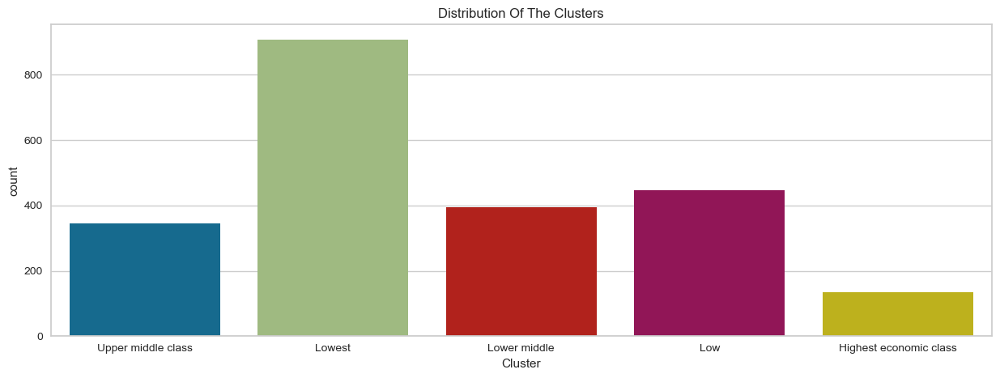

In [508]:
#Plotting countplot of clusters
plt.figure(figsize=(15,5))
pl = sns.countplot(x=df_1["Cluster"])
pl.set_title("Distribution Of The Clusters")
plt.show()

* LOwest economic status people has highest in number

Text(0.5, 0, 'Income')

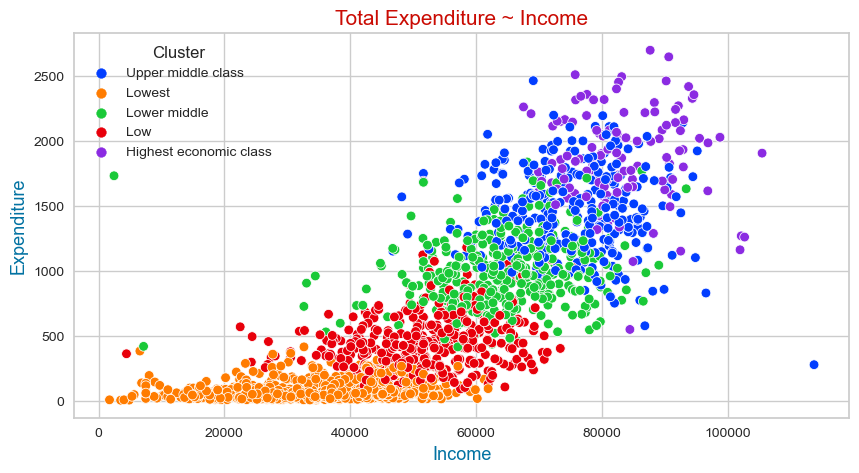

In [509]:
plt.figure(figsize=(10,5))
sns.scatterplot(df_1['Income'],df_1['Total_Expenses'],hue=df_1['Cluster'],palette='bright')
plt.title('Total Expenditure ~ Income',size=15,color='r')
plt.ylabel('Expenditure',size=13,color='b')
plt.xlabel('Income',size=13,color='b')

Text(0, 0.5, 'Expenditure on meat')

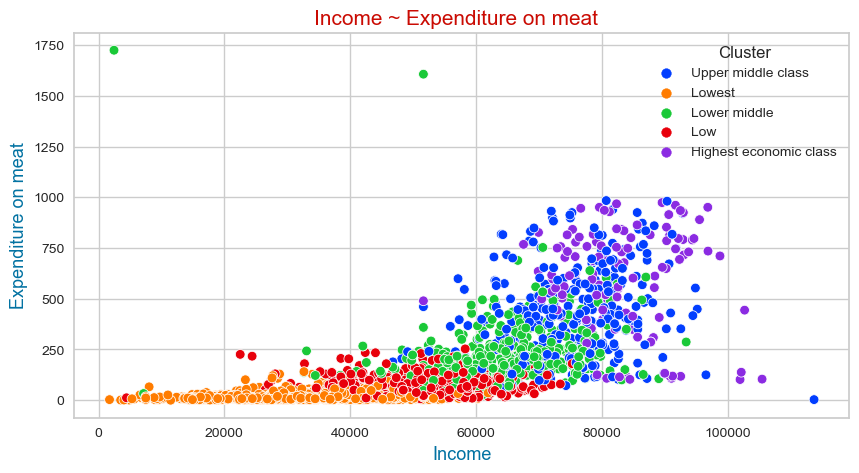

In [510]:
plt.figure(figsize=(10,5))
sns.scatterplot(df_1['Income'],df_1['MntMeatProducts'],hue=df_1['Cluster'],palette='bright')
plt.title('Income ~ Expenditure on meat  ',size=15,color='r')
plt.xlabel('Income',size=13,color='b')
plt.ylabel('Expenditure on meat',size=13,color='b')

* Highest economic spents most on meat

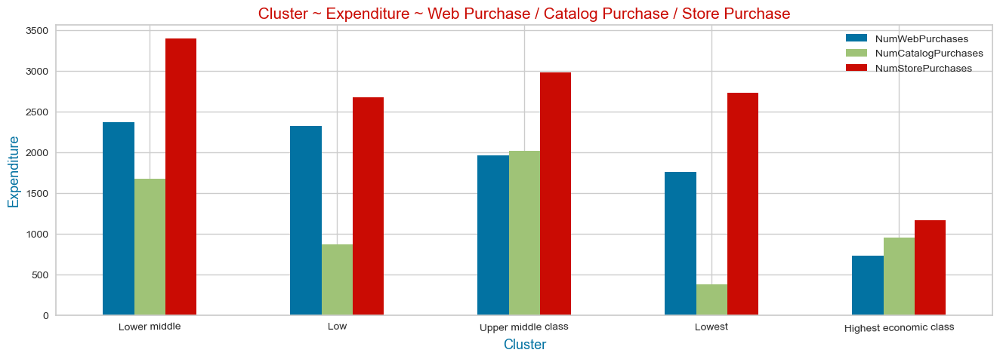

In [511]:
# purchase type according to age
data = df_1[['Cluster', "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"]].groupby(["Cluster"]).sum().reset_index().sort_values(by=["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"], ascending=False)
data.plot(x="Cluster", ylabel= "Total_Expenses", kind="bar", figsize=(16, 5), legend=True, grid=True, 
        title="Number of Purchase Type According to Cluster",rot=True)
plt.title(' Cluster ~ Expenditure ~ Web Purchase / Catalog Purchase / Store Purchase ',size=15,color='r')
plt.xlabel('Cluster',size=13,color='b')
plt.ylabel('Expenditure',size=13,color='b')
plt.show()

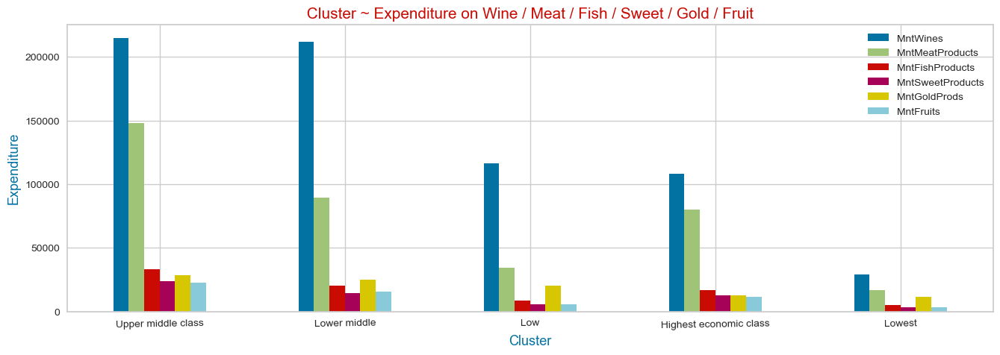

In [512]:

data = df_1[['Cluster',  'MntWines','MntMeatProducts',
        'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds','MntFruits']].groupby(["Cluster"]).sum().reset_index().sort_values(by=[ 'MntWines',
       'MntMeatProducts' , 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds','MntFruits'], ascending=False)
data.plot(x="Cluster", ylabel= "Total_Expenses", kind="bar", figsize=(16,5), legend=True, grid=True, 
        title="Amount spent on products Type According to Cluster",rot=True)
plt.title(' Cluster ~ Expenditure on Wine / Meat / Fish / Sweet / Gold / Fruit ',size=15,color='r')
plt.xlabel('Cluster',size=13,color='b')
plt.ylabel('Expenditure',size=13,color='b')

plt.show()

Text(0, 0.5, 'Years of Enrollment')

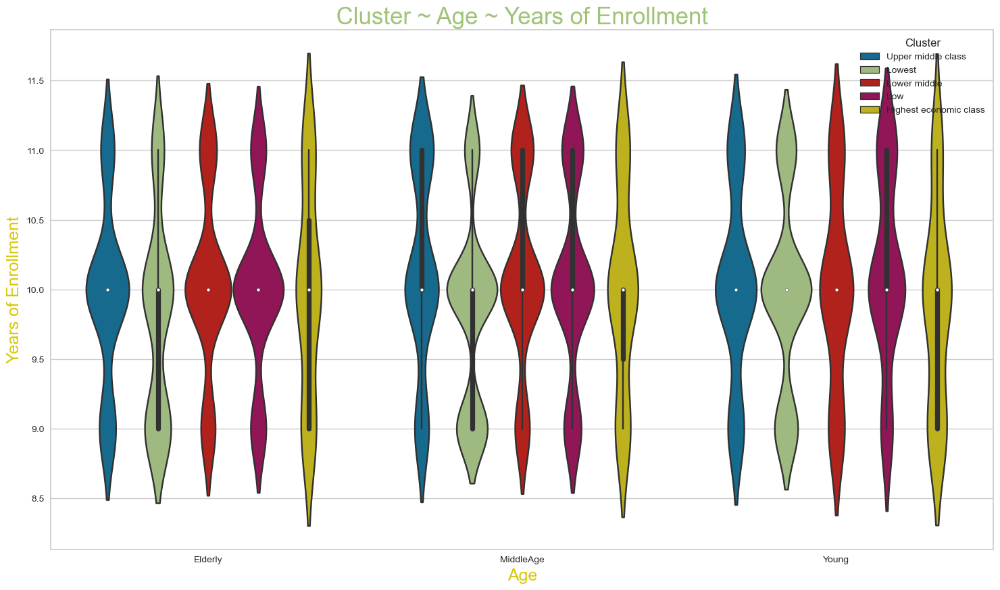

In [513]:
# purchase type according to age
plt.figure(figsize=(18,10))
sns.violinplot(df_1['age_divide'],df_1['Years_Enrolled'],hue=df_1['Cluster'])
plt.title(' Cluster ~ Age ~ Years of Enrollment ',size=25,color='g')
plt.xlabel('Age',size=18,color='y')
plt.ylabel('Years of Enrollment',size=18,color='y')


Text(0, 0.5, 'count')

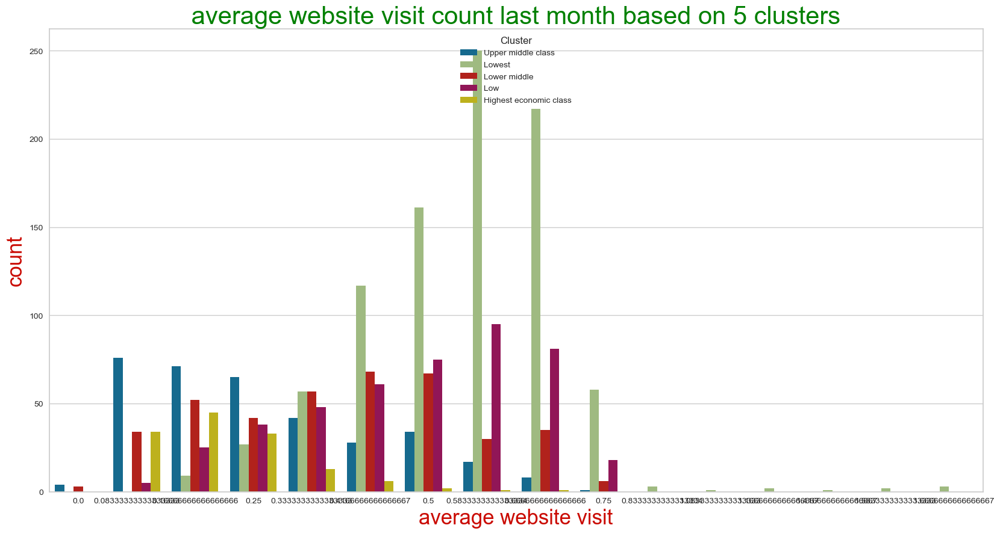

In [514]:
plt.figure(figsize=(20,10))
sns.countplot(df_1['avg_web_visits'],hue=df_1['Cluster'])
plt.title(' average website visit count last month based on 5 clusters ',size=30,color='green')
plt.xlabel('average website visit',size=25,color='r')
plt.ylabel('count',size=25,color='r')


* we see that lowest economic cluster i.e., 5th cluster having lowest income visit the website mid-month and highest economically stable cluster i.e., 1st cluster visits the website at the start of the month but not anymore after midmonth.
* Upper middle economically stable cluster i.e., 2nd cluster also likes to visit the website at the start of the month till midmonth.
* 3rd cluster is likely to visits the website approximately constantly throughtout the month

In [515]:
df_ano.head(1)

,Cluster,Year_Birth,age,Years_Enrolled,Education,Qualification,family,togetherness,Marital_Status,Income,Savings,Kidhome,Total_Expenses,Teenhome,economic_status,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Year,Month,age_divide,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,children,Ttl_place_purchase
0,3,1957,66,11,Graduation,1,0,0,Single,58138.0,56433.0,0,1705,0,3,2012-09-04,0,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1,0,2012,9,Elderly,25,0.12,0.16,0.32,0.4,0.583333,0,25


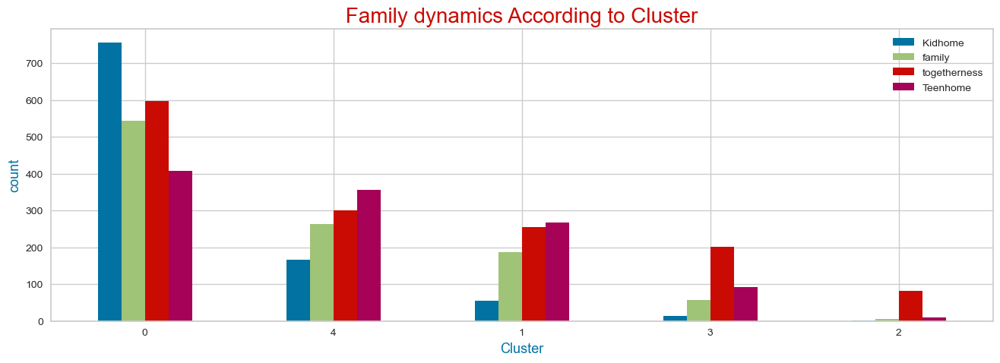

In [516]:
data = df_ano[['Cluster',  'Kidhome','family',
        'togetherness', 'Teenhome']].groupby(["Cluster"]).sum().reset_index().sort_values(by=[ 'Kidhome','family',
        'togetherness', 'Teenhome'], ascending=False)
data.plot(x="Cluster", ylabel= "count", kind="bar", figsize=(16,5), legend=True, grid=True, 
        title="Family dynamics According to Cluster",rot=True)
plt.title(' Family dynamics According to Cluster ',size=20,color='r')
plt.xlabel('Cluster',size=13,color='b')
plt.ylabel('count',size=13,color='b')

plt.show()

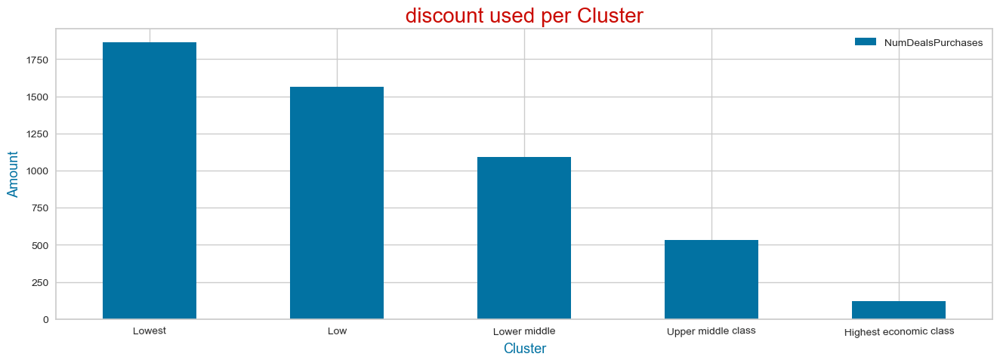

In [517]:
data = df_1[['Cluster',  'NumDealsPurchases']].groupby(["Cluster"]).sum().reset_index().sort_values(by=[ 'NumDealsPurchases'], ascending=False)
data.plot(x="Cluster", ylabel= "count", kind="bar", figsize=(16,5), legend=True, grid=True, 
        title="discount used per Cluster",rot=True)

plt.title(' discount used per Cluster ',size=20,color='r')
plt.xlabel('Cluster',size=13,color='b')
plt.ylabel('Amount',size=13,color='b')

plt.show()

In [518]:
# lowest economically stable i.e.last cluster uses discount the most 

In [519]:
df_1.to_csv('df_with_cluster.csv')

In [520]:
df_1

,Cluster,age,Years_Enrolled,age_divide,Recency,Income,Total_Expenses,Savings,economic_status,Qualification,togetherness,family,children,Kidhome,MntWines,Teenhome,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Ttl_Campaign,Ttl_no_Purchase,Deals_Purchase_Ratio,Store_Purchase_Ratio,Web_Purchase_Ratio,Catalogue_Purchase_Ratio,avg_web_visits,Ttl_place_purchase
0,Upper middle class,66,11,Elderly,frequent,58138.0,1705,56433.0,Upper middle,Graduate,no,no,0,0,635,0,88,546,172,88,88,3,8,10,4,7,no,no,no,no,no,no,yes,0,25,0.120000,0.160000,0.320000,0.400000,0.583333,25
1,Lowest,69,9,Elderly,not frequent,46344.0,28,46316.0,Lower middle,Graduate,no,no,2,1,11,1,1,6,2,1,6,2,1,1,2,5,no,no,no,no,no,no,no,0,6,0.333333,0.333333,0.166667,0.166667,0.416667,6
2,Lower middle,58,10,MiddleAge,not frequent,71613.0,825,70788.0,Upper middle,Graduate,yes,no,0,0,426,0,49,127,111,21,42,1,8,2,10,4,no,no,no,no,no,no,no,0,21,0.047619,0.476190,0.380952,0.095238,0.333333,21
3,Lowest,39,9,Young,not frequent,26646.0,57,26589.0,Low,Graduate,yes,yes,1,1,11,0,4,20,10,3,5,2,2,0,4,6,no,no,no,no,no,no,no,0,8,0.250000,0.500000,0.250000,0.000000,0.500000,8
4,Low,42,9,Young,frequent,58293.0,465,57828.0,Upper middle,Post graduate,yes,yes,1,1,173,0,43,118,46,27,15,5,5,3,6,5,no,no,no,no,no,no,no,0,19,0.263158,0.315789,0.263158,0.157895,0.416667,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2224,Lower middle,56,10,MiddleAge,not frequent,61223.0,1384,59839.0,Upper middle,Graduate,yes,yes,1,0,709,1,43,182,42,118,247,2,9,3,4,5,no,no,no,no,no,no,no,0,18,0.111111,0.222222,0.500000,0.166667,0.416667,18
2225,Low,77,9,Elderly,frequent,64014.0,444,63570.0,Upper middle,Post graduate,yes,yes,3,2,406,1,0,30,0,0,8,7,8,2,5,7,no,no,no,yes,no,no,no,1,22,0.318182,0.227273,0.363636,0.090909,0.583333,22
2226,Lower middle,42,9,Young,frequent,56981.0,1289,55692.0,Upper middle,Graduate,no,no,0,0,908,0,48,217,32,12,24,1,2,3,13,6,no,yes,no,no,no,no,no,1,19,0.052632,0.684211,0.105263,0.157895,0.500000,19
2227,Lower middle,67,9,Elderly,not frequent,69245.0,873,68372.0,Upper middle,Post graduate,yes,yes,1,0,428,1,30,214,80,30,61,2,6,5,10,3,no,no,no,no,no,no,no,0,23,0.086957,0.434783,0.260870,0.217391,0.250000,23


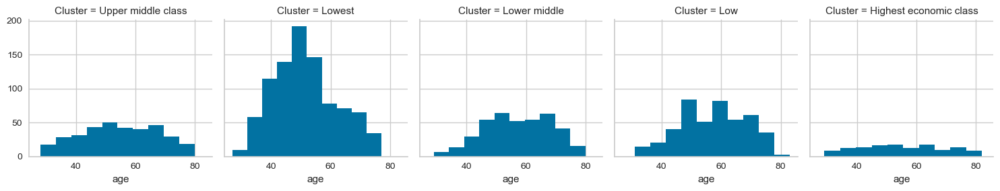

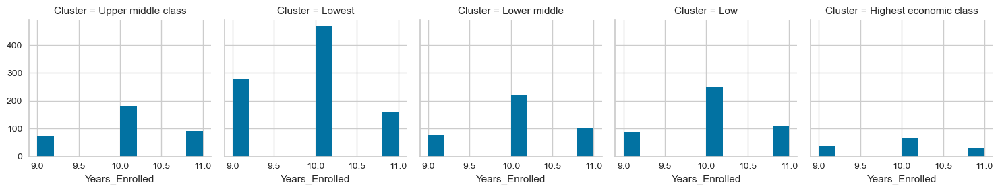

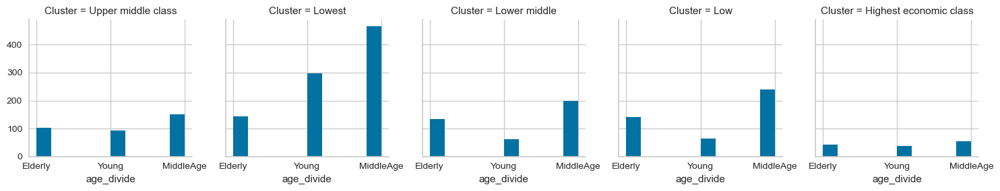

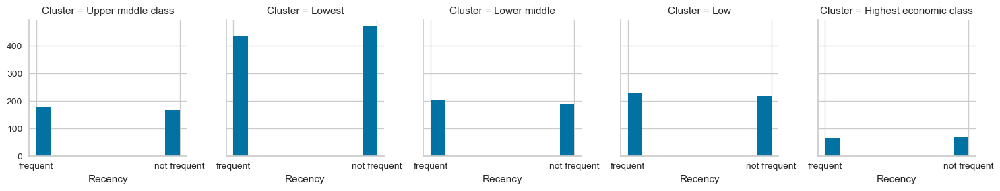

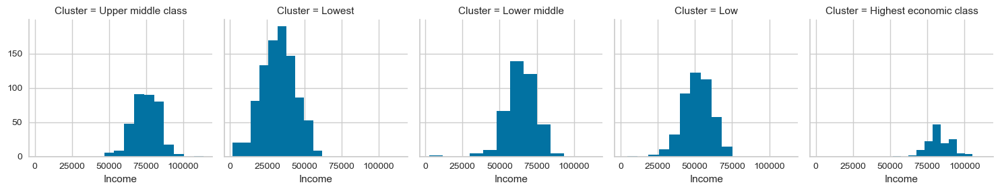

...

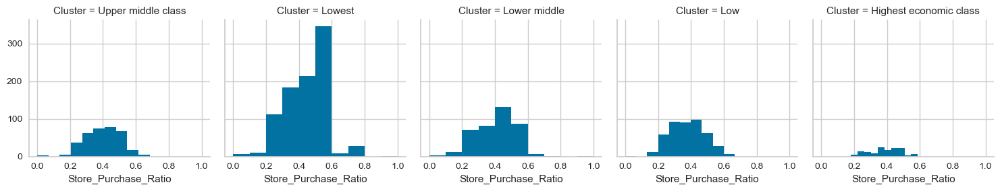

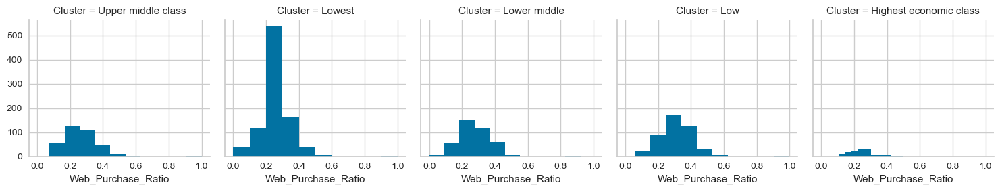

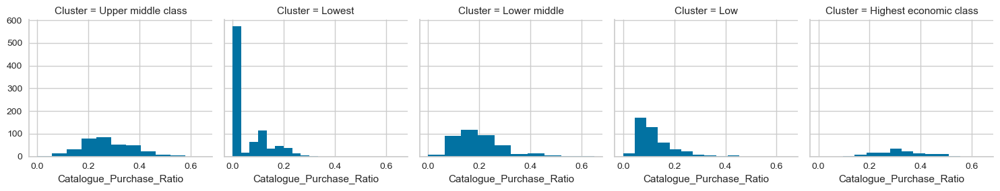

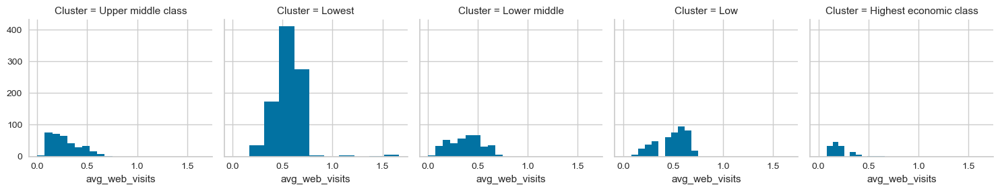

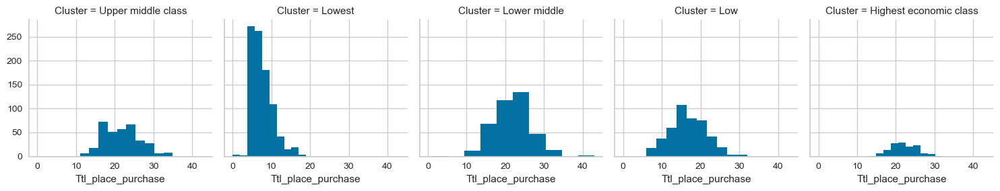

In [521]:
for c in df_1.drop(['Cluster'],axis=1):
    grid=sns.FacetGrid(df_1,col='Cluster')
    grid=grid.map(plt.hist,c)
plt.show()

# KMeans with 5 clusters Silhouette score->59.62%

In [522]:
df.columns

Index(['Cluster', 'age', 'Years_Enrolled', 'Qualification', 'family', 'Income',
       'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Complain', 'Response'],
      dtype='object')

# creating new data

In [523]:
pickle.dump(pcs, open("pca.sav","wb"))

In [524]:
value=[[77,10,1,1,59647,0,600,77,456,200,77,95,4,5,7,6,6,0,0,1,0,0,0,1]]

test=pd.DataFrame(value,columns=['age', 'Years_Enrolled', 'Qualification', 'family', 'Income',
       'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Complain', 'Response'])

test#dataset
#input_data_as_numpy_array=np.asarray(test)

n=scaler.fit_transform(test)
n=pca.transform(n)

In [525]:
n

array([[-4.28188854e-17]])

In [526]:
df.head(1)

,Cluster,age,Years_Enrolled,Qualification,family,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,3,66,11,1,0,58138.0,0,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1


# Splitting data into 2 segments 

In [527]:
y=df.iloc[:,0]
x=df.iloc[:,1:]
x

,age,Years_Enrolled,Qualification,family,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,66,11,1,0,58138.0,0,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,69,9,1,0,46344.0,1,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,58,10,1,0,71613.0,1,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,39,9,1,1,26646.0,1,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,42,9,2,1,58293.0,0,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2224,56,10,1,1,61223.0,1,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2225,77,9,2,1,64014.0,0,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
2226,42,9,1,0,56981.0,0,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2227,67,9,2,1,69245.0,1,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


In [528]:
x=scaler.fit_transform(x)

In [529]:
xtrain,xtest,ytrain,ytest=train_test_split(pcs,y,test_size=0.2,random_state=1)

# knn to classify new data into cluster:

In [530]:
knn=KNeighborsClassifier()
knn.fit(xtrain,ytrain)
ypred=knn.predict(xtest)
#check for overfitting or underfitting
print("Training accuracy:",knn.score(xtrain,ytrain))
print("Testing accuracy:",knn.score(xtest,ytest))
print('Testing accuracy-Training accuracy =',round(abs(knn.score(xtest,ytest)-knn.score(xtrain,ytrain))*100),'%')


Training accuracy: 0.9988782950084127
Testing accuracy: 1.0
Testing accuracy-Training accuracy = 0 %


---------------------------------------------------------
Best cross val accuracy is 99.77528089887639 with K = 1
---------------------------------------------------------


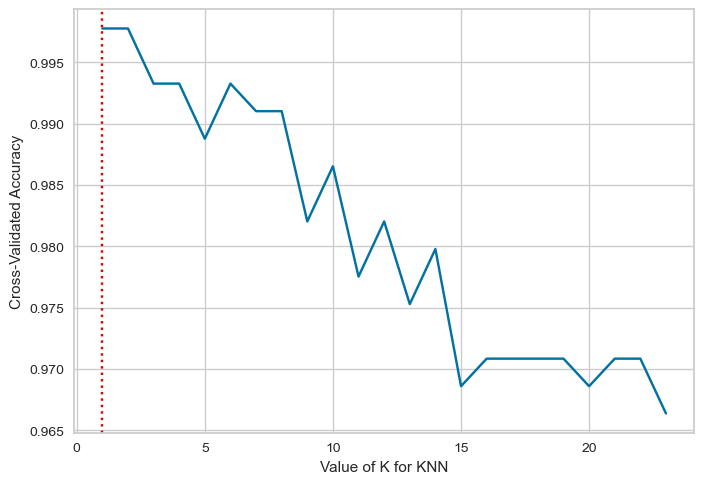

In [531]:
k_range = range(1, 24)
k_scores = []
# use iteration to caclulator different k in models, then return the average accuracy based on the cross validation
for i in k_range:
    knn = KNeighborsClassifier(n_neighbors=i)
    scores = cross_val_score(knn, xtest,ytest, cv=5)
    k_scores.append(scores.mean())
plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-Validated Accuracy')

plt.axvline(1+k_scores.index(np.max(k_scores)),color='r',linestyle=':')
print("---------------------------------------------------------\nBest cross val accuracy is {} with K = {}\n---------------------------------------------------------".format(np.max(k_scores)*100,1+k_scores.index(np.max(k_scores))))

In [532]:
training_accuracy=[]

testing_accuracy=[]
for i in range(1,25): # making 25 models to test for 1st to 2nd neighbour then to 3rd then to 4th till 24th
    knn=KNeighborsClassifier(n_neighbors=i)
    
    knn.fit(xtrain,ytrain)
    training_accuracy.append(knn.score(xtrain,ytrain))
    testing_accuracy.append(knn.score(xtest,ytest))
print("Best cross val accuracy is {} with K = {}".format(np.max(k_scores)*100,1+k_scores.index(np.max(k_scores))))

Best cross val accuracy is 99.77528089887639 with K = 1


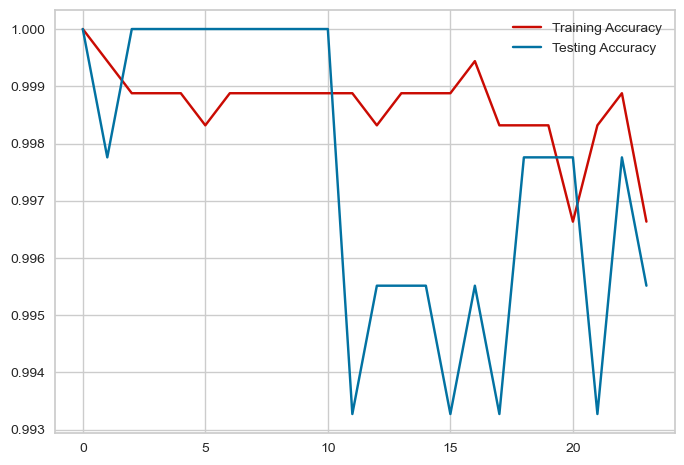

In [533]:
plt.plot(training_accuracy,color='r',label='Training Accuracy')
plt.plot(testing_accuracy,color='b',label='Testing Accuracy')
plt.legend()

In [534]:
knn=KNeighborsClassifier()#n_neighbors=15) # n_neighbours can't be continuous # accuracy will be compromised to get a generalised model
knn.fit(xtrain,ytrain)
ypred=knn.predict(xtest)
#check for overfitting or underfitting
print("Training accuracy:",knn.score(xtrain,ytrain))
print("Testing accuracy:",knn.score(xtest,ytest))
print('Testing accuracy-Training accuracy =',round(abs(knn.score(xtest,ytest)-knn.score(xtrain,ytrain))*100,2),'%')

Training accuracy: 0.9988782950084127
Testing accuracy: 1.0
Testing accuracy-Training accuracy = 0.11 %


In [535]:
print("---------------------------------------\nPrediction Accuracy:",round(accuracy_score(ytest,ypred)*100,2),'%\n---------------------------------------')

---------------------------------------
Prediction Accuracy: 100.0 %
---------------------------------------


# Predicting cluster of new data

In [536]:
print(knn.predict(n))#scaled ds
predicted=knn.predict(n)
print(predicted)#ahnged knn to loaded_model
if (predicted[0]==0):
          print( ' 1st Cluster ')
elif (predicted[0]==1):
          print( ' 2nd Cluster')
elif (predicted[0]==2):
          print( ' 3rd Cluster ')
elif (predicted[0]==3):
          print( ' 4th Cluster')
elif (predicted[0]==4):
          print( ' 5th Cluster')

[4]
[4]
 5th Cluster


In [537]:
df.to_csv('df.csv',index=False)

In [538]:
df=pd.read_csv('df.csv')
df

,Cluster,age,Years_Enrolled,Qualification,family,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,3,66,11,1,0,58138.0,0,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,1
1,0,69,9,1,0,46344.0,1,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,0
2,1,58,10,1,0,71613.0,1,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,0
3,0,39,9,1,1,26646.0,1,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,0
4,4,42,9,2,1,58293.0,0,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2224,1,56,10,1,1,61223.0,1,709,43,182,42,118,247,2,9,3,4,5,0,0,0,0,0,0,0
2225,4,77,9,2,1,64014.0,0,406,0,30,0,0,8,7,8,2,5,7,0,0,0,1,0,0,0
2226,1,42,9,1,0,56981.0,0,908,48,217,32,12,24,1,2,3,13,6,0,1,0,0,0,0,0
2227,1,67,9,2,1,69245.0,1,428,30,214,80,30,61,2,6,5,10,3,0,0,0,0,0,0,0


In [539]:
test['Cluster']=knn.predict(n)
col=test.pop('Cluster')
test.insert(0,col.name,col)

In [540]:
len(test.columns)

25

In [541]:
len(df.columns)

25

In [542]:
df = df.append(test, ignore_index = True) #adding new data to data frame

In [543]:
# saving the model


import joblib
filename='trained_model.sav'
pickle.dump(knn,open(filename,'wb'))#writing the binary format
pcaname='pca_model.joblib'
# save pca in a pickle file
with open('pca.pkl', 'wb') as pickle_file:
        pickle.dump(pcs_fit, pickle_file)

In [544]:
# loading the saved model
loaded_model=pickle.load(open('trained_model.sav','rb'))#rb=reading binabry format
#loaded_pca=joblib.load(open('pca.pkl','rb'))
value=[[77,10,1,1,59647,0,600,77,456,200,77,95,4,5,7,6,6,0,0,1,0,0,0,1]]

test=pd.DataFrame(value,columns=['age', 'Years_Enrolled', 'Qualification', 'family', 'Income',
       'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'AcceptedCmp3',
       'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1', 'AcceptedCmp2',
       'Complain', 'Response'])

test#dataset

n_sc=scaler.fit_transform(test)
with open('pca.pkl', 'rb') as pickle_file:
    pca = pickle.load(pickle_file)
n = pca.transform(n_sc) 
print(loaded_model.predict(n))#ahnged knn to loaded_model
test['Cluster']=loaded_model.predict(n)
col=test.pop('Cluster')
test.insert(0,col.name,col)
test.head(1)



[4]


,Cluster,age,Years_Enrolled,Qualification,family,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,4,77,10,1,1,59647,0,600,77,456,200,77,95,4,5,7,6,6,0,0,1,0,0,0,1


In [545]:
n

array([[-4.28188854e-17]])

# DBSCAN

In [ ]:
db=DBSCAN()

In [ ]:
len(pcs)

In [ ]:
neigh=NearestNeighbors(n_neighbors=3).fit(pcs)
dist,ind=neigh.kneighbors(pcs)

In [ ]:
pd.DataFrame(dist).head()

In [ ]:
distance=np.sort(dist[:,1],axis=0)
distance

In [ ]:
sns.set_style('darkgrid')
plt.plot(distance)

In [ ]:
db=DBSCAN(eps=0.04,min_samples=5)
db.fit(pcs)

y=db.labels_
silhouette_score(pcs,y)

In [ ]:
db=DBSCAN(eps=0.02,min_samples=5)
db.fit(pcs)

y=db.labels_
silhouette_score(pcs,y)

In [ ]:
db=DBSCAN(eps=0.6,min_samples=15)#best result in 2 pcs
db.fit(pcs)

y=db.labels_
silhouette_score(pcs,y)

In [ ]:
#final: # best for 1 pc
db=DBSCAN(eps=.077,min_samples=25)# creates 4 
db.fit(pcs)
#473764#.77#25
y=db.labels_
silhouette_score(pcs,y)

In [ ]:
df_db.loc[:,'Cluster']=y
df_db.Cluster.value_counts().to_frame()

In [ ]:
len(df_db['Cluster'].unique())

In [ ]:
y

In [ ]:
outliers = df_db[df_db['Cluster']==-1]

In [ ]:
df_db[df_db['Cluster']==-1]

-1 indicates outliers

In [ ]:
sns.scatterplot(df_db['Income'],df_db['Total_Expenses'],hue=df_db['Cluster'],palette='gnuplot')
plt.xlabel('Income')
plt.ylabel("Expenditure")

In [ ]:
fig2,(axes)=plt.subplots(1,2,figsize=(12,5))
sns.scatterplot('Income','Total_Expenses',
               data=df_db[df_db['Cluster']!=-1],
               hue='Cluster',ax=axes[0],palette='Set1',
               legend='full',s=200)
sns.scatterplot('Income','MntWines',
               data=df_db[df_db['Cluster']!=-1],
               hue='Cluster',ax=axes[1],palette='Set1',
               legend='full',s=200)
axes[0].scatter(outliers['Income'],outliers['Total_Expenses'],s=10,label='outliers',c='k')
axes[1].scatter(outliers['Income'],outliers['MntWines'],s=10,label='outliers',c='k')
axes[0].legend()
axes[1].legend()
plt.setp(axes[0].get_legend().get_texts(),fontsize='12')
plt.setp(axes[1].get_legend().get_texts(),fontsize='12')
plt.show()

In [ ]:
df_db.groupby(['Cluster']).mean().sort_values(['Income'],ascending=False)

In [ ]:

for i in range(0, len(df_db)):
    if (df_db["Cluster"][i]==0):
         df_db['Cluster'][i]='Lowest'
    elif (df_db['Cluster'][i]==1):
        df_db['Cluster'][i]='Lower middle'
        
    elif (df_db['Cluster'][i]==2):
        df_db['Cluster'][i]='Highest economic class'
        
    elif (df_db['Cluster'][i]==3):
        df_db['Cluster'][i]='Upper middle class'
        
    elif (df_db['Cluster'][i]==4):
        df_db['Cluster'][i]='Low'
    elif (df_db['Cluster'][i]==-1):
        df_db['Cluster'][i]='outlier'
        

#Plotting countplot of clusters
plt.figure(figsize=(15,5))
pl = sns.countplot(x=df_db["Cluster"])
pl.set_title("Distribution Of The Clusters")
plt.show()

In [ ]:
# purchase type according to age
data = df_db[['Cluster', "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"]].groupby(["Cluster"]).sum().reset_index().sort_values(by=["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"], ascending=False)
data.plot(x="Cluster", ylabel= "Total_Expenses", kind="bar", figsize=(16, 5), legend=True, grid=True, 
        title="Number of Purchase Type According to Cluster",rot=True)
plt.show()

In [ ]:
# purchase type according to age
sns.violinplot(df_db['age_divide'],df_db['Years_Enrolled'],hue=df_db['Cluster'])

In [ ]:
data = df_db[['Cluster',  'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds']].groupby(["Cluster"]).sum().reset_index().sort_values(by=[ 'MntWines',
       'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds'], ascending=False)
data.plot(x="Cluster", ylabel= "Total_Expenses", kind="bar", figsize=(16,5), legend=True, grid=True, 
        title="Amount spent on products Type According to Cluster",rot=True)
plt.show()

    -------------xxxxxxxx------------

In [ ]:
from scipy.cluster import hierarchy

In [ ]:
sns.set_style('darkgrid')
lk=hierarchy.linkage(pcs,method='complete')
plt.figure(figsize=(30,10))
dendogram=hierarchy.dendrogram(lk)
#plt.axhline(y=12,c='red',linestyle='--')

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
hc=AgglomerativeClustering(n_clusters=4)
hc.fit_predict(pcs)

In [ ]:
y=hc.fit_predict(pcs)

In [ ]:
silhouette_score(pcs,y)

In [ ]:
hc=AgglomerativeClustering(n_clusters=6)
hc.fit_predict(pcs)

y=hc.fit_predict(pcs)

silhouette_score(pcs,y)

In [ ]:
hc=AgglomerativeClustering(n_clusters=5)
hc.fit_predict(pcs)

y=hc.fit_predict(pcs)

silhouette_score(pcs,y)